In [1]:
rm(list=ls())
gc()
setwd("/hpc/group/pbenfeylab/CheWei/CW_data/genesys/")

,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,625379,33.4,1361498,72.8,1142547,61.1
Vcells,1159326,8.9,8388608,64.0,1802279,13.8


In [2]:
## Need seu4
suppressMessages(library(Seurat))
suppressMessages(library(cowplot))
suppressMessages(library(scattermore))
suppressMessages(library(scater))
suppressMessages(library(cowplot))
suppressMessages(library(RColorBrewer))
suppressMessages(library(grid))
suppressMessages(library(gplots))
suppressMessages(library(circular))
suppressMessages(library(ggplot2))
suppressMessages(library(ggnewscale))
suppressMessages(library(tidyverse))
suppressMessages(library(ComplexHeatmap))
suppressMessages(library(circlize))
suppressMessages(library(patchwork))

In [3]:
sessionInfo()

R version 4.2.2 (2022-10-31)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: CentOS Stream 8

Matrix products: default
BLAS/LAPACK: /hpc/group/pbenfeylab/ch416/miniconda3/envs/seu4/lib/libopenblasp-r0.3.21.so

locale:
 [1] LC_CTYPE=C.UTF-8           LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

attached base packages:
[1] grid      stats4    stats     graphics  grDevices utils     datasets 
[8] methods   base     

other attached packages:
 [1] patchwork_1.1.3             circlize_0.4.15            
 [3] ComplexHeatmap_2.14.0       forcats_0.5.2              
 [5] stringr_1.5.1               dplyr_1.1.3                
 [7] purrr_1.0.2                 readr_2.1.3                
 [9] tidyr_1.3.0          

## Load TF list

In [4]:
wanted_TFs <- read.csv("./Kay_TF_thalemine_annotations.csv")

In [5]:
nrow(wanted_TFs)

[1] 2484

In [6]:
## Make TF names unique
wanted_TFs$Name[wanted_TFs$GeneID=="AT2G33880"]="WOX9"
wanted_TFs$Name[wanted_TFs$GeneID=="AT2G45160"]="SCL27"
wanted_TFs$Name[wanted_TFs$GeneID=="AT5G04410"]="NAC78"
wanted_TFs$Name[wanted_TFs$GeneID=="AT3G29035"]="ORS1"
wanted_TFs$Name[wanted_TFs$GeneID=="AT2G02540"]="ZHD3"
wanted_TFs$Name[wanted_TFs$GeneID=="AT3G16500"]="IAA26"
wanted_TFs$Name[wanted_TFs$GeneID=="AT5G09740"]="HAG5"
wanted_TFs$Name[wanted_TFs$GeneID=="AT4G24660"]="ZHD2"
wanted_TFs$Name[wanted_TFs$GeneID=="AT5G46880"]="HDG5"
wanted_TFs$Name[wanted_TFs$GeneID=="AT1G28420"]="RLT1"
wanted_TFs$Name[wanted_TFs$GeneID=="AT1G14580"]="BLJ"
wanted_TFs$Name[wanted_TFs$GeneID=="AT3G45260"]="BIB"
wanted_TFs$Name[wanted_TFs$GeneID=="AT2G02070"]="RVN"
wanted_TFs$Name[wanted_TFs$GeneID=="AT2G28160"]="FIT"
wanted_TFs$Name[wanted_TFs$GeneID=="AT1G68360"]="GIS3"
wanted_TFs$Name[wanted_TFs$GeneID=="AT1G20640"]="NLP4"
wanted_TFs$Name[wanted_TFs$GeneID=="AT5G05550"]="VFP5"
wanted_TFs$Name[wanted_TFs$GeneID=="AT3G59470"]="FRF1"
wanted_TFs$Name[wanted_TFs$GeneID=="AT5G15150"]="HAT7"
wanted_TFs$Name[wanted_TFs$GeneID=="AT5G14750"]="WER"
wanted_TFs$Name[wanted_TFs$GeneID=="AT1G75710"]="BRON"
wanted_TFs$Name[wanted_TFs$GeneID=="AT1G74500"]="TMO7"
wanted_TFs$Name[wanted_TFs$GeneID=="AT2G12646"]="RITF1"
wanted_TFs$Name[wanted_TFs$GeneID=="AT3G48100"]="ARR5"
wanted_TFs$Name[wanted_TFs$GeneID=="AT4G16141"]="GATA17L"
wanted_TFs$Name[wanted_TFs$GeneID=="AT5G65640"]="NFL"
wanted_TFs$Name[wanted_TFs$GeneID=="AT1G62700"]="VND5"
wanted_TFs$Name[wanted_TFs$GeneID=="AT4G36160"]="VND2"
wanted_TFs$Name[wanted_TFs$GeneID=="AT5G66300"]="VND3"
wanted_TFs$Name[wanted_TFs$GeneID=="AT1G12260"]="VND4"
wanted_TFs$Name[wanted_TFs$GeneID=="AT5G62380"]="VND6"

In [7]:
## TTG1
wanted_TFs$Name[wanted_TFs$GeneID=="AT5G24520"]

[1] "TTG1"

In [8]:
## SCRAMBLED
wanted_TFs$Name[wanted_TFs$GeneID=="AT1G11130"]

character(0)

In [9]:
## CAPRICE
wanted_TFs$Name[wanted_TFs$GeneID=="AT2G46410"]

[1] "CPC"

### Load GRN centrality scores for each transition

In [10]:
stem2pro <- read.csv("./TF_GRN_centrality_t0-t1_zscore3.csv")
pro2trans <- read.csv("./TF_GRN_centrality_t1-t3_zscore3.csv")
trans2el <- read.csv("./TF_GRN_centrality_t3-t5_zscore3.csv")
el2el <- read.csv("./TF_GRN_centrality_t5-t7_zscore3.csv")
el2mat <- read.csv("./TF_GRN_centrality_t7-t9_zscore3.csv")

In [11]:
head(stem2pro)

,X,tf_occurance,atri_degree_centrality,atri_out_centrality,atri_in_centrality,atri_betweenness_centrality,atri_closeness_centrality,atri_eigenvector_centrality,tri_degree_centrality,tri_out_centrality,...,phl_in_centrality,phl_betweenness_centrality,phl_closeness_centrality,phl_eigenvector_centrality,col_degree_centrality,col_out_centrality,col_in_centrality,col_betweenness_centrality,col_closeness_centrality,col_eigenvector_centrality
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,...,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,GAMMA-H2AX,10,1.0481586,0.35127479,0.69688385,0.8173690,0.002480878,0.12299414,0.74551971,0.12903226,...,0.09969168,0.6445045,0.0003312703,0.05985332,0.2263711,0.18553092,0.04084014,0.0001635787,0.0005359491,0.06437981
2,HB-2,9,0.2521246,0.15580737,0.09631728,0.3296259,0.001392521,0.05177987,0.05017921,0.01792115,...,0.20760534,0.9541161,0.0004221278,0.08107215,0.4037340,0.15985998,0.24387398,0.8044362534,0.0006764851,0.08090327
3,CRF2,9,0.7535411,0.45892351,0.29461756,0.7579030,0.002018580,0.10303448,1.05376344,0.61648746,...,0.14799589,0.9041508,0.0003743185,0.06718402,1.2240373,0.84014002,0.38389732,0.9883559254,0.0007417819,0.12383249
4,HDA3,8,0.8583569,0.05665722,0.80169972,0.9935778,0.002648215,0.11849391,1.27956989,0.44802867,...,0.00000000,0.0000000,0.0000000000,0.00000000,0.3080513,0.23103851,0.07701284,0.1441496090,0.0006045867,0.06877130
5,HMGB6,8,0.3201133,0.27762040,0.04249292,0.0000000,0.002007357,0.07062791,0.39068100,0.26164875,...,0.06166495,0.8344763,0.0003372956,0.04870876,0.1155193,0.09801634,0.01750292,0.0000000000,0.0006302146,0.04251342
6,HAT1,8,0.3767705,0.15297450,0.22379603,0.2972653,0.001926347,0.07873702,0.13261649,0.11827957,...,0.28365879,0.9619246,0.0004216832,0.08605297,0.4714119,0.35355893,0.11785298,0.7370009488,0.0007078086,0.08331075


In [12]:
head(pro2trans)

,X,tf_occurance,atri_degree_centrality,atri_out_centrality,atri_in_centrality,atri_betweenness_centrality,atri_closeness_centrality,atri_eigenvector_centrality,tri_degree_centrality,tri_out_centrality,...,phl_in_centrality,phl_betweenness_centrality,phl_closeness_centrality,phl_eigenvector_centrality,col_degree_centrality,col_out_centrality,col_in_centrality,col_betweenness_centrality,col_closeness_centrality,col_eigenvector_centrality
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,...,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,HAT1,8,0.4607843,0.27647059,0.18431373,3.133403e-02,0.001327612,0.08696905,0.04144385,0.00802139,...,0.038500507,0.203569322,0.0003311874,0.022256053,0.15838150,0.06820809,0.09017341,0.000000000,0.0002910342,0.04766973
2,GAMMA-H2AX,8,0.7196078,0.29215686,0.42745098,9.884241e-01,0.001408803,0.09728463,0.21657754,0.09358289,...,0.016210740,0.000000000,0.0002320833,0.020539257,0.00000000,0.00000000,0.00000000,0.000000000,0.0000000000,0.00000000
3,GRP2B,8,0.2745098,0.14901961,0.12549020,3.852229e-05,0.001301947,0.06493313,0.07486631,0.06283422,...,0.332320162,0.003706398,0.0003966881,0.080845333,0.27514451,0.18381503,0.09132948,0.044570221,0.0003646495,0.06817366
4,BME3,7,0.1372549,0.07647059,0.06078431,1.896105e-01,0.001088849,0.03910060,0.11363636,0.07352941,...,0.032421479,0.037009521,0.0002207693,0.018088461,0.04855491,0.02658960,0.02196532,0.003753211,0.0002726701,0.02049709
5,GATA2,7,1.2980392,0.56862745,0.72941176,9.796833e-01,0.001664178,0.12572860,1.54946524,0.95989305,...,0.001013171,0.003943764,0.0001739663,0.003335369,0.09942197,0.04508671,0.05433526,0.078709056,0.0003095810,0.03070615
6,HB20,7,0.4019608,0.01764706,0.38431373,1.637929e-01,0.001266621,0.08316733,0.05614973,0.00802139,...,0.098277609,0.070318810,0.0003035202,0.044232294,0.20115607,0.18843931,0.01271676,0.001540088,0.0003809927,0.05735016


In [13]:
head(trans2el)

,X,tf_occurance,atri_degree_centrality,atri_out_centrality,atri_in_centrality,atri_betweenness_centrality,atri_closeness_centrality,atri_eigenvector_centrality,tri_degree_centrality,tri_out_centrality,...,phl_in_centrality,phl_betweenness_centrality,phl_closeness_centrality,phl_eigenvector_centrality,col_degree_centrality,col_out_centrality,col_in_centrality,col_betweenness_centrality,col_closeness_centrality,col_eigenvector_centrality
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,...,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,HB20,8,0.29893238,0.12099644,0.177935943,0.7943333270,0.0005577957,0.10535727,0.231040564,0.194003527,...,0.06226650,0.16547672,0.0003305909,0.041245684,0.00000000,0.00000000,0.00000000,0.000000e+00,0.0000000000,0.00000000
2,AT4G30410,8,0.70106762,0.10142349,0.599644128,0.5661090706,0.0005652264,0.16819541,1.223985891,0.895943563,...,0.02739726,0.02991742,0.0003475172,0.036212288,0.00000000,0.00000000,0.00000000,0.000000e+00,0.0000000000,0.00000000
3,UPB1,7,0.85587189,0.03736655,0.818505338,0.3010669813,0.0006138503,0.18742391,0.089947090,0.037037037,...,0.04732254,0.00000000,0.0003551783,0.044442949,0.05555556,0.04678363,0.00877193,0.000000e+00,0.0005728614,0.02830553
4,BZIP61,7,0.14234875,0.07829181,0.064056940,0.5917622953,0.0004299594,0.06355916,0.068783069,0.061728395,...,0.09589041,0.67429030,0.0004204217,0.062160969,0.00000000,0.00000000,0.00000000,0.000000e+00,0.0000000000,0.00000000
5,HAT1,6,0.01779359,0.01601423,0.001779359,0.0000000000,0.0003900365,0.01711689,0.008818342,0.007054674,...,0.01867995,0.47303907,0.0004062287,0.051264227,0.07163743,0.06286550,0.00877193,0.000000e+00,0.0005106317,0.03622616
6,AT1G74840,6,0.16725979,0.10142349,0.065836299,0.0008532044,0.0005357602,0.07918305,0.052910053,0.042328042,...,0.00124533,0.00000000,0.0002016686,0.003987783,0.10672515,0.08479532,0.02192982,3.638917e-05,0.0008461764,0.04511538


In [14]:
head(el2el)

,X,tf_occurance,atri_degree_centrality,atri_out_centrality,atri_in_centrality,atri_betweenness_centrality,atri_closeness_centrality,atri_eigenvector_centrality,tri_degree_centrality,tri_out_centrality,...,phl_in_centrality,phl_betweenness_centrality,phl_closeness_centrality,phl_eigenvector_centrality,col_degree_centrality,col_out_centrality,col_in_centrality,col_betweenness_centrality,col_closeness_centrality,col_eigenvector_centrality
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,...,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,UPB1,9,0.4441558,0.21818182,0.22597403,0.426102543,0.0005882946,0.11339911,0.06851852,0.03703704,...,0.043907794,1.172483e-02,0.0002748839,0.04073606,0.17448680,0.16129032,0.01319648,0.001937809,0.0007443138,0.06616948
2,HAT22,9,0.2831169,0.06493506,0.21818182,0.358887987,0.0005878071,0.09088137,0.40370370,0.11851852,...,0.016465423,5.186910e-05,0.0002271318,0.02549151,0.08651026,0.07038123,0.01612903,0.052760086,0.0007253234,0.03748769
3,WLIM1,8,0.1246753,0.01038961,0.11428571,0.376048431,0.0004643862,0.05776708,0.11666667,0.03518519,...,0.062568606,1.502756e-02,0.0003027703,0.05051630,0.00000000,0.00000000,0.00000000,0.000000000,0.0000000000,0.00000000
4,AT4G30410,7,0.2000000,0.13246753,0.06753247,0.005756223,0.0005111366,0.07034153,0.78518519,0.65555556,...,0.007683864,2.050639e-05,0.0002316630,0.02502566,0.00000000,0.00000000,0.00000000,0.000000000,0.0000000000,0.00000000
5,LEP,7,0.7636364,0.69610390,0.06753247,0.296340639,0.0006628421,0.15817165,0.82962963,0.75185185,...,0.019758507,1.952811e-02,0.0002128259,0.02351468,0.00000000,0.00000000,0.00000000,0.000000000,0.0000000000,0.00000000
6,GBF6,6,0.0000000,0.00000000,0.00000000,0.000000000,0.0000000000,0.00000000,0.00000000,0.00000000,...,0.506037322,3.889941e-02,0.0003675904,0.13792428,0.00000000,0.00000000,0.00000000,0.000000000,0.0000000000,0.00000000


In [15]:
head(el2mat)

,X,tf_occurance,atri_degree_centrality,atri_out_centrality,atri_in_centrality,atri_betweenness_centrality,atri_closeness_centrality,atri_eigenvector_centrality,tri_degree_centrality,tri_out_centrality,...,phl_in_centrality,phl_betweenness_centrality,phl_closeness_centrality,phl_eigenvector_centrality,col_degree_centrality,col_out_centrality,col_in_centrality,col_betweenness_centrality,col_closeness_centrality,col_eigenvector_centrality
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,...,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,AXR3,8,0.7809798,0.1354467,0.64553314,0.9945362,0.0008515654,0.12600157,0.00000000,0.00000000,...,0.004592423,1.807936e-04,0.0001297446,0.006055279,0.78768577,0.59023355,0.19745223,0.019943985,0.0014164778,0.11644417
2,HB-7,6,0.1873199,0.1671470,0.02017291,0.0000000,0.0007831216,0.06742666,0.10954064,0.08833922,...,0.011481056,2.630086e-03,0.0002391847,0.025527182,0.06794055,0.02547771,0.04246285,0.000000000,0.0006447161,0.02364832
3,RAV1,6,0.4726225,0.1930836,0.27953890,0.6033216,0.0007660186,0.10581265,0.20494700,0.03886926,...,0.026406429,1.187695e-05,0.0002787072,0.041845397,0.12101911,0.08492569,0.03609342,0.004223698,0.0007212557,0.04033330
4,HAT22,6,0.9798271,0.7146974,0.26512968,0.5695391,0.0010049655,0.14327323,0.43462898,0.16254417,...,0.009184845,0.000000e+00,0.0002073287,0.014163359,0.05732484,0.03397028,0.02335456,0.014008222,0.0005989863,0.02039925
5,RD26,6,1.0288184,0.5734870,0.45533141,0.7858523,0.0008992893,0.14485878,0.48409894,0.24028269,...,0.040183697,2.441374e-04,0.0002800148,0.044217242,0.00000000,0.00000000,0.00000000,0.000000000,0.0000000000,0.00000000
6,MYB7,6,0.6195965,0.3688761,0.25072046,0.4572721,0.0008324031,0.12487370,0.08480565,0.02120141,...,0.000000000,0.000000e+00,0.0000000000,0.000000000,0.00000000,0.00000000,0.00000000,0.000000000,0.0000000000,0.00000000


In [16]:
head(trans2el)

,X,tf_occurance,atri_degree_centrality,atri_out_centrality,atri_in_centrality,atri_betweenness_centrality,atri_closeness_centrality,atri_eigenvector_centrality,tri_degree_centrality,tri_out_centrality,...,phl_in_centrality,phl_betweenness_centrality,phl_closeness_centrality,phl_eigenvector_centrality,col_degree_centrality,col_out_centrality,col_in_centrality,col_betweenness_centrality,col_closeness_centrality,col_eigenvector_centrality
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,...,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,HB20,8,0.29893238,0.12099644,0.177935943,0.7943333270,0.0005577957,0.10535727,0.231040564,0.194003527,...,0.06226650,0.16547672,0.0003305909,0.041245684,0.00000000,0.00000000,0.00000000,0.000000e+00,0.0000000000,0.00000000
2,AT4G30410,8,0.70106762,0.10142349,0.599644128,0.5661090706,0.0005652264,0.16819541,1.223985891,0.895943563,...,0.02739726,0.02991742,0.0003475172,0.036212288,0.00000000,0.00000000,0.00000000,0.000000e+00,0.0000000000,0.00000000
3,UPB1,7,0.85587189,0.03736655,0.818505338,0.3010669813,0.0006138503,0.18742391,0.089947090,0.037037037,...,0.04732254,0.00000000,0.0003551783,0.044442949,0.05555556,0.04678363,0.00877193,0.000000e+00,0.0005728614,0.02830553
4,BZIP61,7,0.14234875,0.07829181,0.064056940,0.5917622953,0.0004299594,0.06355916,0.068783069,0.061728395,...,0.09589041,0.67429030,0.0004204217,0.062160969,0.00000000,0.00000000,0.00000000,0.000000e+00,0.0000000000,0.00000000
5,HAT1,6,0.01779359,0.01601423,0.001779359,0.0000000000,0.0003900365,0.01711689,0.008818342,0.007054674,...,0.01867995,0.47303907,0.0004062287,0.051264227,0.07163743,0.06286550,0.00877193,0.000000e+00,0.0005106317,0.03622616
6,AT1G74840,6,0.16725979,0.10142349,0.065836299,0.0008532044,0.0005357602,0.07918305,0.052910053,0.042328042,...,0.00124533,0.00000000,0.0002016686,0.003987783,0.10672515,0.08479532,0.02192982,3.638917e-05,0.0008461764,0.04511538


In [17]:
min_max_normalize <- function(data) {
  min_val <- min(data)
  max_val <- max(data)
  normalized_data <- (data - min_val) / (max_val - min_val)
  return(normalized_data)
}

In [18]:
summary(stem2pro$tri_betweenness_centrality)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
0.00000 0.00000 0.00000 0.02406 0.00000 0.98597 

In [19]:
summary(min_max_normalize(stem2pro$tri_betweenness_centrality))

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 0.0000  0.0000  0.0000  0.0244  0.0000  1.0000 

In [20]:
ncol(stem2pro)

[1] 62

In [21]:
stem2pro <- as.data.frame(cbind(stem2pro[,1],apply(stem2pro[,3:62],2,min_max_normalize)))
pro2trans <- as.data.frame(cbind(pro2trans[,1],apply(pro2trans[,3:62],2,min_max_normalize)))
trans2el <- as.data.frame(cbind(trans2el[,1],apply(trans2el[,3:62],2,min_max_normalize)))
el2el <- as.data.frame(cbind(el2el[,1],apply(el2el[,3:62],2,min_max_normalize)))
el2mat <- as.data.frame(cbind(el2mat[,1],apply(el2mat[,3:62],2,min_max_normalize)))

In [22]:
dat <- stem2pro %>%
full_join(pro2trans, by = "V1") %>%
full_join(trans2el, by = "V1") %>%
full_join(el2el, by = "V1") %>%
full_join(el2mat, by = "V1") 

In [25]:
dat[is.na(dat)] <- 0

In [26]:
n <- c('atri_degree_centrality','atri_out_centrality','atri_in_centrality','atri_betweenness_centrality','atri_closeness_centrality','atri_eigenvector_centrality',
       'tri_degree_centrality','tri_out_centrality','tri_in_centrality','tri_betweenness_centrality','tri_closeness_centrality','tri_eigenvector_centrality',
       'lrc_degree_centrality','lrc_out_centrality','lrc_in_centrality','lrc_betweenness_centrality','lrc_closeness_centrality','lrc_eigenvector_centrality',
       'cor_degree_centrality','cor_out_centrality','cor_in_centrality','cor_betweenness_centrality','cor_closeness_centrality','cor_eigenvector_centrality',
       'end_degree_centrality','end_out_centrality','end_in_centrality','end_betweenness_centrality','end_closeness_centrality','end_eigenvector_centrality',
       'per_degree_centrality','per_out_centrality','per_in_centrality','per_betweenness_centrality','per_closeness_centrality','per_eigenvector_centrality',
       'pro_degree_centrality','pro_out_centrality','pro_in_centrality','pro_betweenness_centrality','pro_closeness_centrality','pro_eigenvector_centrality',
       'xyl_degree_centrality','xyl_out_centrality','xyl_in_centrality','xyl_betweenness_centrality','xyl_closeness_centrality','xyl_eigenvector_centrality',
       'phl_degree_centrality','phl_out_centrality','phl_in_centrality','phl_betweenness_centrality','phl_closeness_centrality','phl_eigenvector_centrality',
       'col_degree_centrality','col_out_centrality','col_in_centrality','col_betweenness_centrality','col_closeness_centrality','col_eigenvector_centrality')

In [27]:
colnames(dat) <- c("TF",gsub("$","_1",n), gsub("$","_2",n),gsub("$","_3",n),gsub("$","_4",n),gsub("$","_5",n))

In [28]:
GeneID <- wanted_TFs$GeneID[match(dat$TF, wanted_TFs$Name)]

In [29]:
dat <- cbind(GeneID, dat)

In [30]:
head(dat)

,GeneID,TF,atri_degree_centrality_1,atri_out_centrality_1,atri_in_centrality_1,atri_betweenness_centrality_1,atri_closeness_centrality_1,atri_eigenvector_centrality_1,tri_degree_centrality_1,tri_out_centrality_1,...,phl_in_centrality_5,phl_betweenness_centrality_5,phl_closeness_centrality_5,phl_eigenvector_centrality_5,col_degree_centrality_5,col_out_centrality_5,col_in_centrality_5,col_betweenness_centrality_5,col_closeness_centrality_5,col_eigenvector_centrality_5
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,...,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,AT1G54690,GAMMA-H2AX,0.719844357976654,0.382716049382716,0.869257950530035,0.822652238008068,0.927975058549276,0.922339387205014,0.533333333333333,0.143426294820717,...,0.00458715596330275,0,0.461497006723908,0.0361027357633705,0,0,0,0,0,0
2,AT4G16780,HB-2,0.173151750972763,0.169753086419753,0.120141342756184,0.331756548785822,0.520874058755548,0.388299883582212,0.0358974358974359,0.0199203187250996,...,0.00114678899082569,0,0.459827872532017,0.0361027357633705,0,0,0,0,0,0
3,AT4G23750,CRF2,0.517509727626459,0.5,0.367491166077739,0.762801924541139,0.755052116281518,0.772660846729075,0.753846153846154,0.685258964143426,...,0.0160550458715596,0,0.646169693735806,0.152197951166501,0,0,0,0,0,0
4,AT3G44750,HDA3,0.589494163424125,0.0617283950617284,1,1,0.990567579310647,0.88859191221792,0.915384615384615,0.49800796812749,...,0,0,0,0,0,0,0,0,0,0
5,AT5G23420,HMGB6,0.219844357976654,0.302469135802469,0.0530035335689046,0,0.75085417652198,0.529642376608434,0.279487179487179,0.290836653386454,...,0,0,0,0,0,0,0,0,0,0
6,AT4G17460,HAT1,0.25875486381323,0.166666666666667,0.279151943462898,0.299186767969674,0.720552196291768,0.590452970620055,0.0948717948717949,0.131474103585657,...,0.00344036697247706,0,0.481357647786302,0.0361027357633705,0,0,0,0,0,0


In [31]:
numz <- function(x){
    sum(x==0)/length(x)
}

In [32]:
dat$combined_score <- min_max_normalize(rowSums(apply(dat[,grep("centrality",colnames(dat))],2,as.numeric)))
dat$celltype_specificity <- min_max_normalize(apply(apply(dat[,grep("centrality",colnames(dat))],2,as.numeric),1,numz))
dat$weighted_score <- dat$combined_score + dat$celltype_specificity
dat <- dat %>% arrange(desc(weighted_score))

In [33]:
head(dat)

,GeneID,TF,atri_degree_centrality_1,atri_out_centrality_1,atri_in_centrality_1,atri_betweenness_centrality_1,atri_closeness_centrality_1,atri_eigenvector_centrality_1,tri_degree_centrality_1,tri_out_centrality_1,...,phl_eigenvector_centrality_5,col_degree_centrality_5,col_out_centrality_5,col_in_centrality_5,col_betweenness_centrality_5,col_closeness_centrality_5,col_eigenvector_centrality_5,combined_score,celltype_specificity,weighted_score
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,...,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>
1,AT5G24800,BZIP9,0,0,0,0,0,0,0,0,...,0.991510602104265,0,0,0,0,0,0,0.7446064,0.6120690,1.356675
2,AT3G43430,AT3G43430,0,0,0,0,0,0,0,0,...,0.635753571515156,0,0,0,0,0,0,0.7633960,0.4698276,1.233224
3,AT3G20840,PLT1,0.447470817120623,0.216049382716049,0.565371024734982,0.963922953555055,0.802246769591505,0.771509226624259,0,0,...,0,0.0614035087719298,0.0997566909975669,0.0022075055187638,0,0.590409461781574,0.239091323851849,0.5610944,0.6681034,1.229198
4,AT5G15150,HAT7,0,0,0,0,0,0,0.228205128205128,0.051792828685259,...,0,0,0,0,0,0,0,0.8650723,0.3534483,1.218521
5,AT5G57620,MYB36,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0.5176350,0.6810345,1.198669
6,AT2G45050,GATA2,0.817120622568093,0.79320987654321,0.575971731448763,0.804800012959873,0.834697097968316,0.913662678649798,0.779487179487179,0.665338645418327,...,0,0,0,0,0,0,0,0.8562137,0.3146552,1.170869


In [34]:
write.csv(dat,"TF_GRN_centrality_all_transition_zscore3.csv", quote=FALSE, row.names=FALSE)

## GO terms (Prepare GS)

In [35]:
gene_list <- read.table('./gene_list_1108.csv', sep=",", header = TRUE)

In [36]:
exptf <- intersect(gene_list$features, wanted_TFs$GeneID)
length(exptf)

[1] 1495

In [37]:
sfun <- read.csv('string_functional_annotations.tsv', sep="\t", header=TRUE)
sann <- read.csv('string_protein_annotations.tsv', sep="\t", header=TRUE)

In [38]:
gsgo1 <- unique(sfun[grep('root|xylem|phloem|procambium|pericycle|vascular|vasculature|stele|tracheary|sieve|trichoblast|atrichoblast|epidermis|epidermal tissue|lateral root cap|root hair|trichome|cortex|endodermis|ground tissue|columella|quiescent center',sfun$term.description, ignore.case=TRUE),]$X.node)
gsgo2 <- unique(sann[grep('root|xylem|phloem|procambium|pericycle|vascular|vasculature|stele|tracheary|sieve|trichoblast|atrichoblast|epidermis|epidermal tissue|lateral root cap|root hair|trichome|cortex|endodermis|ground tissue|columella|quiescent center',sann$domain_summary_url, ignore.case=TRUE),]$X.node)
gsgo <- sort(unique(c(gsgo1, gsgo2)))

In [39]:
#write.csv(data.frame(GeneID=gsgo),"./Gold_Standard_Root_TF_StringDB.csv", quote=FALSE, row.names=FALSE)

In [40]:
length(gsgo)
gsgo

[1] 209

[1] "A0A1I9LNX5"   "AGL12"        "AGL16"        "AHK2"         "AHK3"        
  [6] "AHK4"         "AIL5"         "AL6"          "ANL2"         "APL"         
 [11] "ARF10"        "ARF16"        "ARF17"        "ARF19"        "ARF7"        
 [16] "ARR1"         "ARR10"        "ARR12"        "ARR2"         "ATHB-13"     
 [21] "ATHB-15"      "ATHB-23"      "ATHB-8"       "ATHB-X"       "ATX1-2"      
 [26] "BEH1"         "BHLH12"       "BHLH155"      "BHLH2"        "BHLH32"      
 [31] "BHLH48"       "BHLH54"       "BHLH66"       "BHLH69"       "BHLH82"      
 [36] "BHLH83"       "BHLH85"       "BHLH86"       "BIB"          "BRM"         
 [41] "BZIP19"       "BZIP23"       "BZR2"         "CHC1-2"       "CHR12"       
 [46] "CHR23"        "CPC"          "CRF2"         "DAR2"         "DOF1.1"      
 [51] "DOF2.2"       "DOF2.4"       "DOF3.2"       "DOF3.6"       "DOF5.1"      
 [56] "DOF5.3"       "DOF5.6"       "DOT2"         "DPB"          "E2FB"        
 [61] "EFM"          "ERF055"       "ERF104"       "ET2"          "ETC1"        
 [66] "ETR1"         "F13K3.12"     "F24O1.3"      "F27L4.4"      "F2I11.230"   
 [71] "FEZ"          "GAI"          "GALT2"        "GATA12"       "GATA23"      
 [76] "GIF1"         "GIS3"         "GL2"          "GL3"          "GRF2-2"      
 [81] "GRF3-2"       "GTL1"         "HAG1"         "HAT2"         "HAT4"        
 [86] "HDG11"        "HDG12"        "HDG2"         "HDT1"         "HHO1"        
 [91] "HHO2"         "HHO3"         "HHO6"         "HRS1"         "HSFA4C"      
 [96] "IAA12"        "IAA14"        "IAA20"        "IAA28"        "IAA3"        
[101] "IAA31"        "IAA8"         "IDD4"         "IDD6"         "IWS1"        
[106] "JKD"          "JMJ14"        "JMJ25"        "JMJ30"        "JMJ32"       
[111] "K15E6.5"      "KAN1"         "KNAT7"        "KUA1"         "LBD15"       
[116] "LBD16"        "LBD18"        "LBD29"        "LBD3"         "LBD30"       
[121] "LBD4"         "LDL1"         "LEP"          "LHW"          "LRP1"        
[126] "MAMYB"        "MGP"          "MIF1"         "MTERF9"       "MYB12"       
[131] "MYB124"       "MYB20"        "MYB23"        "MYB32"        "MYB36"       
[136] "MYB43"        "MYB46"        "MYB52"        "MYB60"        "MYB61"       
[141] "MYB7"         "MYB83"        "MYB85"        "MYB86"        "MYB88"       
[146] "MYC3"         "MYC4"         "NAA10"        "NAC003"       "NAC005"      
[151] "NAC007"       "NAC010"       "NAC026"       "NAC030"       "NAC037"      
[156] "NAC043"       "NAC045"       "NAC056"       "NAC075"       "NAC076"      
[161] "NAC083"       "NAC084"       "NAC086"       "NAC101"       "NAC104"      
[166] "NAC105"       "NAC92"        "NUC"          "PKL"          "PLT1"        
[171] "PLT2"         "PRE3"         "Q1G3Q4_ARATH" "RAP2-11"      "RAP2-12"     
[176] "RAV1"         "RBR1"         "REF6"         "REV"          "RGA"         
[181] "SCL22"        "SCL27"        "SCL6"         "SCR"          "SCRM"        
[186] "SHR"          "SMB"          "SOG1"         "T15F16.14"    "T2I1.110"    
[191] "TCP14"        "TCP15"        "TCP9"         "TCX2"         "TCX3"        
[196] "TRY"          "TSO1"         "TTG1"         "UPB1"         "WER"         
[201] "WIP2-2"       "WLIM2B"       "WOX14"        "WRKY13"       "WRKY44"      
[206] "WRKY75"       "ZFP5"         "ZFP6"         "ZFP8"

In [41]:
gsgo <- gsub(",.*$","",gsub("^.*ath:","",sann[match(gsgo, sann$X.node),]$other_names_and_aliases))
gsgo[which(gsgo=='831248')]='AT5G14000'
gsgo

[1] "AT3G53680" "AT1G71692" "AT3G57230" "AT5G35750" "AT1G27320" "AT2G01830"
  [7] "AT5G57390" "AT2G02470" "AT4G00730" "AT1G79430" "AT2G28350" "AT4G30080"
 [13] "AT1G77850" "AT1G19220" "AT5G20730" "AT3G16857" "AT4G31920" "AT2G25180"
 [19] "AT4G16110" "AT1G69780" "AT1G52150" "AT1G26960" "AT4G32880" "AT1G70920"
 [25] "AT2G31650" "AT3G50750" "AT4G00480" "AT2G31280" "AT1G63650" "AT3G25710"
 [31] "AT2G42300" "AT1G27740" "AT2G24260" "AT4G30980" "AT5G58010" "AT1G66470"
 [37] "AT4G33880" "AT5G37800" "AT3G45260" "AT2G46020" "AT4G35040" "AT2G16770"
 [43] "AT1G19350" "AT5G14170" "AT3G06010" "AT5G19310" "AT2G46410" "AT4G23750"
 [49] "AT2G39830" "AT1G07640" "AT2G28810" "AT2G37590" "AT3G45610" "AT3G55370"
 [55] "AT5G02460" "AT5G60200" "AT5G62940" "AT5G16780" "AT5G03415" "AT5G22220"
 [61] "AT2G03500" "AT1G36060" "AT5G61600" "AT5G56780" "AT1G01380" "AT1G66340"
 [67] "AT2G36720" "AT1G62310" "AT2G23780" "AT5G11340" "AT1G26870" "AT1G14920"
 [73] "AT4G21060" "AT5G25830" "AT5G26930" "AT5G28640" "AT1G68360" "AT1G79840"
 [79] "AT5G41315" "AT4G37740" "AT2G36400" "AT1G33240" "AT3G54610" "AT5G47370"
 [85] "AT4G16780" "AT1G73360" "AT1G17920" "AT1G05230" "AT3G44750" "AT3G25790"
 [91] "AT1G68670" "AT1G25550" "AT1G49560" "AT1G13300" "AT5G45710" "AT1G04550"
 [97] "AT4G14550" "AT2G46990" "AT5G25890" "AT1G04240" "AT3G17600" "AT2G22670"
[103] "AT2G02080" "AT1G14580" "AT1G32130" "AT5G03150" "AT4G20400" "AT3G07610"
[109] "AT3G20810" "AT3G45880" "AT5G38840" "AT5G16560" "AT1G62990" "AT5G47390"
[115] "AT2G40470" "AT2G42430" "AT2G45420" "AT3G58190" "AT1G16530" "AT4G00220"
[121] "AT1G31320" "AT1G62830" "AT5G13910" "AT2G27230" "AT5G12330" "AT5G45420"
[127] "AT1G03840" "AT1G74660" "AT5G55580" "AT2G47460" "AT1G14350" "AT1G66230"
[133] "AT5G40330" "AT4G34990" "AT5G57620" "AT5G16600" "AT5G12870" "AT1G17950"
[139] "AT1G08810" "AT1G09540" "AT2G16720" "AT3G08500" "AT4G22680" "AT5G26660"
[145] "AT2G02820" "AT5G46760" "AT4G17880" "AT5G13780" "AT1G02220" "AT1G02250"
[151] "AT1G12260" "AT1G28470" "AT1G62700" "AT1G71930" "AT2G18060" "AT2G46770"
[157] "AT3G03200" "AT3G15510" "AT4G29230" "AT4G36160" "AT5G13180" "AT5G14000"
[163] "AT5G17260" "AT5G62380" "AT5G64530" "AT5G66300" "AT5G39610" "AT5G44160"
[169] "AT2G25170" "AT3G20840" "AT1G51190" "AT1G74500" "AT2G12646" "AT5G19790"
[175] "AT1G53910" "AT1G13260" "AT3G12280" "AT3G48430" "AT5G60690" "AT2G01570"
[181] "AT3G60630" "AT2G45160" "AT4G00150" "AT3G54220" "AT3G26744" "AT4G37650"
[187] "AT1G79580" "AT1G25580" "AT4G08455" "AT5G07400" "AT3G47620" "AT1G69690"
[193] "AT2G45680" "AT4G14770" "AT3G22760" "AT5G53200" "AT3G22780" "AT5G24520"
[199] "AT2G47270" "AT5G14750" "AT3G57670" "AT3G55770" "AT1G20700" "AT4G39410"
[205] "AT2G37260" "AT5G13080" "AT1G10480" "AT1G67030" "AT2G41940"

In [42]:
sann[which(sann$X.node=="HAT7"),]

,X.node,identifier,domain_summary_url,annotation,other_names_and_aliases
,<chr>,<chr>,<chr>,<chr>,<chr>
668,HAT7,3702.Q00466,Homeobox-leucine zipper protein HAT7; Probable transcription factor.,https://smart.embl.de/smart/DDvec.cgi?smart=314:HOX(113|174)+,"831367,AT5G15150,ATHB-3,At5g15150,F8M21_40,HAT7,HAT7_ARATH,HB-3,HD-ZIP protein 7,HD-ZIP protein ATHB-3,Homeobox 3,Homeobox-leucine zipper protein,Homeobox-leucine zipper protein HAT7,Homeodomain transcription factor ATHB-3,Homeodomain-leucine zipper protein HAT7,NM_121519.3,NP_568309,NP_568309.2,Q00466,Q0WNS2,Q9LXG6,ath:AT5G15150"


In [43]:
sann[grep("831248",sann$other_names_and_aliases, ignore.case = TRUE),]

,X.node,identifier,domain_summary_url,annotation,other_names_and_aliases
,<chr>,<chr>,<chr>,<chr>,<chr>
980,NAC084,3702.A0A1P8BAC2,NAC domain containing protein 84.,https://smart.embl.de/smart/DDvec.cgi?smart=262:Pfam_NAM(16|196)+,"831248,A0A1P8BAC2,A0A1P8BAC2_ARATH,At5g14000,MAC12.3,MAC12_3,NAC domain containing protein 84,NAC084,NM_001343305.1,NP_001330278.1,anac084"


## R50

In [44]:
r50 <- 105
numz <- function(x){
    sum(x==0)/length(x)
}

#### GeneSys

In [45]:
genesys <- dat

In [46]:
run_r50_genesys <- function(x){
    genesys$combined_score <- min_max_normalize(rowSums(apply(genesys[,grep(x,colnames(genesys))],2,as.numeric)))
    genesys <- genesys %>% arrange(desc(combined_score))
    count <- 0
    for (i in seq(nrow(genesys))){
        if (genesys$GeneID[i] %in% gsgo){
            count <- count +1
            if (count == r50){
                return(i)
                break
            }
        }
    }
} 

In [47]:
## all cell type : in centrality + celltype & dev stage specificity
#dat$combined_score <- min_max_normalize(rowSums(apply(dat[,grep("in_centrality",colnames(dat))],2,as.numeric)))
#dat$celltype_specificity <- min_max_normalize(apply(apply(dat[,grep("in_centrality",colnames(dat))],2,as.numeric),1,numz))
#dat$weighted_score <- dat$combined_score + dat$celltype_specificity
#dat <- dat %>% arrange(desc(weighted_score))

#count <- 0
#for (i in seq(nrow(dat))){
#    if (dat$GeneID[i] %in% gsgo){
#        count <- count +1
#        if (count == r50){
#            print(i)
#            break
#        }
#    }
#}

#### CellOracle

In [48]:
prepros <- function(x){
    dat <- read.csv(x)
    #dat <- dat %>% filter(role=="Connector Hub") 
    dat <- dat[,c(1, grep("centrality",colnames(dat)), 22)]
    return(dat)
}

In [49]:
atri <- prepros("../celloracle/atrichoblast_Root_Atlas_SCT_celloracle_gene_score_iGRN.csv")
tri <- prepros("../celloracle/trichoblast_Root_Atlas_SCT_celloracle_gene_score_iGRN.csv")
lrc <- prepros("../celloracle/lrc_Root_Atlas_SCT_celloracle_gene_score_iGRN.csv")
cor <- prepros("../celloracle/cortex_Root_Atlas_SCT_celloracle_gene_score_iGRN.csv")
end <- prepros("../celloracle/endodermis_Root_Atlas_SCT_celloracle_gene_score_iGRN.csv")
per <- prepros("../celloracle/pericycle_Root_Atlas_SCT_celloracle_gene_score_iGRN.csv")
pro <- prepros("../celloracle/procambium_Root_Atlas_SCT_celloracle_gene_score_iGRN.csv")
xyl <- prepros("../celloracle/xylem_Root_Atlas_SCT_celloracle_gene_score_iGRN.csv")
phl <- prepros("../celloracle/phloem_Root_Atlas_SCT_celloracle_gene_score_iGRN.csv")
col <- prepros("../celloracle/columella_Root_Atlas_SCT_celloracle_gene_score_iGRN.csv")

In [50]:
dat <- rbind(atri, tri, lrc, cor, end, per, pro, xyl, phl, col)
## Remove those not present in the dataset
dat <- dat[!is.na(match(dat$X,exptf)),]
dat <- dat %>% group_by(cluster) %>% reframe(GeneID=X,degree_centrality = min_max_normalize(degree_centrality_all), 
                                  in_centrality = min_max_normalize(degree_centrality_in), 
                                  out_centrality = min_max_normalize(degree_centrality_out),
                                 betweenness_centrality = min_max_normalize(betweenness_centrality),
                                 closeness_centrality = min_max_normalize(closeness_centrality),
                                 eigenvector_centrality = min_max_normalize(eigenvector_centrality))
dat <- dat %>% group_by(GeneID) %>% reframe(degree_centrality = sum(degree_centrality), 
                                  in_centrality = sum(in_centrality), 
                                  out_centrality = sum(out_centrality),
                                 betweenness_centrality = sum(betweenness_centrality),
                                 closeness_centrality = sum(closeness_centrality),
                                 eigenvector_centrality = sum(eigenvector_centrality))
dat <- cbind(dat[,1],apply(dat[,2:7],2,min_max_normalize))

In [51]:
head(dat)

,GeneID,degree_centrality,in_centrality,out_centrality,betweenness_centrality,closeness_centrality,eigenvector_centrality
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,AT1G01010,0.0849393998,0.065317964,0.081735954,2.592974e-02,0.3643692412,0.068339145
2,AT1G01030,0.0009542021,0.000000000,0.004447568,0.000000e+00,0.0003449773,0.003632920
3,AT1G01260,0.0233438132,0.000000000,0.033565069,0.000000e+00,0.0872081085,0.016136854
4,AT1G01350,0.0293468347,0.134378356,0.000000000,0.000000e+00,0.0000000000,0.017764785
5,AT1G01380,0.0035614661,0.005492245,0.004573149,7.240465e-05,0.0852853904,0.003752290
6,AT1G01640,0.0060441842,0.023215800,0.000000000,0.000000e+00,0.0000000000,0.006672674


In [52]:
celloracle <- dat

In [53]:
run_r50_celloracle <- function(x){
    celloracle$combined_score <- celloracle[,grep(x,colnames(celloracle))]
    celloracle <- celloracle %>% arrange(desc(combined_score))
    count <- 0
    for (i in seq(nrow(celloracle))){
        if (celloracle$GeneID[i] %in% gsgo){
            count <- count +1
            if (count == r50){
                return(i)
                break
            }
        }
    }
} 

In [54]:
## all cell type : degree centrality + out centrality + in centrality + betweenness centrality + closeness + eigenvector
#dat$combined_score <- min_max_normalize(rowSums(apply(dat[,grep("centrality",colnames(dat))],2,as.numeric)))
#dat <- dat %>% arrange(desc(combined_score))

#count <- 0
#for (i in seq(nrow(dat))){
#    if (dat$GeneID[i] %in% gsgo){
#        count <- count +1
#        if (count == r50){
#            print(i)
#            break
#        }
#    }
#}

In [55]:
#dat$combined_score <- min_max_normalize(rowSums(apply(dat[,grep("betweenness_centrality|celltype_specificity",colnames(dat))],2,as.numeric)))
#dat <- dat %>% arrange(desc(combined_score))

#count <- 0
#for (i in seq(nrow(dat))){
#    if (dat$GeneID[i] %in% gsgo){
#        count <- count +1
#        if (count == r50){
#            print(i)
#            break
#        }
#    }
#}

#### DE (Root_Atlas)

In [56]:
de <- read.csv("Root_Atlas_DE_Gene_List.csv")

In [57]:
de <- de %>% arrange(pct.diff_rank) %>% arrange(avg_diff_rank)%>% arrange(myAUC_rank)%>% arrange(combined_rank) 

In [58]:
## Remove those not present in the dataset
de <- de[!is.na(match(de$gene.ID,exptf)),]

In [59]:
head(de)

,myAUC,avg_diff,power,pct.1,pct.2,celltype,pseudotime.bin,gene.ID,gene.name,pct.diff,pct.diff_rank,avg_diff_rank,myAUC_rank,combined_rank
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>,<int>,<int>,<int>,<int>
13,0.901,1.985825,0.802,0.959,0.287,Endodermis,T4,AT5G13910,LEP,0.672,2,4,1,1
40,0.934,2.820810,0.868,0.900,0.155,Procambium,T0,AT1G54690,HTA3,0.745,2,35,2,1
51,0.841,2.351595,0.682,0.881,0.297,Procambium,T1,AT1G25560,TEM1,0.584,1,11,3,1
58,0.979,3.799126,0.958,1.000,0.046,Xylem,T1,AT4G22680,MYB85,0.954,1,7,4,1
63,0.945,4.666402,0.890,0.765,0.054,Phloem,T2,AT3G60530,GATA4,0.711,35,1,5,1
66,0.871,2.623028,0.742,0.877,0.242,Procambium,T2,AT1G66600,WRKY63,0.635,1,5,5,1


In [60]:
dat <- de %>% group_by(gene.ID) %>% reframe(combined_rank = mean(combined_rank),myAUC_rank = mean(myAUC_rank),pct.diff_rank = mean(pct.diff_rank),avg_diff_rank = mean(avg_diff_rank))
dat <- dat %>% arrange(combined_rank)
colnames(dat) <- c("GeneID","combined_rank","myAUC_rank","pct.diff_rank","avg_diff_rank")

In [61]:
head(dat)

GeneID,combined_rank,myAUC_rank,pct.diff_rank,avg_diff_rank
<chr>,<dbl>,<dbl>,<dbl>,<dbl>
AT1G66600,6.500000,19.50000,23.00000,11.50000
AT5G58010,8.333333,9.00000,7.00000,16.00000
AT1G13600,9.500000,42.00000,34.50000,19.50000
AT4G37260,12.333333,10.33333,20.33333,41.66667
AT1G26680,13.000000,73.00000,37.00000,78.00000
AT1G61660,13.000000,19.66667,17.33333,38.33333


In [62]:
de <- dat

In [63]:
run_r50_de <- function(x){
    de$combined_score <- de[,grep(x,colnames(de))]
    de <- de %>% arrange(desc(combined_score))
    count <- 0
    for (i in seq(nrow(de))){
        if (de$GeneID[i] %in% gsgo){
            count <- count +1
            if (count == r50){
                return(i)
                break
            }
        }
    }
} 

#### Plot r50 with ranked by different centrality

In [64]:
## Expressed TFs permutation
R50_permutation <- c()
for (j in 1:1000){
ran <- sample(exptf, length(exptf), replace=FALSE)
count <- 0
for (i in seq(length(ran))){
    if (ran[i] %in% gsgo){
        count <- count +1
        if (count == r50){
            R50_permutation <- c(R50_permutation,i)
            break
        }
    }
}
} 

In [65]:
toplt <- data.frame(Methods=c("GeneSys degree centrality", "GeneSys out centrality", "GeneSys in centrality", "GeneSys betweenness centrality", 
                 "GeneSys closeness centrality", "GeneSys eigenvector centrality","CellOracle degree centrality", "CellOracle out centrality", 
                 "CellOracle in centrality", "CellOracle betweenness centrality", "CellOracle closeness centrality", "CellOracle eigenvector centrality",
                 "DE myAUC rank", "DE pct diff rank", "DE avg diff rank", "Expressed TFs permutation"),
           R50=c(run_r50_genesys('degree_centrality'),run_r50_genesys('out_centrality'),run_r50_genesys('in_centrality'),
                 run_r50_genesys('betweenness_centrality'),run_r50_genesys('closeness_centrality'),run_r50_genesys('eigenvector_centrality'),
                 run_r50_celloracle('degree_centrality'),run_r50_celloracle('out_centrality'),run_r50_celloracle('in_centrality'),
                 run_r50_celloracle('betweenness_centrality'),run_r50_celloracle('closeness_centrality'),run_r50_celloracle('eigenvector_centrality'),
                 run_r50_de('myAUC_rank'),run_r50_de('pct.diff_rank'),run_r50_de('avg_diff_rank'), mean(R50_permutation)))

In [66]:
toplt

Methods,R50
<chr>,<dbl>
GeneSys degree centrality,386.000
GeneSys out centrality,404.000
GeneSys in centrality,371.000
GeneSys betweenness centrality,367.000
GeneSys closeness centrality,735.000
GeneSys eigenvector centrality,461.000
CellOracle degree centrality,479.000
CellOracle out centrality,469.000
CellOracle in centrality,461.000


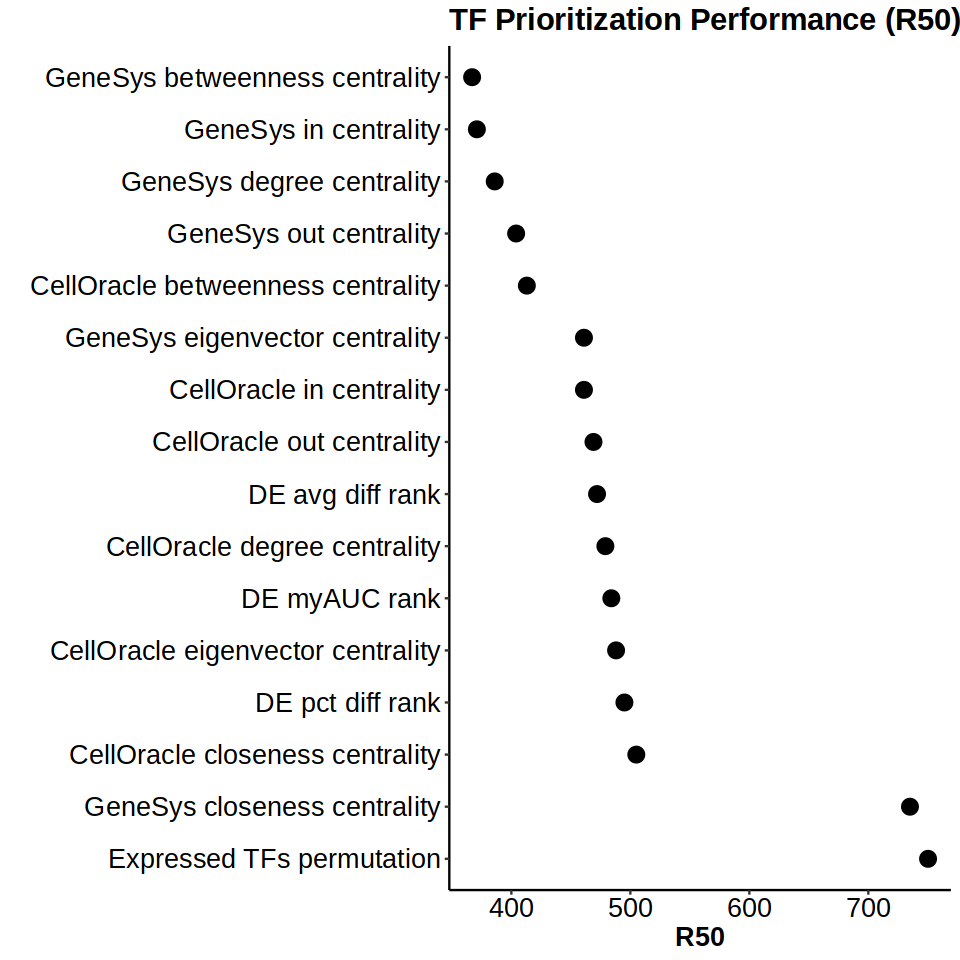

In [67]:
options(repr.plot.width=8, repr.plot.height=8)
ggplot(toplt, aes(x=reorder(Methods, R50, decreasing = TRUE),  y=R50)) + geom_point(size=4)+ 
  labs(title="TF Prioritization Performance (R50)",x="", y = "R50")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

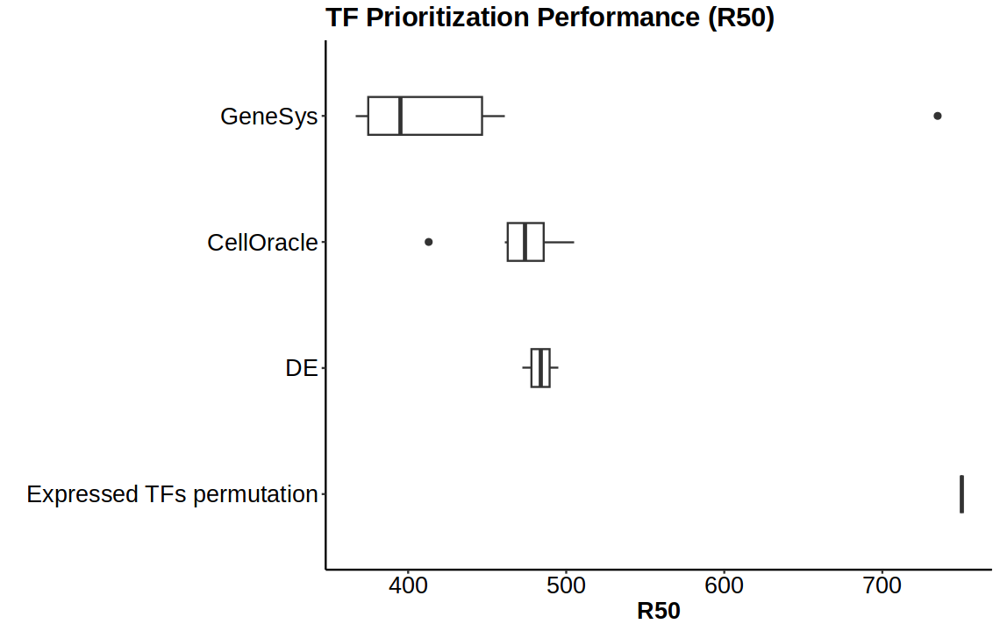

In [68]:
toplt <- data.frame(Methods=factor(c(rep("GeneSys",6), rep("CellOracle",6), rep("DE",3), "Expressed TFs permutation"), 
                                   levels=c("Expressed TFs permutation", "DE", "CellOracle", "GeneSys")), R50=toplt$R50)

options(repr.plot.width=9.5, repr.plot.height=6)
ggplot(toplt, aes(x=Methods, y=R50))+
  geom_boxplot(width=0.3)+ 
  labs(title="TF Prioritization Performance (R50)",x="", y = "R50")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

## R50 for Tissue specific TFs

#### Stele (xylem, phloem, procambium) 

In [69]:
gsgo <- read.csv("./Gold_Standard_Root_TF_StringDB.csv", header=TRUE)
gsgo <- gsgo[which(gsgo[,5]=="Yes"),]
gsgo$preferredName
gsgo <- gsgo$GeneID

[1] "APL"    "ATHB-8" "BHLH48" "DAR2"   "DOF5.3" "DOF5.6" "DOT2"   "ERF104"
 [9] "ET2"    "GATA12" "KAN1"   "KNAT7"  "LBD15"  "LBD18"  "LBD30"  "LBD4"  
[17] "LHW"    "MYB20"  "MYB32"  "MYB43"  "MYB46"  "MYB52"  "MYB61"  "MYB7"  
[25] "MYB83"  "MYB85"  "NAC005" "NAC007" "NAC010" "NAC026" "NAC030" "NAC037"
[33] "NAC043" "NAC045" "NAC075" "NAC076" "NAC083" "NAC086" "NAC101" "NAC104"
[41] "NAC105" "REV"    "WOX14"

In [70]:
length(gsgo)

[1] 43

In [71]:
r50 <- 22 

In [72]:
## Define genesys
run_r50_genesys <- function(x){
    genesys$ct_score <- min_max_normalize(rowSums(apply(genesys[,grep(paste0('xyl_',x,'|phl_',x,'|pro_',x),colnames(genesys))],2,as.numeric)))
    genesys$combined_score <- genesys$ct_score
    
    genesys <- genesys %>% arrange(desc(combined_score))
    count <- 0
    for (i in seq(nrow(genesys))){
        if (genesys$GeneID[i] %in% gsgo){
            count <- count +1
            if (count == r50){
                return(i)
                break
            }
        }
    }
}

In [73]:
## Define celloracle
dat <- rbind(pro, xyl, phl)
## Remove those not present in the dataset
dat <- dat[!is.na(match(dat$X,exptf)),]
dat <- dat %>% group_by(cluster) %>% reframe(GeneID=X,degree_centrality = min_max_normalize(degree_centrality_all), 
                                  in_centrality = min_max_normalize(degree_centrality_in), 
                                  out_centrality = min_max_normalize(degree_centrality_out),
                                 betweenness_centrality = min_max_normalize(betweenness_centrality),
                                 closeness_centrality = min_max_normalize(closeness_centrality),
                                 eigenvector_centrality = min_max_normalize(eigenvector_centrality))
dat <- dat %>% group_by(GeneID) %>% reframe(degree_centrality = sum(degree_centrality), 
                                  in_centrality = sum(in_centrality), 
                                  out_centrality = sum(out_centrality),
                                 betweenness_centrality = sum(betweenness_centrality),
                                 closeness_centrality = sum(closeness_centrality),
                                 eigenvector_centrality = sum(eigenvector_centrality))
dat <- cbind(dat[,1],apply(dat[,2:7],2,min_max_normalize))

celloracle <- dat

run_r50_celloracle <- function(x){
    celloracle$combined_score <- celloracle[,grep(x,colnames(celloracle))]
    celloracle <- celloracle %>% arrange(desc(combined_score))
    count <- 0
    for (i in seq(nrow(celloracle))){
        if (celloracle$GeneID[i] %in% gsgo){
            count <- count +1
            if (count == r50){
                return(i)
                break
            }
        }
    }
} 

In [74]:
## Define DE
de <- read.csv("Root_Atlas_DE_Gene_List.csv")
de <- de %>% filter(celltype=="Xylem"|celltype=="Phloem"|celltype=="Procambium")
## Remove those not present in the dataset
de <- de[!is.na(match(de$gene.ID,exptf)),]
dat <- de %>% group_by(gene.ID) %>% reframe(combined_rank = mean(combined_rank),myAUC_rank = mean(myAUC_rank),pct.diff_rank = mean(pct.diff_rank),avg_diff_rank = mean(avg_diff_rank))
dat <- dat %>% arrange(combined_rank)
colnames(dat) <- c("GeneID","combined_rank","myAUC_rank","pct.diff_rank","avg_diff_rank")
de <- dat
run_r50_de <- function(x){
    de$combined_score <- de[,grep(x,colnames(de))]
    de <- de %>% arrange(desc(combined_score))
    count <- 0
    for (i in seq(nrow(de))){
        if (de$GeneID[i] %in% gsgo){
            count <- count +1
            if (count == r50){
                return(i)
                break
            }
        }
    }
} 

In [75]:
## Expressed TFs permutation
R50_permutation <- c()
for (j in 1:1000){
ran <- sample(exptf, length(exptf), replace=FALSE)
count <- 0
for (i in seq(length(ran))){
    if (ran[i] %in% gsgo){
        count <- count +1
        if (count == r50){
            R50_permutation <- c(R50_permutation,i)
            break
        }
    }
}
} 

In [76]:
toplt <- data.frame(Methods=c("GeneSys degree centrality", "GeneSys out centrality", "GeneSys in centrality", "GeneSys betweenness centrality", 
                 "GeneSys closeness centrality", "GeneSys eigenvector centrality","CellOracle degree centrality", "CellOracle out centrality", 
                 "CellOracle in centrality", "CellOracle betweenness centrality", "CellOracle closeness centrality", "CellOracle eigenvector centrality",
                 "DE myAUC rank", "DE pct diff rank", "DE avg diff rank", "Expressed TFs permutation"),
           R50=c(run_r50_genesys('degree_centrality'),run_r50_genesys('out_centrality'),run_r50_genesys('in_centrality'),
                 run_r50_genesys('betweenness_centrality'),run_r50_genesys('closeness_centrality'),run_r50_genesys('eigenvector_centrality'),
                 run_r50_celloracle('degree_centrality'),run_r50_celloracle('out_centrality'),run_r50_celloracle('in_centrality'),
                 run_r50_celloracle('betweenness_centrality'),run_r50_celloracle('closeness_centrality'),run_r50_celloracle('eigenvector_centrality'),
                 run_r50_de('myAUC_rank'),run_r50_de('pct.diff_rank'),run_r50_de('avg_diff_rank'), mean(R50_permutation)))

In [77]:
toplt

Methods,R50
<chr>,<dbl>
GeneSys degree centrality,99.000
GeneSys out centrality,173.000
GeneSys in centrality,95.000
GeneSys betweenness centrality,117.000
GeneSys closeness centrality,583.000
GeneSys eigenvector centrality,178.000
CellOracle degree centrality,288.000
CellOracle out centrality,255.000
CellOracle in centrality,190.000


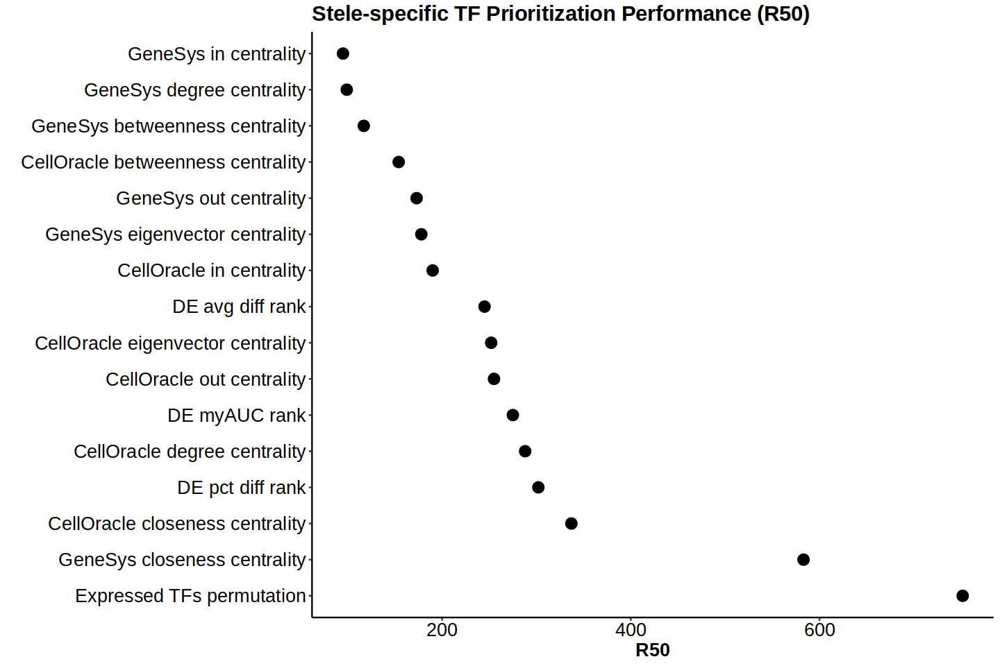

In [78]:
options(repr.plot.width=12, repr.plot.height=8)
ggplot(toplt, aes(x=reorder(Methods, R50, decreasing = TRUE),  y=R50)) + geom_point(size=4)+ 
  labs(title="Stele-specific TF Prioritization Performance (R50)",x="", y = "R50")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

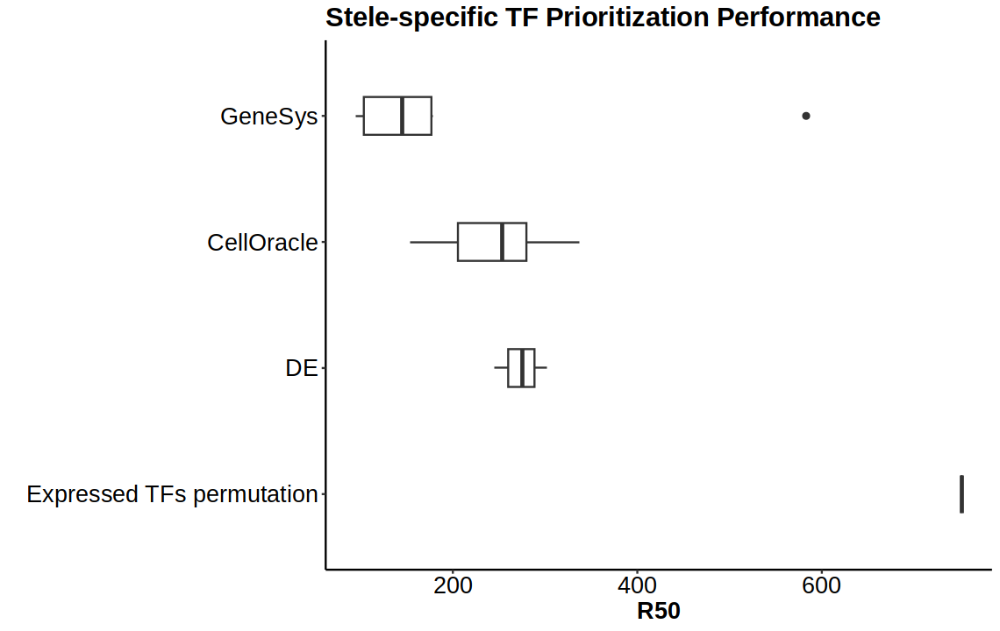

In [79]:
toplt <- data.frame(Methods=factor(c(rep("GeneSys",6), rep("CellOracle",6), rep("DE",3), "Expressed TFs permutation"), 
                                   levels=c("Expressed TFs permutation", "DE", "CellOracle", "GeneSys")), R50=toplt$R50)

options(repr.plot.width=9.5, repr.plot.height=6)
ggplot(toplt, aes(x=Methods, y=R50))+
  geom_boxplot(width=0.3)+ 
  labs(title="Stele-specific TF Prioritization Performance",x="", y = "R50")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

#### Epidermis

In [80]:
gsgo <- read.csv("./Gold_Standard_Root_TF_StringDB.csv", header=TRUE)
gsgo <- gsgo[which(gsgo[,6]=="Yes"),]
gsgo$preferredName
gsgo <- gsgo$GeneID

[1] "AGL16"  "AL6"    "ANL2"   "BHLH12" "BHLH2"  "BHLH32" "BHLH54" "BHLH66"
 [9] "BHLH69" "BHLH82" "BHLH83" "BHLH85" "BHLH86" "CPC"    "E2FB"   "ETC1"  
[17] "GALT2"  "GIS3"   "GL2"    "GL3"    "GTL1"   "HDG11"  "HDG12"  "HDG2"  
[25] "JMJ25"  "MAMYB"  "MYB124" "MYB23"  "MYB86"  "MYB88"  "MYC3"   "MYC4"  
[33] "RBR1"   "SCL22"  "SCL27"  "SCL6"   "SCRM"   "TCX2"   "TCX3"   "TRY"   
[41] "TSO1"   "TTG1"   "WER"    "WRKY44" "WRKY75" "ZFP5"   "ZFP6"   "ZFP8"

In [81]:
length(gsgo)
r50 <- 24

[1] 48

In [82]:
## Define genesys
run_r50_genesys <- function(x){
    genesys$ct_score <- min_max_normalize(rowSums(apply(genesys[,grep(paste0('atri_',x,'|tri_',x,'|lrc_',x),colnames(genesys))],2,as.numeric)))
    genesys$combined_score <- genesys$ct_score
    
    genesys <- genesys %>% arrange(desc(combined_score))
    count <- 0
    for (i in seq(nrow(genesys))){
        if (genesys$GeneID[i] %in% gsgo){
            count <- count +1
            if (count == r50){
                return(i)
                break
            }
        }
    }
}

In [83]:
## Define celloracle
dat <- rbind(atri, tri, lrc)
## Remove those not present in the dataset
dat <- dat[!is.na(match(dat$X,exptf)),]
dat <- dat %>% group_by(cluster) %>% reframe(GeneID=X,degree_centrality = min_max_normalize(degree_centrality_all), 
                                  in_centrality = min_max_normalize(degree_centrality_in), 
                                  out_centrality = min_max_normalize(degree_centrality_out),
                                 betweenness_centrality = min_max_normalize(betweenness_centrality),
                                 closeness_centrality = min_max_normalize(closeness_centrality),
                                 eigenvector_centrality = min_max_normalize(eigenvector_centrality))
dat <- dat %>% group_by(GeneID) %>% reframe(degree_centrality = sum(degree_centrality), 
                                  in_centrality = sum(in_centrality), 
                                  out_centrality = sum(out_centrality),
                                 betweenness_centrality = sum(betweenness_centrality),
                                 closeness_centrality = sum(closeness_centrality),
                                 eigenvector_centrality = sum(eigenvector_centrality))
dat <- cbind(dat[,1],apply(dat[,2:7],2,min_max_normalize))

celloracle <- dat

run_r50_celloracle <- function(x){
    celloracle$combined_score <- celloracle[,grep(x,colnames(celloracle))]
    celloracle <- celloracle %>% arrange(desc(combined_score))
    count <- 0
    for (i in seq(nrow(celloracle))){
        if (celloracle$GeneID[i] %in% gsgo){
            count <- count +1
            if (count == r50){
                return(i)
                break
            }
        }
    }
} 

In [84]:
## Define DE
de <- read.csv("Root_Atlas_DE_Gene_List.csv")
de <- de %>% filter(celltype=="Atrichoblast"|celltype=="Trichoblast"|celltype=="Lateral Root Cap")
## Remove those not present in the dataset
de <- de[!is.na(match(de$gene.ID,exptf)),]
dat <- de %>% group_by(gene.ID) %>% reframe(combined_rank = mean(combined_rank),myAUC_rank = mean(myAUC_rank),pct.diff_rank = mean(pct.diff_rank),avg_diff_rank = mean(avg_diff_rank))
dat <- dat %>% arrange(combined_rank)
colnames(dat) <- c("GeneID","combined_rank","myAUC_rank","pct.diff_rank","avg_diff_rank")
de <- dat
run_r50_de <- function(x){
    de$combined_score <- de[,grep(x,colnames(de))]
    de <- de %>% arrange(desc(combined_score))
    count <- 0
    for (i in seq(nrow(de))){
        if (de$GeneID[i] %in% gsgo){
            count <- count +1
            if (count == r50){
                return(i)
                break
            }
        }
    }
} 

In [85]:
## Expressed TFs permutation
R50_permutation <- c()
for (j in 1:1000){
ran <- sample(exptf, length(exptf), replace=FALSE)
count <- 0
for (i in seq(length(ran))){
    if (ran[i] %in% gsgo){
        count <- count +1
        if (count == r50){
            R50_permutation <- c(R50_permutation,i)
            break
        }
    }
}
} 

In [86]:
toplt <- data.frame(Methods=c("GeneSys degree centrality", "GeneSys out centrality", "GeneSys in centrality", "GeneSys betweenness centrality", 
                 "GeneSys closeness centrality", "GeneSys eigenvector centrality","CellOracle degree centrality", "CellOracle out centrality", 
                 "CellOracle in centrality", "CellOracle betweenness centrality", "CellOracle closeness centrality", "CellOracle eigenvector centrality",
                 "DE myAUC rank", "DE pct diff rank", "DE avg diff rank", "Expressed TFs permutation"),
           R50=c(run_r50_genesys('degree_centrality'),run_r50_genesys('out_centrality'),run_r50_genesys('in_centrality'),
                 run_r50_genesys('betweenness_centrality'),run_r50_genesys('closeness_centrality'),run_r50_genesys('eigenvector_centrality'),
                 run_r50_celloracle('degree_centrality'),run_r50_celloracle('out_centrality'),run_r50_celloracle('in_centrality'),
                 run_r50_celloracle('betweenness_centrality'),run_r50_celloracle('closeness_centrality'),run_r50_celloracle('eigenvector_centrality'),
                 999,999,999, mean(R50_permutation)))

In [87]:
toplt

Methods,R50
<chr>,<dbl>
GeneSys degree centrality,284.000
GeneSys out centrality,309.000
GeneSys in centrality,299.000
GeneSys betweenness centrality,284.000
GeneSys closeness centrality,324.000
GeneSys eigenvector centrality,254.000
CellOracle degree centrality,391.000
CellOracle out centrality,365.000
CellOracle in centrality,455.000


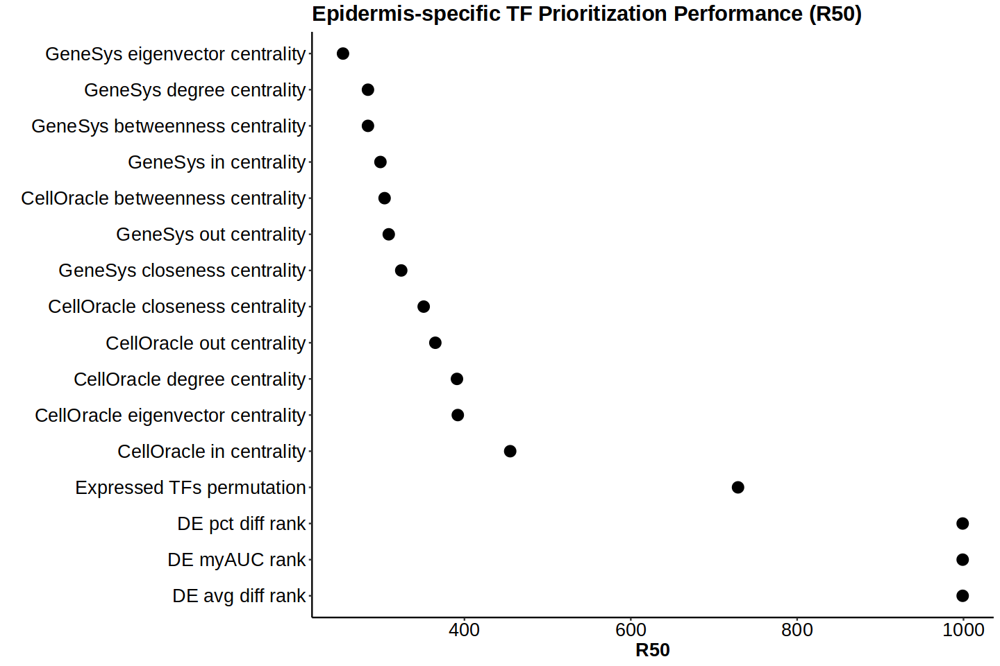

In [88]:
options(repr.plot.width=12, repr.plot.height=8)
ggplot(toplt, aes(x=reorder(Methods, R50, decreasing = TRUE),  y=R50)) + geom_point(size=4)+ 
  labs(title="Epidermis-specific TF Prioritization Performance (R50)",x="", y = "R50")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

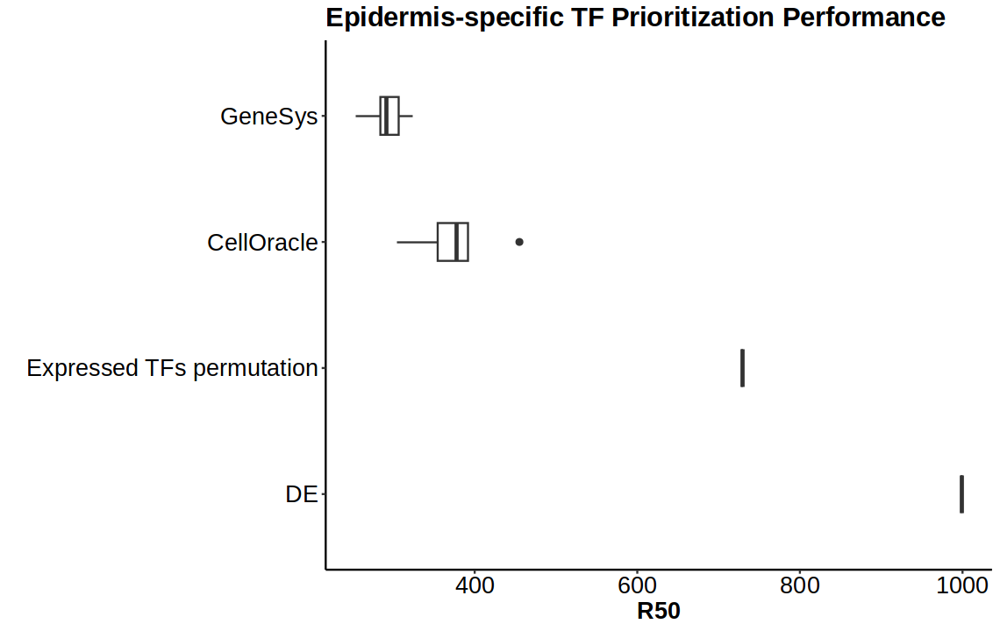

In [89]:
toplt <- data.frame(Methods=factor(c(rep("GeneSys",6), rep("CellOracle",6), rep("DE",3), "Expressed TFs permutation"), 
                                   levels=c("DE","Expressed TFs permutation", "CellOracle", "GeneSys")), R50=toplt$R50)

options(repr.plot.width=9.5, repr.plot.height=6)
ggplot(toplt, aes(x=Methods, y=R50))+
  geom_boxplot(width=0.3)+ 
  labs(title="Epidermis-specific TF Prioritization Performance",x="", y = "R50")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

## R50 for celltype specific

#### Xylem

In [90]:
gsgo <- read.csv("./Gold_Standard_Root_TF_StringDB.csv", header=TRUE)
gsgo <- gsgo[which(gsgo[,7]=="Yes"),]
gsgo$preferredName
gsgo <- gsgo$GeneID

[1] "APL"    "ATHB-8" "BHLH48" "ET2"    "KNAT7"  "LBD18"  "LBD30"  "LHW"   
 [9] "MYB20"  "MYB32"  "MYB43"  "MYB46"  "MYB52"  "MYB61"  "MYB7"   "MYB83" 
[17] "MYB85"  "NAC005" "NAC007" "NAC010" "NAC026" "NAC030" "NAC037" "NAC043"
[25] "NAC076" "NAC083" "NAC101" "NAC104" "NAC105" "REV"

In [91]:
length(gsgo)
r50 <- 15

[1] 30

In [92]:
## Define genesys
run_r50_genesys <- function(x){
    genesys$ct_score <- min_max_normalize(rowSums(apply(genesys[,grep(paste0('xyl_',x),colnames(genesys))],2,as.numeric)))
    genesys$combined_score <- genesys$ct_score
    
    genesys <- genesys %>% arrange(desc(combined_score))
    count <- 0
    for (i in seq(nrow(genesys))){
        if (genesys$GeneID[i] %in% gsgo){
            count <- count +1
            if (count == r50){
                return(i)
                break
            }
        }
    }
}

In [93]:
## Define celloracle
dat <- rbind(xyl)
## Remove those not present in the dataset
dat <- dat[!is.na(match(dat$X,exptf)),]
dat <- dat %>% group_by(cluster) %>% reframe(GeneID=X,degree_centrality = min_max_normalize(degree_centrality_all), 
                                  in_centrality = min_max_normalize(degree_centrality_in), 
                                  out_centrality = min_max_normalize(degree_centrality_out),
                                 betweenness_centrality = min_max_normalize(betweenness_centrality),
                                 closeness_centrality = min_max_normalize(closeness_centrality),
                                 eigenvector_centrality = min_max_normalize(eigenvector_centrality))
dat <- dat %>% group_by(GeneID) %>% reframe(degree_centrality = sum(degree_centrality), 
                                  in_centrality = sum(in_centrality), 
                                  out_centrality = sum(out_centrality),
                                 betweenness_centrality = sum(betweenness_centrality),
                                 closeness_centrality = sum(closeness_centrality),
                                 eigenvector_centrality = sum(eigenvector_centrality))
dat <- cbind(dat[,1],apply(dat[,2:7],2,min_max_normalize))

celloracle <- dat

run_r50_celloracle <- function(x){
    celloracle$combined_score <- celloracle[,grep(x,colnames(celloracle))]
    celloracle <- celloracle %>% arrange(desc(combined_score))
    count <- 0
    for (i in seq(nrow(celloracle))){
        if (celloracle$GeneID[i] %in% gsgo){
            count <- count +1
            if (count == r50){
                return(i)
                break
            }
        }
    }
} 

In [94]:
## Define DE
de <- read.csv("Root_Atlas_DE_Gene_List.csv")
de <- de %>% filter(celltype=="Xylem")
## Remove those not present in the dataset
de <- de[!is.na(match(de$gene.ID,exptf)),]
dat <- de %>% group_by(gene.ID) %>% reframe(combined_rank = mean(combined_rank),myAUC_rank = mean(myAUC_rank),pct.diff_rank = mean(pct.diff_rank),avg_diff_rank = mean(avg_diff_rank))
dat <- dat %>% arrange(combined_rank)
colnames(dat) <- c("GeneID","combined_rank","myAUC_rank","pct.diff_rank","avg_diff_rank")
de <- dat
run_r50_de <- function(x){
    de$combined_score <- de[,grep(x,colnames(de))]
    de <- de %>% arrange(desc(combined_score))
    count <- 0
    for (i in seq(nrow(de))){
        if (de$GeneID[i] %in% gsgo){
            count <- count +1
            if (count == r50){
                return(i)
                break
            }
        }
    }
} 

In [95]:
## Expressed TFs permutation
R50_permutation <- c()
for (j in 1:1000){
ran <- sample(exptf, length(exptf), replace=FALSE)
count <- 0
for (i in seq(length(ran))){
    if (ran[i] %in% gsgo){
        count <- count +1
        if (count == r50){
            R50_permutation <- c(R50_permutation,i)
            break
        }
    }
}
} 

In [96]:
toplt <- data.frame(Methods=c("GeneSys degree centrality", "GeneSys out centrality", "GeneSys in centrality", "GeneSys betweenness centrality", 
                 "GeneSys closeness centrality", "GeneSys eigenvector centrality","CellOracle degree centrality", "CellOracle out centrality", 
                 "CellOracle in centrality", "CellOracle betweenness centrality", "CellOracle closeness centrality", "CellOracle eigenvector centrality",
                 "DE myAUC rank", "DE pct diff rank", "DE avg diff rank", "Expressed TFs permutation"),
           R50=c(run_r50_genesys('degree_centrality'),run_r50_genesys('out_centrality'),run_r50_genesys('in_centrality'),
                 run_r50_genesys('betweenness_centrality'),run_r50_genesys('closeness_centrality'),run_r50_genesys('eigenvector_centrality'),
                 run_r50_celloracle('degree_centrality'),run_r50_celloracle('out_centrality'),run_r50_celloracle('in_centrality'),
                 run_r50_celloracle('betweenness_centrality'),run_r50_celloracle('closeness_centrality'),run_r50_celloracle('eigenvector_centrality'),
                 run_r50_de('myAUC_rank'),run_r50_de('pct.diff_rank'),run_r50_de('avg_diff_rank'), mean(R50_permutation)))

In [97]:
toplt

Methods,R50
<chr>,<dbl>
GeneSys degree centrality,33.000
GeneSys out centrality,60.000
GeneSys in centrality,28.000
GeneSys betweenness centrality,74.000
GeneSys closeness centrality,49.000
GeneSys eigenvector centrality,53.000
CellOracle degree centrality,90.000
CellOracle out centrality,88.000
CellOracle in centrality,65.000


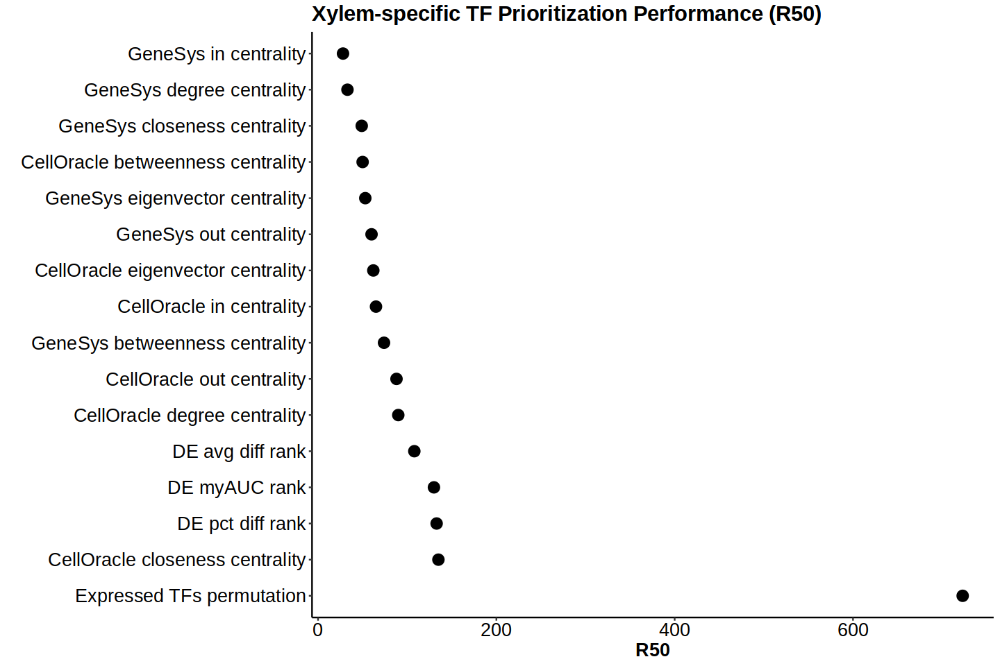

In [98]:
options(repr.plot.width=12, repr.plot.height=8)
ggplot(toplt, aes(x=reorder(Methods, R50, decreasing = TRUE),  y=R50)) + geom_point(size=4)+ 
  labs(title="Xylem-specific TF Prioritization Performance (R50)",x="", y = "R50")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

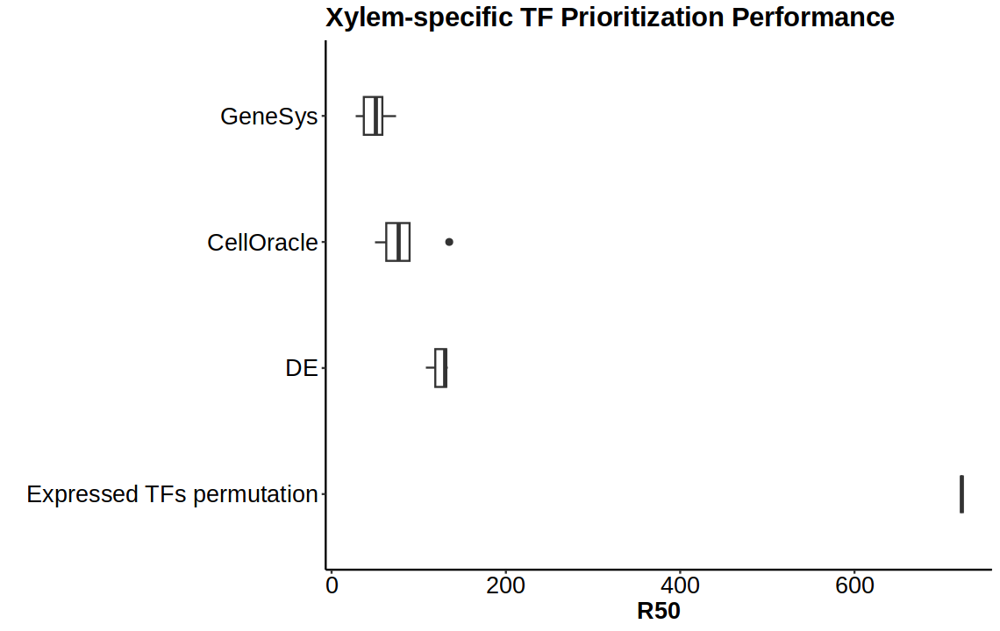

In [99]:
toplt <- data.frame(Methods=factor(c(rep("GeneSys",6), rep("CellOracle",6), rep("DE",3), "Expressed TFs permutation"), 
                                   levels=c("Expressed TFs permutation","DE", "CellOracle", "GeneSys")), R50=toplt$R50)

options(repr.plot.width=9.5, repr.plot.height=6)
ggplot(toplt, aes(x=Methods, y=R50))+
  geom_boxplot(width=0.3)+ 
  labs(title="Xylem-specific TF Prioritization Performance",x="", y = "R50")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

#### Trichoblast

In [100]:
gsgo <- read.csv("./Gold_Standard_Root_TF_StringDB.csv", header=TRUE)
gsgo <- gsgo[which(gsgo[,8]=="Yes"),]
gsgo$preferredName
gsgo <- gsgo$GeneID

[1] "AL6"    "ANL2"   "BHLH12" "BHLH2"  "BHLH32" "BHLH54" "BHLH66" "BHLH69"
 [9] "BHLH82" "BHLH83" "BHLH85" "BHLH86" "CPC"    "E2FB"   "ETC1"   "GALT2" 
[17] "GIS3"   "GL2"    "GL3"    "GTL1"   "HDG11"  "HDG12"  "HDG2"   "MAMYB" 
[25] "MYB23"  "MYB86"  "RBR1"   "SCL22"  "SCL27"  "SCL6"   "TRY"    "TTG1"  
[33] "WER"    "ZFP5"   "ZFP6"   "ZFP8"

In [101]:
length(gsgo)
r50 <- 18

[1] 36

In [102]:
## Define genesys
run_r50_genesys <- function(x){
    genesys$ct_score <- min_max_normalize(rowSums(apply(genesys[,grep(paste0('^tri_',x),colnames(genesys))],2,as.numeric)))
    genesys$combined_score <- genesys$ct_score
    
    genesys <- genesys %>% arrange(desc(combined_score))
    count <- 0
    for (i in seq(nrow(genesys))){
        if (genesys$GeneID[i] %in% gsgo){
            count <- count +1
            if (count == r50){
                return(i)
                break
            }
        }
    }
}

In [103]:
## Define celloracle
dat <- rbind(tri)
## Remove those not present in the dataset
dat <- dat[!is.na(match(dat$X,exptf)),]
dat <- dat %>% group_by(cluster) %>% reframe(GeneID=X,degree_centrality = min_max_normalize(degree_centrality_all), 
                                  in_centrality = min_max_normalize(degree_centrality_in), 
                                  out_centrality = min_max_normalize(degree_centrality_out),
                                 betweenness_centrality = min_max_normalize(betweenness_centrality),
                                 closeness_centrality = min_max_normalize(closeness_centrality),
                                 eigenvector_centrality = min_max_normalize(eigenvector_centrality))
dat <- dat %>% group_by(GeneID) %>% reframe(degree_centrality = sum(degree_centrality), 
                                  in_centrality = sum(in_centrality), 
                                  out_centrality = sum(out_centrality),
                                 betweenness_centrality = sum(betweenness_centrality),
                                 closeness_centrality = sum(closeness_centrality),
                                 eigenvector_centrality = sum(eigenvector_centrality))
dat <- cbind(dat[,1],apply(dat[,2:7],2,min_max_normalize))

celloracle <- dat

run_r50_celloracle <- function(x){
    celloracle$combined_score <- celloracle[,grep(x,colnames(celloracle))]
    celloracle <- celloracle %>% arrange(desc(combined_score))
    count <- 0
    for (i in seq(nrow(celloracle))){
        if (celloracle$GeneID[i] %in% gsgo){
            count <- count +1
            if (count == r50){
                return(i)
                break
            }
        }
    }
} 

In [104]:
## Define DE
de <- read.csv("Root_Atlas_DE_Gene_List.csv")
de <- de %>% filter(celltype=="Trichoblast")
## Remove those not present in the dataset
de <- de[!is.na(match(de$gene.ID,exptf)),]
dat <- de %>% group_by(gene.ID) %>% reframe(combined_rank = mean(combined_rank),myAUC_rank = mean(myAUC_rank),pct.diff_rank = mean(pct.diff_rank),avg_diff_rank = mean(avg_diff_rank))
dat <- dat %>% arrange(combined_rank)
colnames(dat) <- c("GeneID","combined_rank","myAUC_rank","pct.diff_rank","avg_diff_rank")
de <- dat
run_r50_de <- function(x){
    de$combined_score <- de[,grep(x,colnames(de))]
    de <- de %>% arrange(desc(combined_score))
    count <- 0
    for (i in seq(nrow(de))){
        if (de$GeneID[i] %in% gsgo){
            count <- count +1
            if (count == r50){
                return(i)
                break
            }
        }
    }
} 

In [105]:
## Expressed TFs permutation
R50_permutation <- c()
for (j in 1:1000){
ran <- sample(exptf, length(exptf), replace=FALSE)
count <- 0
for (i in seq(length(ran))){
    if (ran[i] %in% gsgo){
        count <- count +1
        if (count == r50){
            R50_permutation <- c(R50_permutation,i)
            break
        }
    }
}
} 

In [106]:
toplt <- data.frame(Methods=c("GeneSys degree centrality", "GeneSys out centrality", "GeneSys in centrality", "GeneSys betweenness centrality", 
                 "GeneSys closeness centrality", "GeneSys eigenvector centrality","CellOracle degree centrality", "CellOracle out centrality", 
                 "CellOracle in centrality", "CellOracle betweenness centrality", "CellOracle closeness centrality", "CellOracle eigenvector centrality",
                 "DE myAUC rank", "DE pct diff rank", "DE avg diff rank", "Expressed TFs permutation"),
           R50=c(run_r50_genesys('degree_centrality'),run_r50_genesys('out_centrality'),run_r50_genesys('in_centrality'),
                 run_r50_genesys('betweenness_centrality'),run_r50_genesys('closeness_centrality'),run_r50_genesys('eigenvector_centrality'),
                 run_r50_celloracle('degree_centrality'),run_r50_celloracle('out_centrality'),run_r50_celloracle('in_centrality'),
                 run_r50_celloracle('betweenness_centrality'),run_r50_celloracle('closeness_centrality'),run_r50_celloracle('eigenvector_centrality'),
                 999,999,999, mean(R50_permutation)))

In [107]:
toplt

Methods,R50
<chr>,<dbl>
GeneSys degree centrality,189.000
GeneSys out centrality,217.000
GeneSys in centrality,212.000
GeneSys betweenness centrality,262.000
GeneSys closeness centrality,271.000
GeneSys eigenvector centrality,194.000
CellOracle degree centrality,508.000
CellOracle out centrality,476.000
CellOracle in centrality,425.000


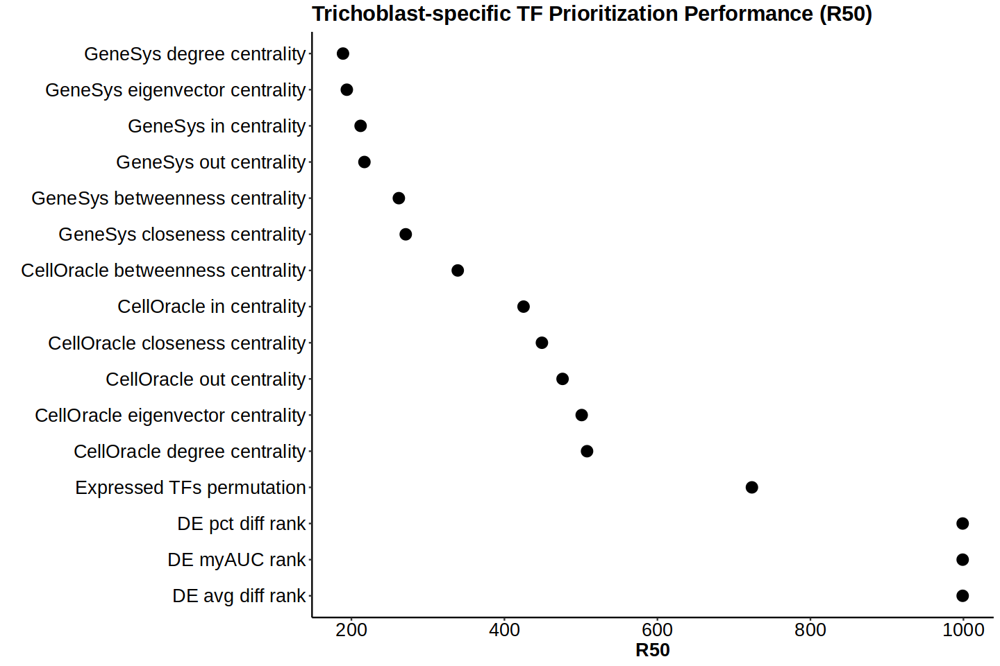

In [108]:
options(repr.plot.width=12, repr.plot.height=8)
ggplot(toplt, aes(x=reorder(Methods, R50, decreasing = TRUE),  y=R50)) + geom_point(size=4)+ 
  labs(title="Trichoblast-specific TF Prioritization Performance (R50)",x="", y = "R50")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

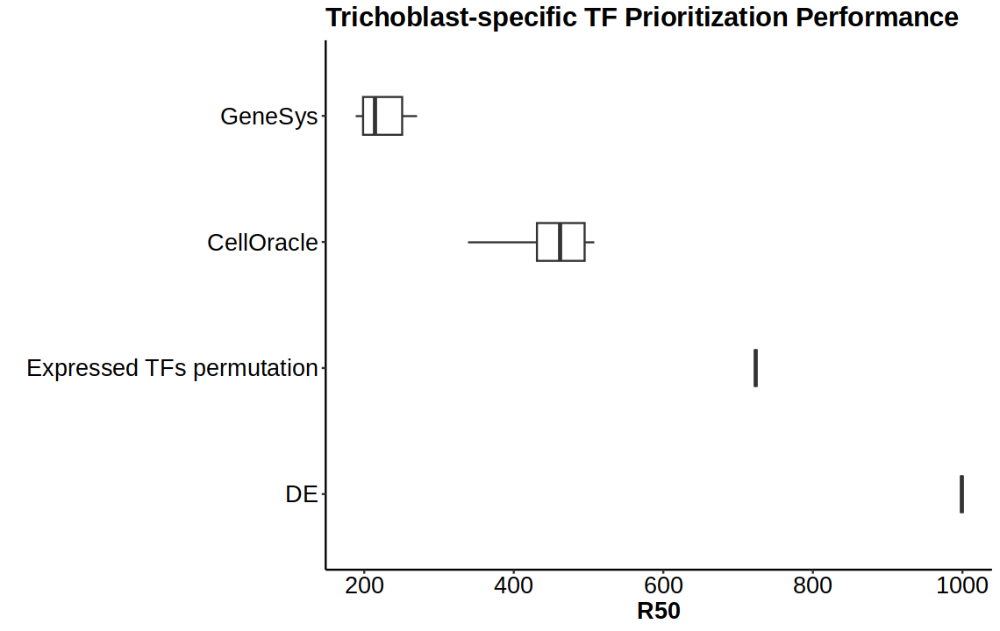

In [109]:
toplt <- data.frame(Methods=factor(c(rep("GeneSys",6), rep("CellOracle",6), rep("DE",3), "Expressed TFs permutation"), 
                                   levels=c("DE","Expressed TFs permutation", "CellOracle", "GeneSys")), R50=toplt$R50)

options(repr.plot.width=9.5, repr.plot.height=6)
ggplot(toplt, aes(x=Methods, y=R50))+
  geom_boxplot(width=0.3)+ 
  labs(title="Trichoblast-specific TF Prioritization Performance",x="", y = "R50")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

## Plotting

In [110]:
dat <- genesys

In [111]:
plot_heatmap <- function(gene, centrality){
    sub <- as.numeric(t(dat[which(dat$TF==gene),grep(centrality,colnames(dat))]))
    sub <- as.matrix(cbind(sub[1:10],sub[11:20],sub[21:30],sub[31:40],sub[41:50]))
    ## Cell types
    rownames(sub) <- c('Atrichoblast','Trichoblast','LRC','Cortex','Endodermis','Pericycle','Procambium','Xylem','Phloem','Columella')
    ## Transition
    colnames(sub) <- c('t0-t1', 't1-t3', 't3-t5', 't5-t7', 't7-t9')
    # Reorder rows
    sub <- sub[c(8,9,7,6,5,4,2,1,3,10),]
    col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))

    Heatmap(sub, rect_gp = gpar(col = "white", lwd = 1) , show_heatmap_legend = TRUE, name = paste0(gene,"\n","weighted","\n","network","\n","centrality"),
            col = col_fun, column_title = paste0(str_split_i(centrality,"_",1),"\n",str_split_i(centrality,"_",2)), column_title_gp = gpar(fontsize = 12, fontface = "bold"), 
            cluster_rows = FALSE, cluster_columns = FALSE,
            show_column_names = FALSE, bottom_annotation = HeatmapAnnotation(
            text = anno_text(colnames(sub), rot = 60, location = unit(1, "npc"), just = "right"))
       )
}

In [112]:
plot_heatmap2 <- function(gene, centrality){
    sub <- as.numeric(t(dat[which(dat$TF==gene),grep(centrality,colnames(dat))]))
    sub <- as.matrix(cbind(sub[1:10],sub[11:20],sub[21:30],sub[31:40],sub[41:50]))
    ## Cell types
    rownames(sub) <- c('Atrichoblast','Trichoblast','LRC','Cortex','Endodermis','Pericycle','Procambium','Xylem','Phloem','Columella')
    ## Transition
    colnames(sub) <- c('t0-t1', 't1-t3', 't3-t5', 't5-t7', 't7-t9')
    # Reorder rows
    sub <- sub[c(8,9,7,6,5,4,2,1,3,10),]
    col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))

    Heatmap(sub, rect_gp = gpar(col = "white", lwd = 1) , show_heatmap_legend = FALSE,
            col = col_fun, column_title = "out degree \n centrality", column_title_gp = gpar(fontsize = 12, fontface = "bold"), 
            cluster_rows = FALSE, cluster_columns = FALSE,
            show_column_names = FALSE, bottom_annotation = HeatmapAnnotation(
            text = anno_text(colnames(sub), rot = 60, location = unit(1, "npc"), just = "right"))
       )
}

In [113]:
plot_heatmap3 <- function(gene, centrality){
    sub <- as.numeric(t(dat[which(dat$TF==gene),grep(centrality,colnames(dat))]))
    sub <- as.matrix(cbind(sub[1:10],sub[11:20],sub[21:30],sub[31:40],sub[41:50]))
    ## Cell types
    rownames(sub) <- c('Atrichoblast','Trichoblast','LRC','Cortex','Endodermis','Pericycle','Procambium','Xylem','Phloem','Columella')
    ## Transition
    colnames(sub) <- c('t0-t1', 't1-t3', 't3-t5', 't5-t7', 't7-t9')
    # Reorder rows
    sub <- sub[c(8,9,7,6,5,4,2,1,3,10),]
    col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))

    Heatmap(sub, rect_gp = gpar(col = "white", lwd = 1), name = paste0("unweighted","\n","network","\n","centrality"),
            col = col_fun, column_title = "in degree \n centrality", column_title_gp = gpar(fontsize = 12, fontface = "bold"), 
            cluster_rows = FALSE, cluster_columns = FALSE,
            show_column_names = FALSE, bottom_annotation = HeatmapAnnotation(
            text = anno_text(colnames(sub), rot = 60, location = unit(1, "npc"), just = "right"))
       )
}

In [114]:
plot_all_centrality <- function(gene){
    options(repr.plot.width=10, repr.plot.height=6)
    plot_heatmap(gene,"betweenness_centrality") + plot_heatmap2(gene,"out_centrality") + plot_heatmap3(gene,"in_centrality")
}

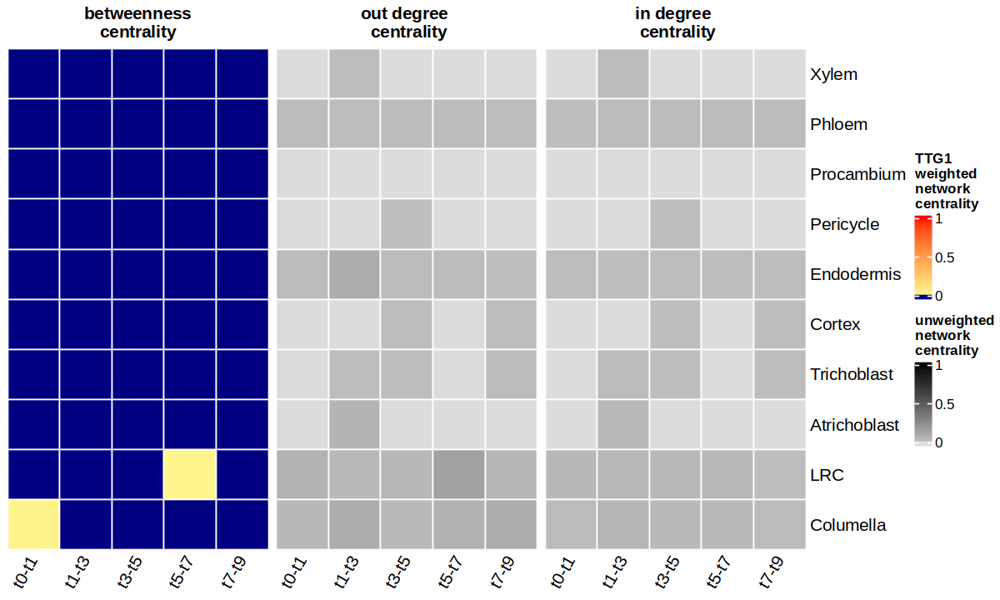

In [115]:
plot_all_centrality("TTG1")

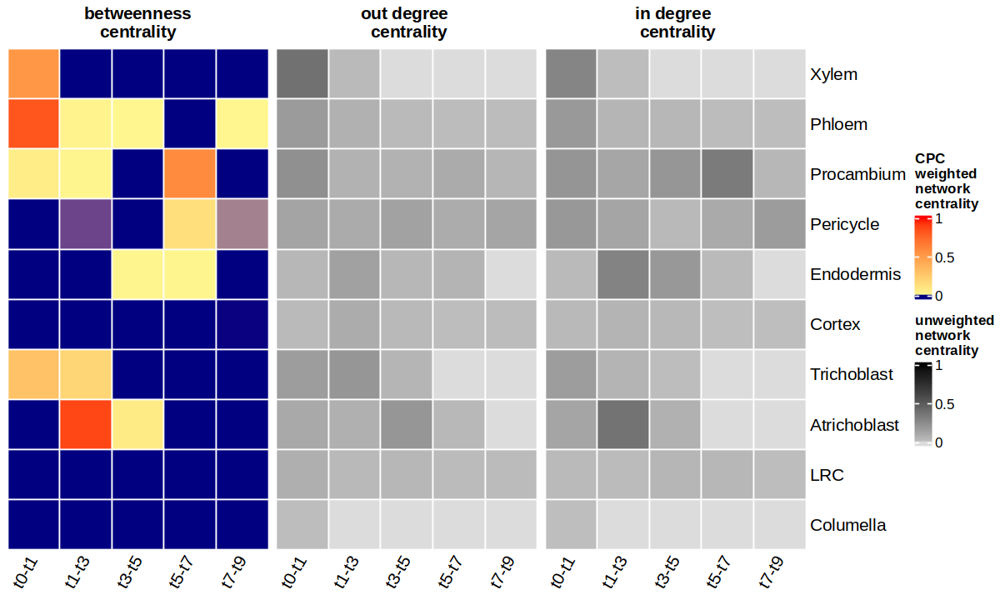

In [116]:
plot_all_centrality("CPC")

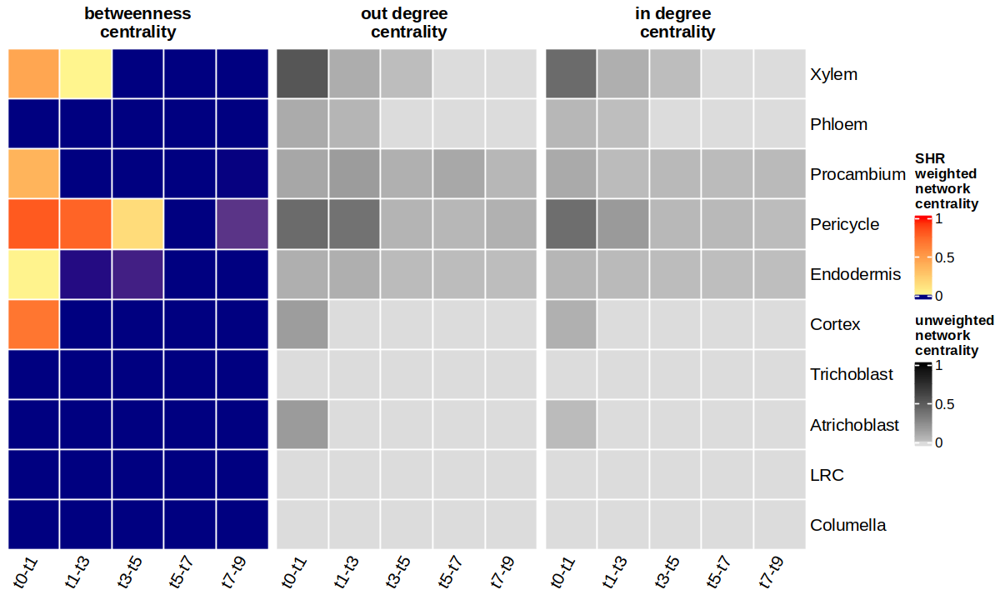

In [117]:
plot_all_centrality("SHR")

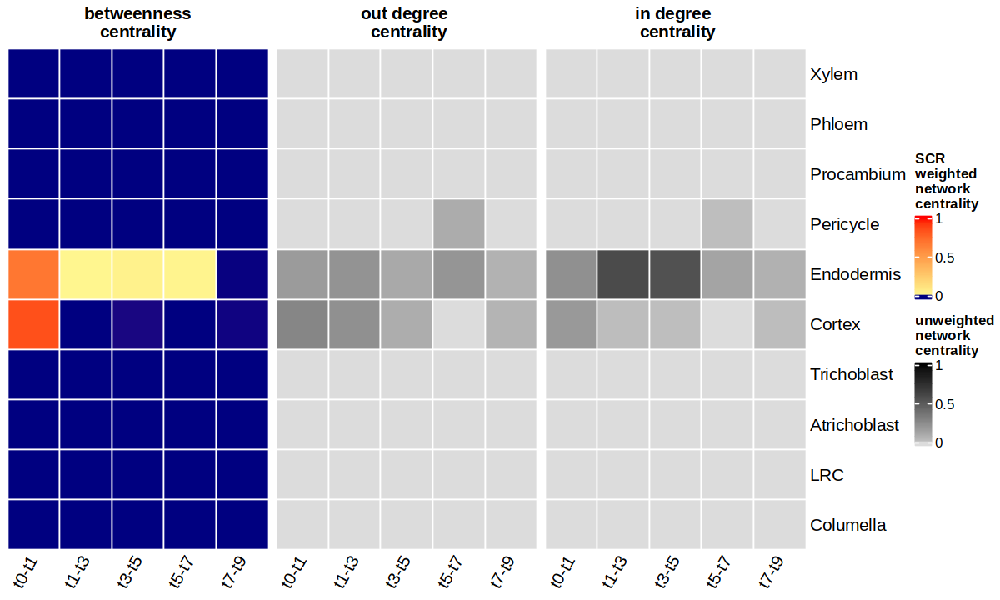

In [118]:
plot_all_centrality("SCR")

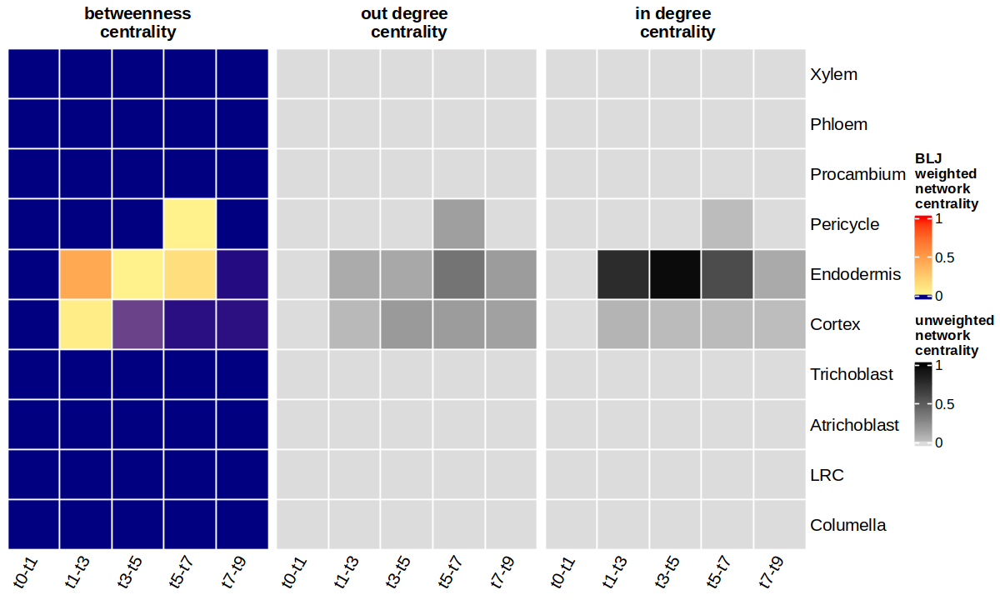

In [120]:
plot_all_centrality("BLJ")

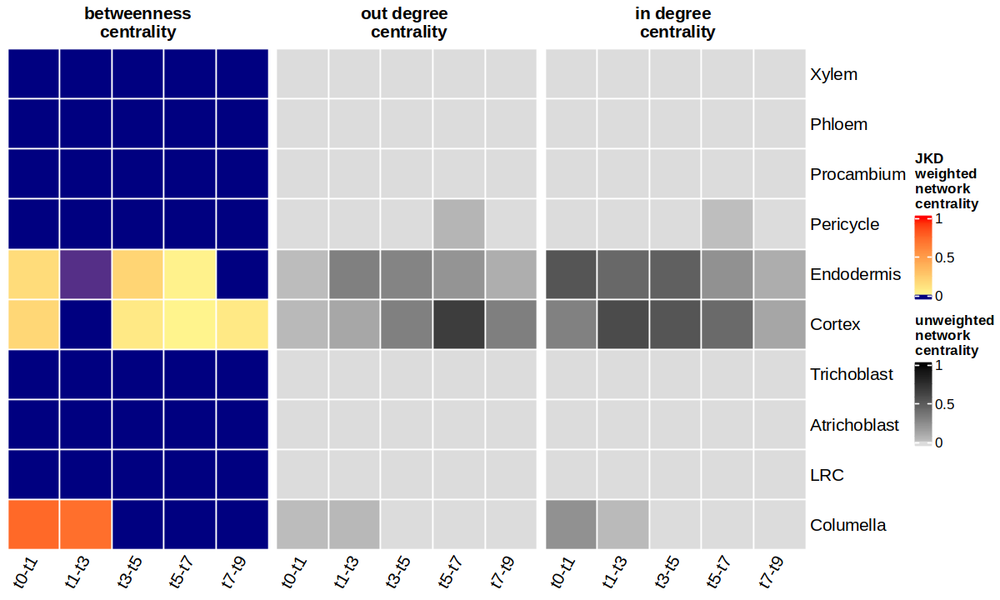

In [121]:
plot_all_centrality("JKD")

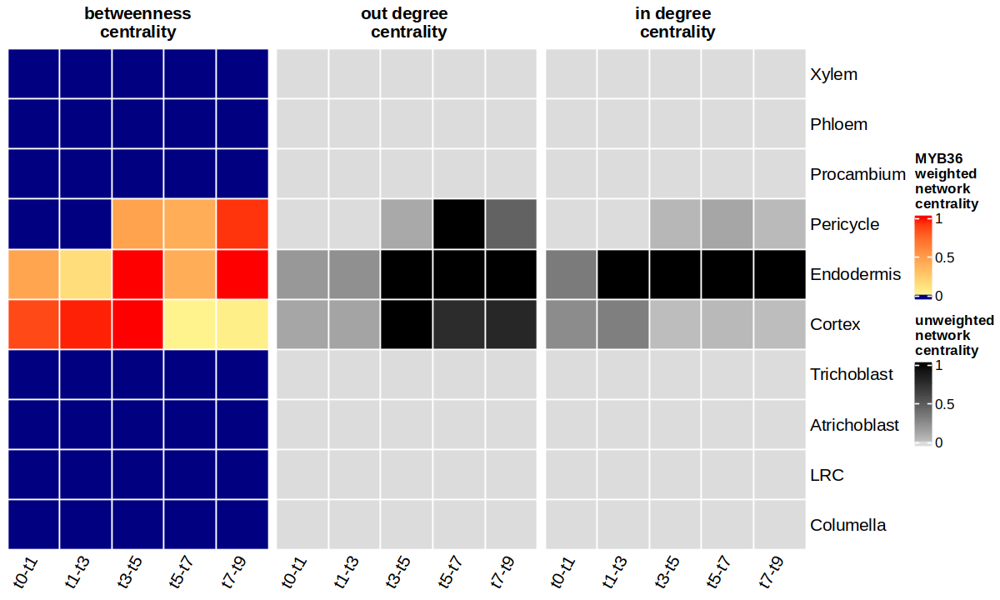

In [122]:
plot_all_centrality("MYB36")

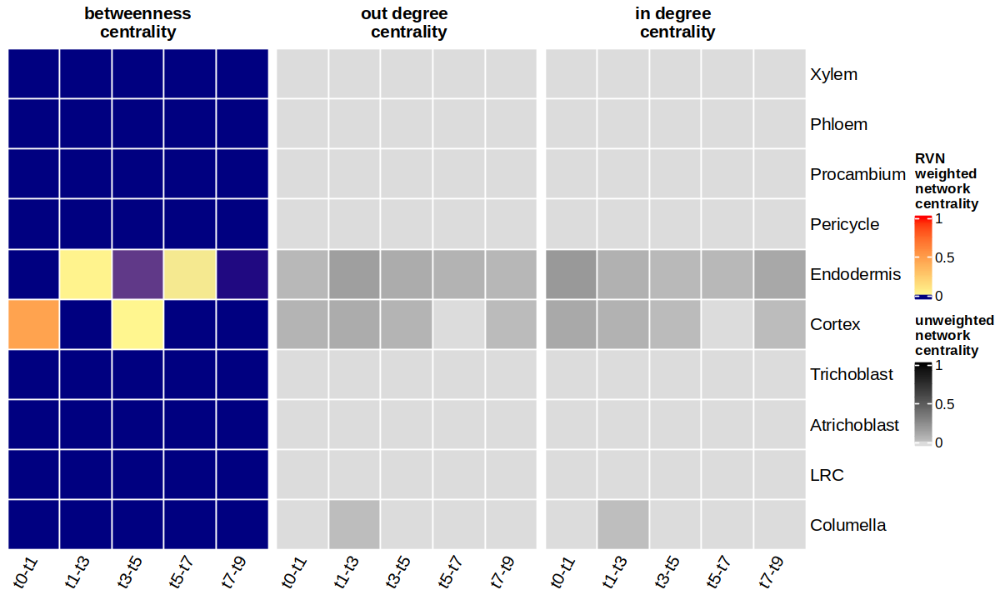

In [123]:
plot_all_centrality("RVN")

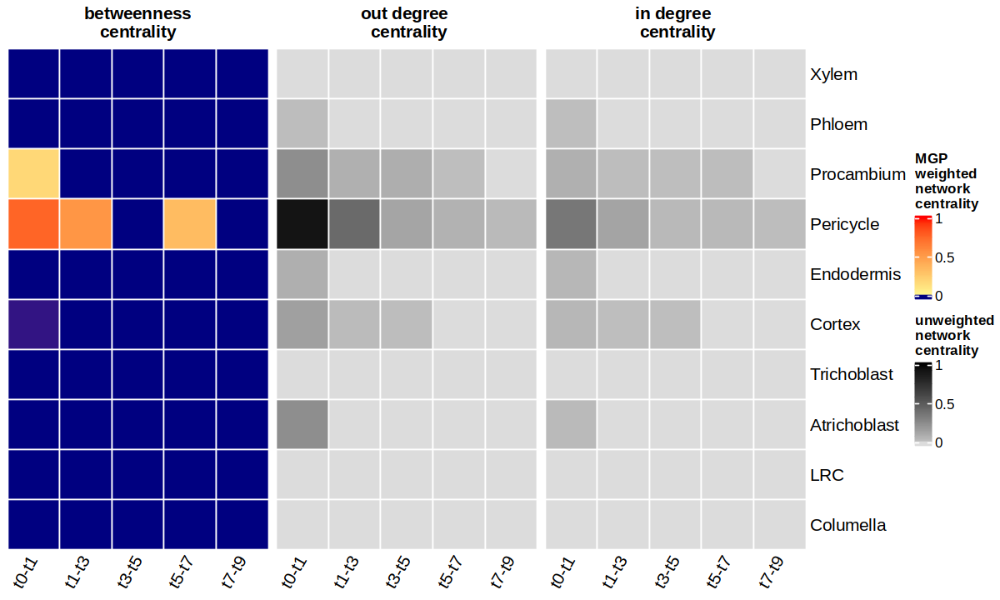

In [124]:
plot_all_centrality("MGP")

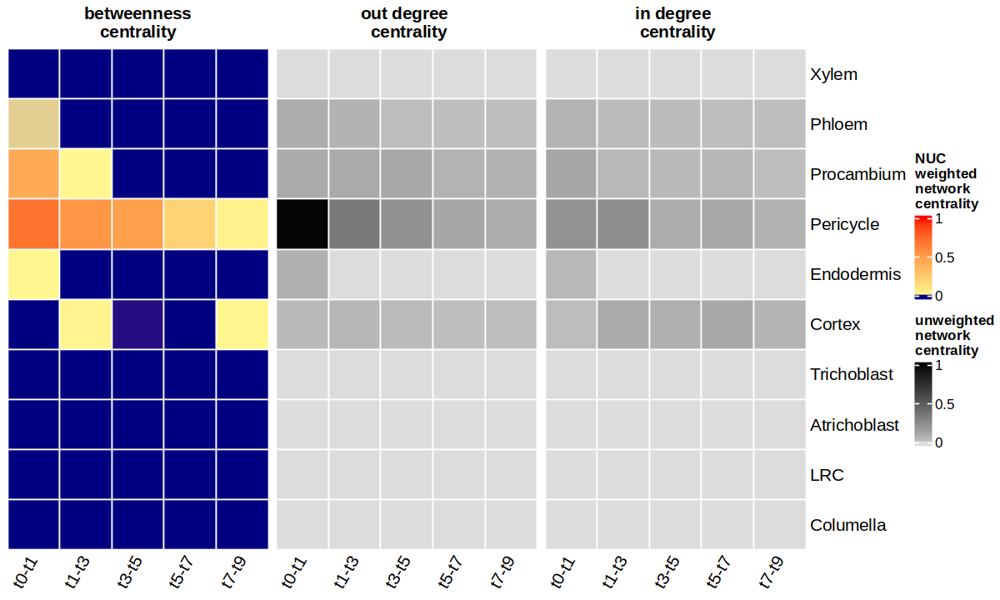

In [125]:
plot_all_centrality("NUC")

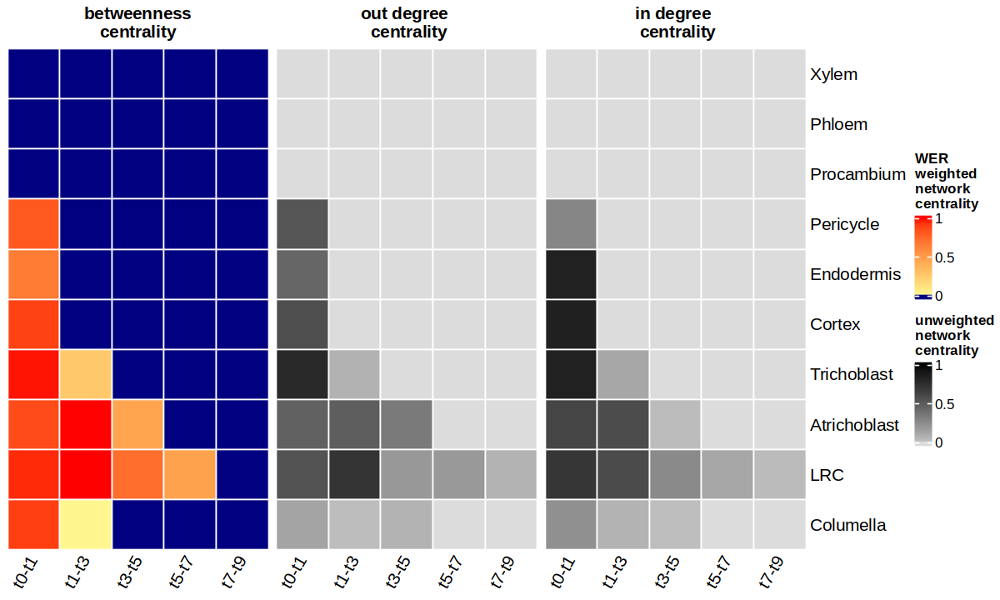

In [126]:
plot_all_centrality("WER")

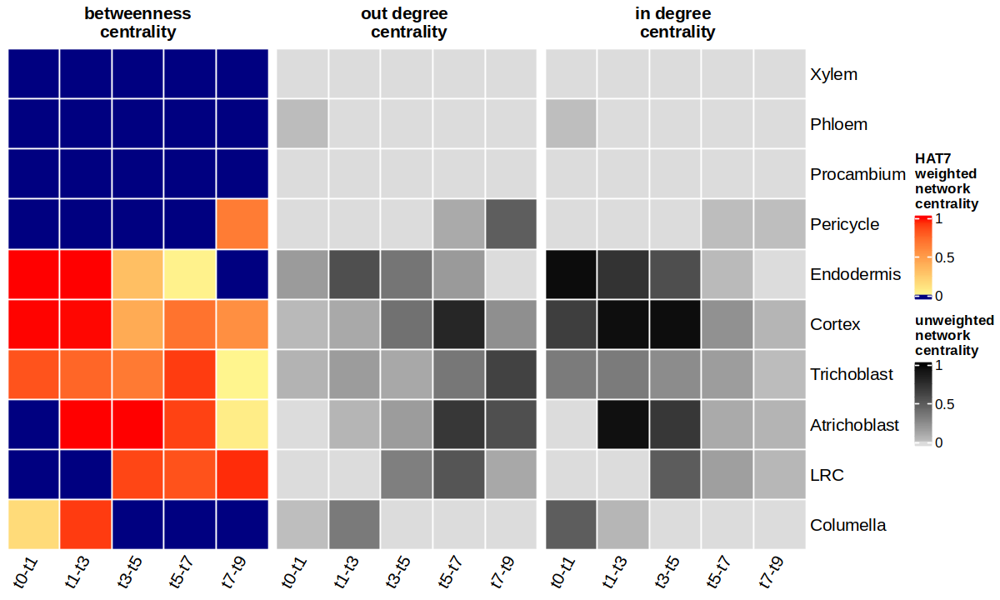

In [127]:
## HAT7
plot_all_centrality("HAT7")

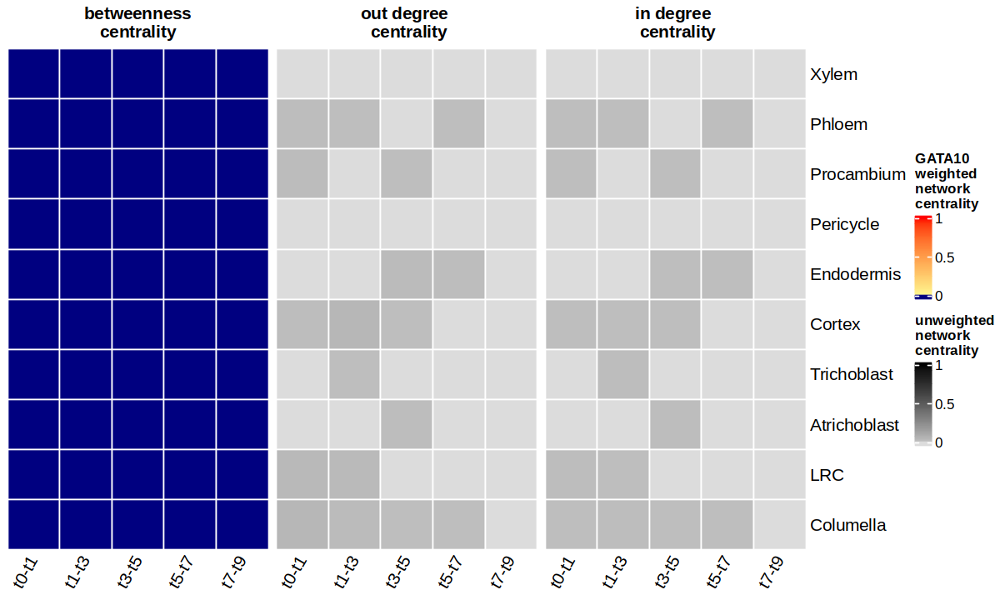

In [128]:
## GATA10
plot_all_centrality("GATA10")

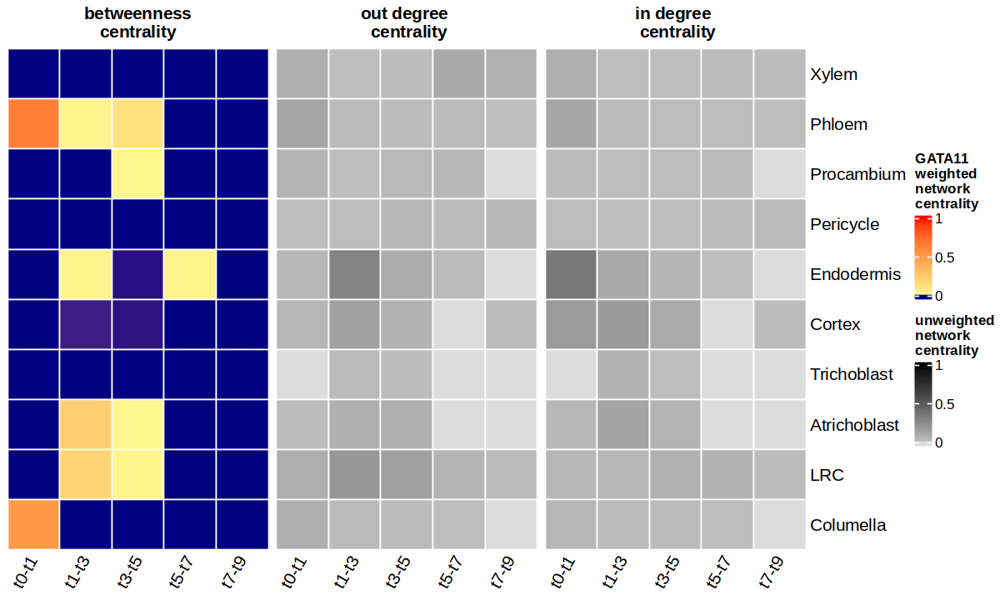

In [129]:
## GATA11
plot_all_centrality("GATA11")

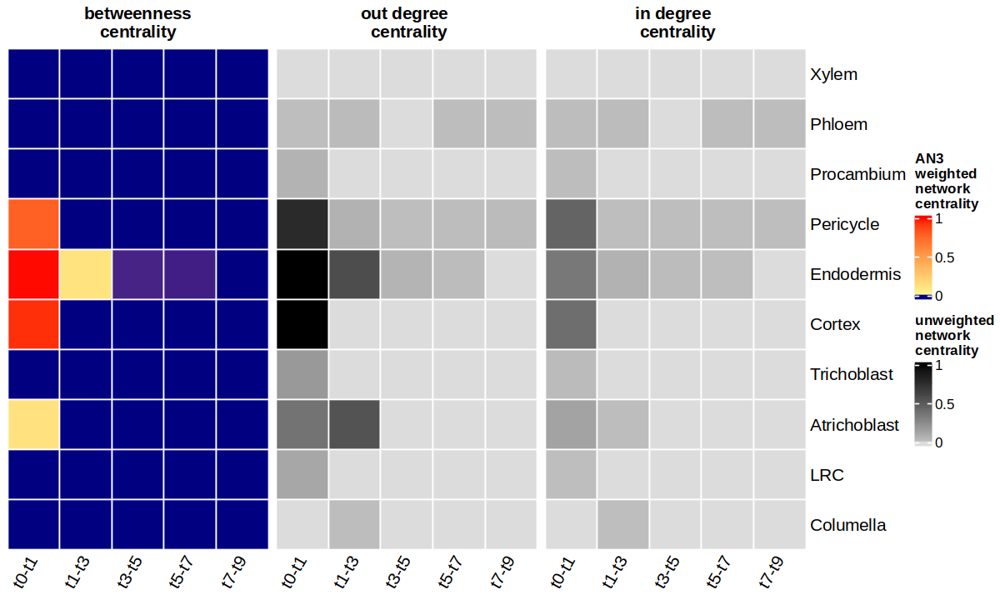

In [130]:
plot_all_centrality("AN3")

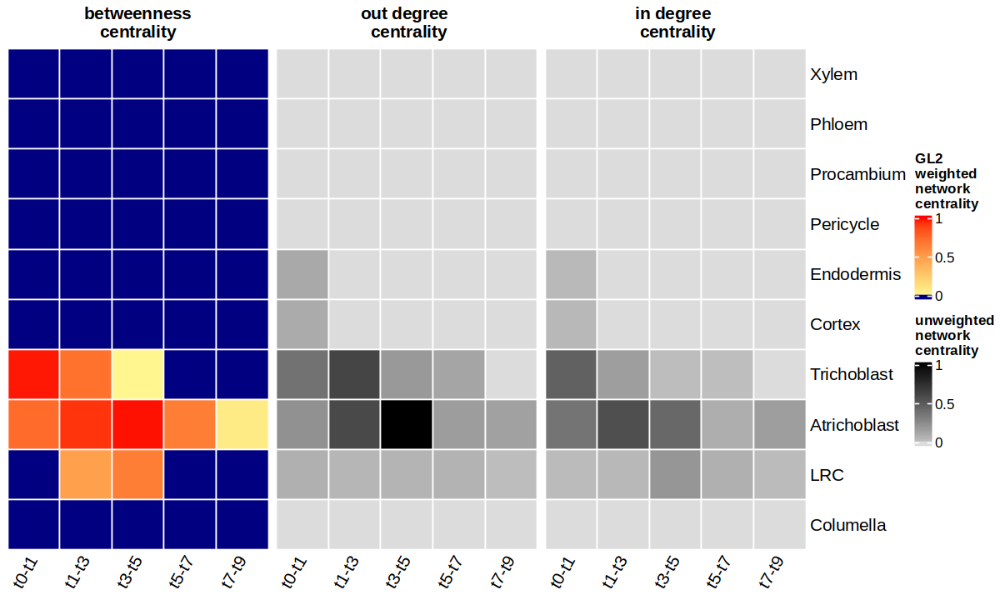

In [131]:
plot_all_centrality("GL2")

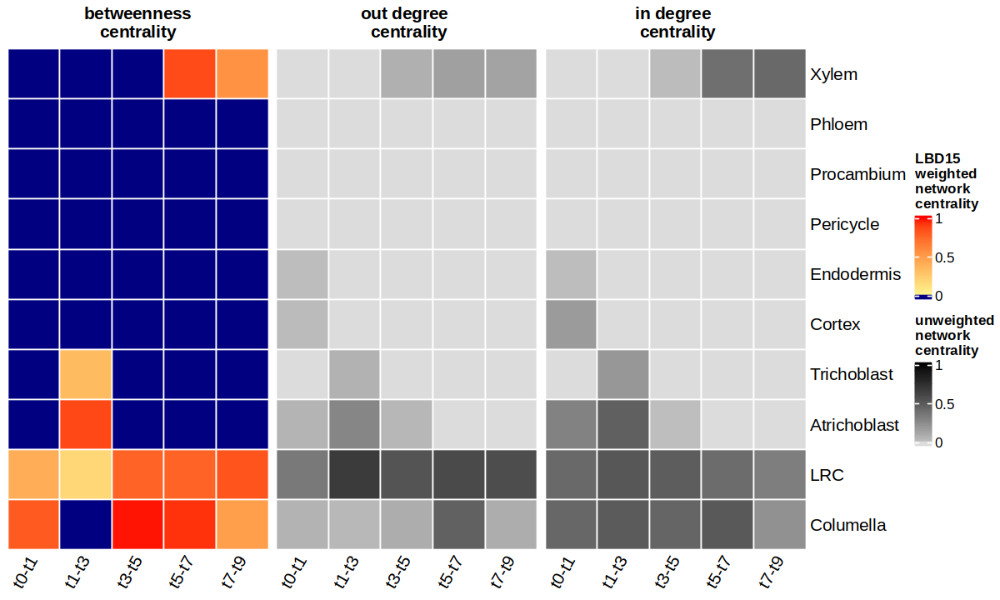

In [132]:
plot_all_centrality("LBD15")

In [133]:
plot_all_centrality <- function(gene){
    options(repr.plot.width=8, repr.plot.height=4)
    plot_heatmap(gene,"betweenness_centrality") + plot_heatmap2(gene,"out_centrality") + plot_heatmap3(gene,"in_centrality")
}

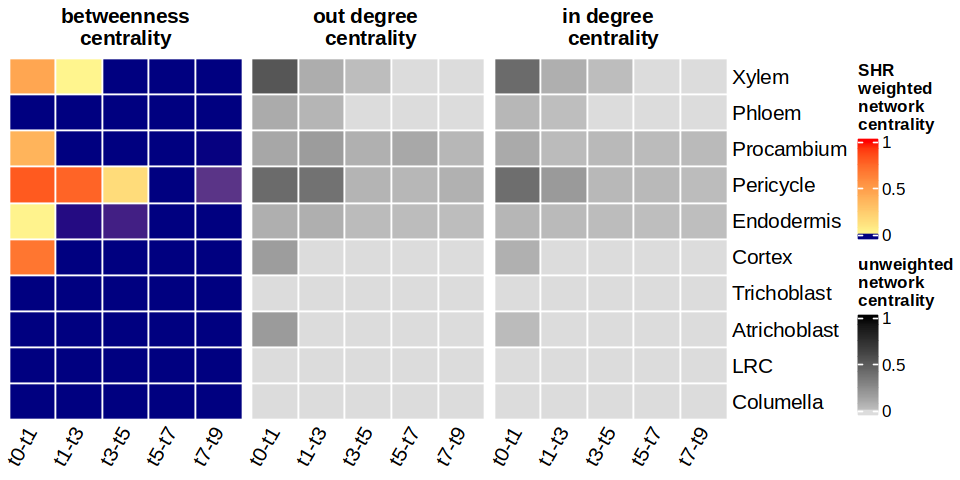

In [134]:
plot_all_centrality("SHR")

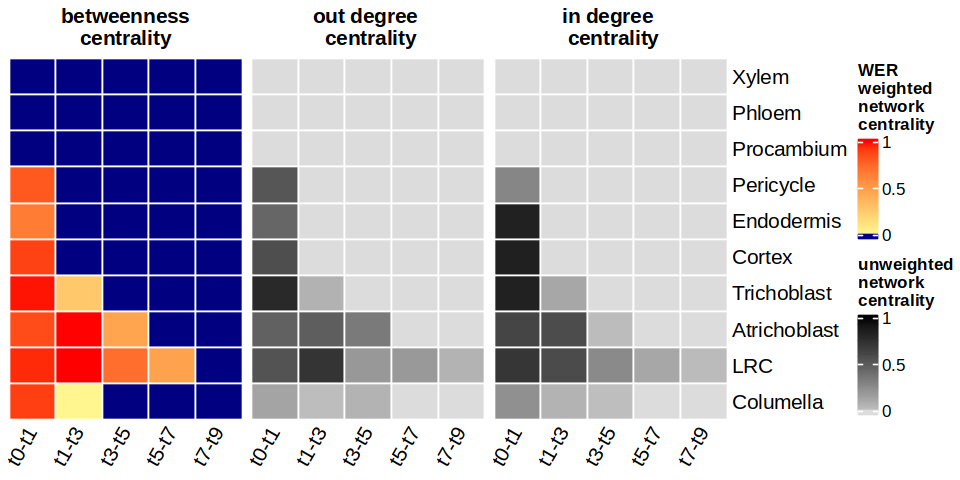

In [135]:
plot_all_centrality("WER")

## Rank by betweenness centrality, out-degree centrality, in-degree centrality and degree centrality

In [136]:
plot_bc <- function(gene){
    sub <- as.numeric(t(dat[which(dat$TF==gene),grep("betweenness_centrality",colnames(dat))]))
    sub <- as.matrix(cbind(sub[1:10],sub[11:20],sub[21:30],sub[31:40],sub[41:50]))
    ## Cell types
    rownames(sub) <- c('Atrichoblast','Trichoblast','LRC','Cortex','Endodermis','Pericycle','Procambium','Xylem','Phloem','Columella')
    ## Transition
    colnames(sub) <- c('t0-t1', 't1-t3', 't3-t5', 't5-t7', 't7-t9')
    # Reorder rows
    sub <- sub[c(8,9,7,6,5,4,2,1,3,10),]
    col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))

    Heatmap(sub, rect_gp = gpar(col = "white", lwd = 1) , show_heatmap_legend = FALSE,
            col = col_fun, column_title = gene, column_title_gp = gpar(fontsize = 12, fontface = "bold"), 
            cluster_rows = FALSE, cluster_columns = FALSE,
            show_column_names = FALSE, bottom_annotation = HeatmapAnnotation(
            text = anno_text(colnames(sub), rot = 60, location = unit(1, "npc"), just = "right"))
       )
}

In [137]:
plot_oc <- function(gene){
    sub <- as.numeric(t(dat[which(dat$TF==gene),grep("out_centrality",colnames(dat))]))
    sub <- as.matrix(cbind(sub[1:10],sub[11:20],sub[21:30],sub[31:40],sub[41:50]))
    ## Cell types
    rownames(sub) <- c('Atrichoblast','Trichoblast','LRC','Cortex','Endodermis','Pericycle','Procambium','Xylem','Phloem','Columella')
    ## Transition
    colnames(sub) <- c('t0-t1', 't1-t3', 't3-t5', 't5-t7', 't7-t9')
    # Reorder rows
    sub <- sub[c(8,9,7,6,5,4,2,1,3,10),]
    col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))

    Heatmap(sub, rect_gp = gpar(col = "white", lwd = 1) , show_heatmap_legend = FALSE,
            col = col_fun, column_title = gene, column_title_gp = gpar(fontsize = 12, fontface = "bold"), 
            cluster_rows = FALSE, cluster_columns = FALSE,
            show_column_names = FALSE, bottom_annotation = HeatmapAnnotation(
            text = anno_text(colnames(sub), rot = 60, location = unit(1, "npc"), just = "right"))
       )
}

In [138]:
plot_ic <- function(gene){
    sub <- as.numeric(t(dat[which(dat$TF==gene),grep("in_centrality",colnames(dat))]))
    sub <- as.matrix(cbind(sub[1:10],sub[11:20],sub[21:30],sub[31:40],sub[41:50]))
    ## Cell types
    rownames(sub) <- c('Atrichoblast','Trichoblast','LRC','Cortex','Endodermis','Pericycle','Procambium','Xylem','Phloem','Columella')
    ## Transition
    colnames(sub) <- c('t0-t1', 't1-t3', 't3-t5', 't5-t7', 't7-t9')
    # Reorder rows
    sub <- sub[c(8,9,7,6,5,4,2,1,3,10),]
    col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))

    Heatmap(sub, rect_gp = gpar(col = "white", lwd = 1) , show_heatmap_legend = FALSE,
            col = col_fun, column_title = gene, column_title_gp = gpar(fontsize = 12, fontface = "bold"), 
            cluster_rows = FALSE, cluster_columns = FALSE,
            show_column_names = FALSE, bottom_annotation = HeatmapAnnotation(
            text = anno_text(colnames(sub), rot = 60, location = unit(1, "npc"), just = "right"))
       )
}

In [139]:
plot_dc <- function(gene){
    sub <- as.numeric(t(dat[which(dat$TF==gene),grep("degree_centrality",colnames(dat))]))
    sub <- as.matrix(cbind(sub[1:10],sub[11:20],sub[21:30],sub[31:40],sub[41:50]))
    ## Cell types
    rownames(sub) <- c('Atrichoblast','Trichoblast','LRC','Cortex','Endodermis','Pericycle','Procambium','Xylem','Phloem','Columella')
    ## Transition
    colnames(sub) <- c('t0-t1', 't1-t3', 't3-t5', 't5-t7', 't7-t9')
    # Reorder rows
    sub <- sub[c(8,9,7,6,5,4,2,1,3,10),]
    col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))

    Heatmap(sub, rect_gp = gpar(col = "white", lwd = 1) , show_heatmap_legend = FALSE,
            col = col_fun, column_title = gene, column_title_gp = gpar(fontsize = 12, fontface = "bold"), 
            cluster_rows = FALSE, cluster_columns = FALSE,
            show_column_names = FALSE, bottom_annotation = HeatmapAnnotation(
            text = anno_text(colnames(sub), rot = 60, location = unit(1, "npc"), just = "right"))
       )
}

In [140]:
plot_blank <- function(gene){
    sub <- as.numeric(t(dat[which(dat$TF==gene),grep("betweenness_centrality",colnames(dat))]))
    sub <- as.matrix(cbind(sub[1:10],sub[11:20],sub[21:30],sub[31:40],sub[41:50]))
    ## Cell types
    rownames(sub) <- c('Atrichoblast','Trichoblast','LRC','Cortex','Endodermis','Pericycle','Procambium','Xylem','Phloem','Columella')
    ## Transition
    colnames(sub) <- c('t0-t1', 't1-t3', 't3-t5', 't5-t7', 't7-t9')
    # Reorder rows
    sub <- sub[c(8,9,7,6,5,4,2,1,3,10),]
    col_fun = colorRamp2(c(0, 0.001, 1), c('white',"white", "white"))

    Heatmap(sub, rect_gp = gpar(col = "white", lwd = 1) , show_heatmap_legend = FALSE,
            col = col_fun, column_title_gp = gpar(fontsize = 12, fontface = "bold"), 
            cluster_rows = FALSE, cluster_columns = FALSE,
            show_column_names = FALSE, show_row_names = TRUE
       )
}

In [141]:
# Combine the top three centralies 
sub <- dat[,grep("betweenness_centrality|in_centrality|out_centrality",colnames(dat))]
sub <- as.data.frame(sapply(sub, as.numeric))
rownames(sub) <- dat$TF

In [142]:
head(sub)

,atri_out_centrality_1,atri_in_centrality_1,atri_betweenness_centrality_1,tri_out_centrality_1,tri_in_centrality_1,tri_betweenness_centrality_1,lrc_out_centrality_1,lrc_in_centrality_1,lrc_betweenness_centrality_1,cor_out_centrality_1,...,pro_betweenness_centrality_5,xyl_out_centrality_5,xyl_in_centrality_5,xyl_betweenness_centrality_5,phl_out_centrality_5,phl_in_centrality_5,phl_betweenness_centrality_5,col_out_centrality_5,col_in_centrality_5,col_betweenness_centrality_5
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,...,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
BZIP9,0.0000000,0.0000000,0.000000,0.00000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.000000000,...,0.9210677,0,0,0,0.8440367,0.8463303,0.2032263,0.00000000,0.000000000,0
AT3G43430,0.0000000,0.0000000,0.000000,0.00000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.002673797,...,0.5052969,0,0,0,0.2350917,0.1089450,0.1105647,0.00000000,0.000000000,0
PLT1,0.2160494,0.5653710,0.963923,0.00000000,0.0000000,0.0000000,0.1568627,1.0000000,0.9868855,0.385026738,...,0.0000000,0,0,0,0.0000000,0.0000000,0.0000000,0.09975669,0.002207506,0
HAT7,0.0000000,0.0000000,0.000000,0.05179283,0.3275862,0.8317337,0.0000000,0.0000000,0.0000000,0.024064171,...,0.0000000,0,0,0,0.0000000,0.0000000,0.0000000,0.00000000,0.000000000,0
MYB36,0.0000000,0.0000000,0.000000,0.00000000,0.0000000,0.0000000,0.0000000,0.0000000,0.0000000,0.114973262,...,0.0000000,0,0,0,0.0000000,0.0000000,0.0000000,0.00000000,0.000000000,0
GATA2,0.7932099,0.5759717,0.804800,0.66533865,0.5905172,0.8920287,0.8591800,0.9802513,1.0000000,0.553475936,...,0.0000000,0,0,0,0.0000000,0.0000000,0.0000000,0.00000000,0.000000000,0


In [143]:
bc_rank <- data.frame(all=rowSums(sub),atri=rowSums(sub[,grep("^atri_",colnames(sub))]),tri=rowSums(sub[,grep("^tri_",colnames(sub))])
                     ,cor=rowSums(sub[,grep("^cor_",colnames(sub))]),end=rowSums(sub[,grep("^end_",colnames(sub))])
                     ,per=rowSums(sub[,grep("^per_",colnames(sub))]),pro=rowSums(sub[,grep("^pro_",colnames(sub))])
                     ,xyl=rowSums(sub[,grep("^xyl_",colnames(sub))]),phl=rowSums(sub[,grep("^phl_",colnames(sub))])
                     ,lrc=rowSums(sub[,grep("^lrc_",colnames(sub))]),col=rowSums(sub[,grep("^col_",colnames(sub))]))

In [144]:
bc_rank$GeneID <- wanted_TFs$GeneID[match(rownames(bc_rank),wanted_TFs$Name)]

In [145]:
head(bc_rank)

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
BZIP9,31.42213,0.000000,0.000000,0.00000000,0.005736138,8.55316613,11.88088107,0.02003315,10.9623184,0.000000,0.000000,AT5G24800
AT3G43430,29.05965,0.000000,0.000000,0.00544388,0.029360833,9.20656526,11.24626128,1.83863137,6.7333880,0.000000,0.000000,AT3G43430
PLT1,23.97514,3.940608,0.000000,2.00953127,1.492057686,0.05699842,0.00000000,0.00000000,0.0000000,9.148008,7.327940,AT3G20840
HAT7,33.13977,6.200914,5.547329,8.04274907,5.877125010,1.24427942,0.00000000,0.00000000,0.0122843,4.284922,1.930171,AT5G15150
MYB36,20.57418,0.000000,0.000000,6.29093689,10.748544272,3.53469871,0.00000000,0.00000000,0.0000000,0.000000,0.000000,AT5G57620
GATA2,33.12273,6.623792,6.596557,2.46621779,2.051664424,0.80375905,0.03881894,0.09406244,0.1559529,12.103509,2.188393,AT2G45050


## Atrichoblast

In [146]:
atri_rank <- bc_rank[which(bc_rank$atri*2 > bc_rank$all),]%>% arrange(desc(atri))
atri_rank$GeneName <- rownames(atri_rank)

In [147]:
atri_rank

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID,GeneName
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
MYB23,16.31793255,8.20713964,3.311916916,1.435215442,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,3.216075778,0.147584780,AT5G40330,MYB23
GL2,12.59879540,7.07284877,3.606946457,0.121283719,0.126559384,0.000000000,0.000000000,0.000000000,0.000000000,1.671157066,0.000000000,AT1G79840,GL2
TTG2,9.80635891,6.93096555,2.295746399,0.043262180,0.031031246,0.000000000,0.000000000,0.000000000,0.000000000,0.505353540,0.000000000,AT2G37260,TTG2
MYB45,7.74054316,5.00001186,1.548317405,1.105903099,0.032240503,0.000000000,0.000000000,0.000000000,0.000000000,0.054070289,0.000000000,AT3G48920,MYB45
IAA14,8.69681235,4.86976717,2.350063082,0.057152540,0.000000000,0.167830167,0.486865950,0.168121035,0.006276239,0.549981601,0.040754561,AT4G14550,IAA14
WRKY45,5.28282187,4.52127277,0.662200395,0.028887457,0.005736138,0.004460176,0.000000000,0.000000000,0.000000000,0.045499150,0.014765782,AT3G01970,WRKY45
ARR6,6.83180069,3.82931392,1.604692837,0.145406277,0.091157087,0.142688889,0.192916368,0.206112299,0.068509068,0.263100941,0.287903003,AT5G62920,ARR6
CRF4,6.17032329,3.58350854,1.213204139,0.590897376,0.216926392,0.051316603,0.000000000,0.000000000,0.000000000,0.475292500,0.039177743,AT4G27950,CRF4
AT2G28710,3.60999396,3.21999351,0.304157050,0.000000000,0.007648184,0.000000000,0.000000000,0.000000000,0.000000000,0.078195215,0.000000000,AT2G28710,AT2G28710


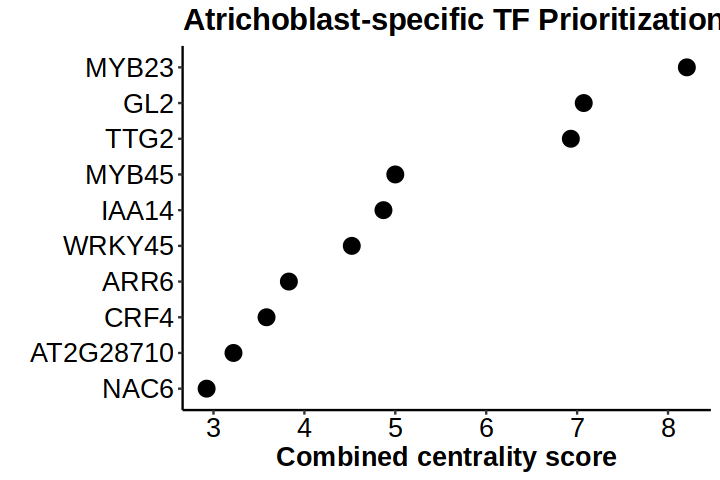

In [148]:
options(repr.plot.width=6, repr.plot.height=4)
ggplot(atri_rank[1:10,], aes(x=reorder(GeneName, atri, decreasing = FALSE),  y=atri)) + geom_point(size=4)+ 
  labs(title="Atrichoblast-specific TF Prioritization",x="", y = "Combined centrality score")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

In [149]:
write.csv(atri_rank,"Atrichoblast_TF_centrality_all_transition_zscore3.csv", quote=FALSE, row.names=TRUE)

In [150]:
tf_rank <- atri_rank %>% rownames(.)

In [151]:
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_bc(tf_rank[15])
p4 <- plot_bc(tf_rank[16]) + plot_bc(tf_rank[17]) + plot_bc(tf_rank[18]) + plot_bc(tf_rank[19]) + plot_bc(tf_rank[20])

p5 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p6 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
p7 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_oc(tf_rank[15])
p8 <- plot_oc(tf_rank[16]) + plot_oc(tf_rank[17]) + plot_oc(tf_rank[18]) + plot_oc(tf_rank[19]) + plot_oc(tf_rank[20])

p9 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p10 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
p11 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_ic(tf_rank[15])
p12 <- plot_ic(tf_rank[16]) + plot_ic(tf_rank[17]) + plot_ic(tf_rank[18]) + plot_ic(tf_rank[19]) + plot_ic(tf_rank[20])

In [152]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
p3 <- grid.grabExpr(draw(p3))
p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
p7 <- grid.grabExpr(draw(p7))
p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
p10 <- grid.grabExpr(draw(p10))
p11 <- grid.grabExpr(draw(p11))
p12 <- grid.grabExpr(draw(p12))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

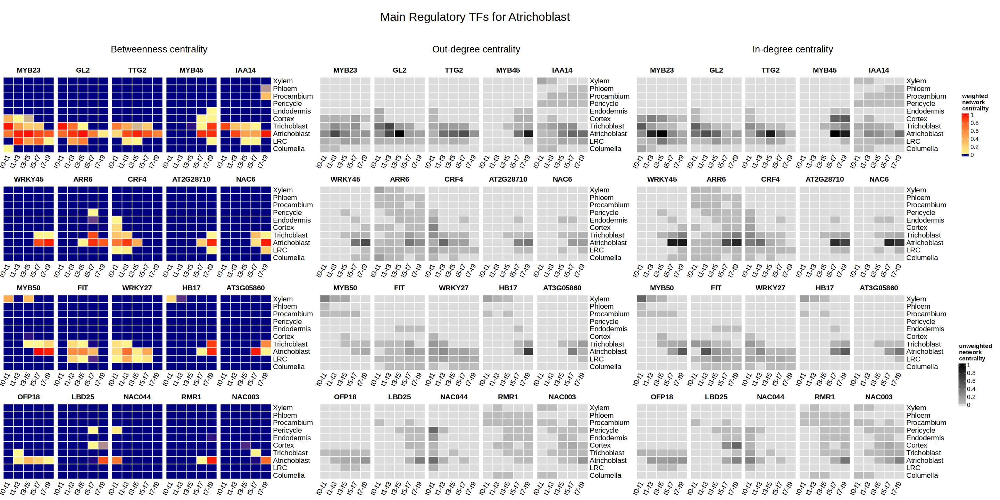

In [153]:
options(repr.plot.width=24, repr.plot.height=12)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Atrichoblast ", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,p3,p4,nrow=4),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p5,p6,p7,p8,nrow=4),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p9,p10,p11,p12,nrow=4),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))

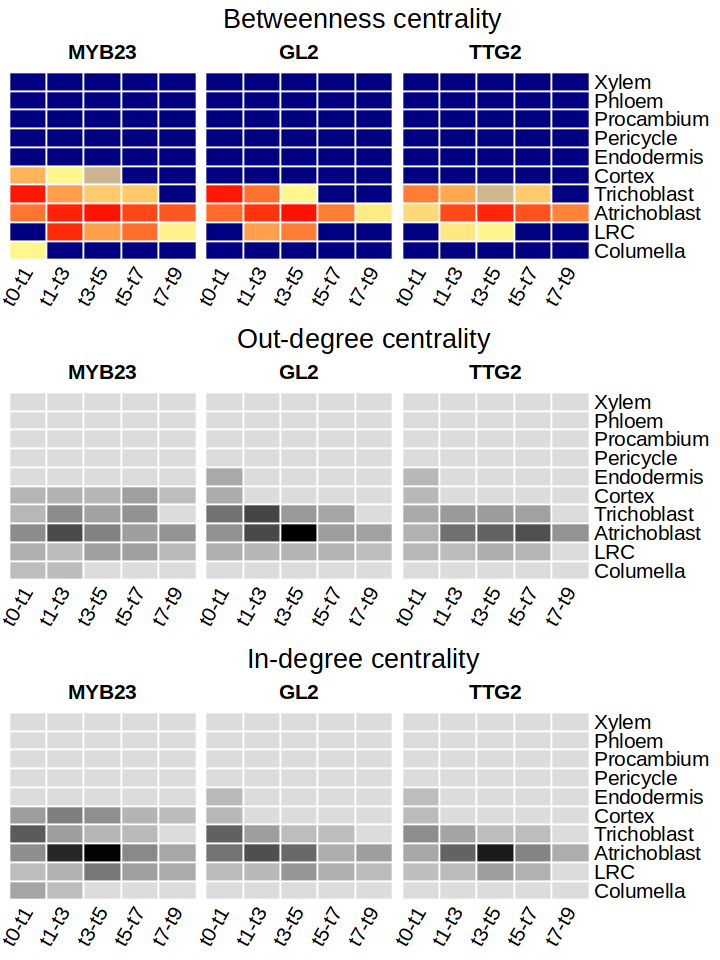

In [154]:
q1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3])
q2 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3])
q3 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3])

q1 <- grid.grabExpr(draw(q1))
q2 <- grid.grabExpr(draw(q2))
q3 <- grid.grabExpr(draw(q3))

options(repr.plot.width=6, repr.plot.height=8)
plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),q1,nrow=2,rel_heights = c(1, 8))
          ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),q2,nrow=2,rel_heights = c(1, 8))
          ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),q3,nrow=2,rel_heights = c(1, 8)),nrow=3)

## Trichoblast

In [155]:
tri_rank <- bc_rank[which(bc_rank$tri*2 > bc_rank$all),]%>% arrange(desc(tri))
tri_rank$GeneName <- rownames(tri_rank)

In [156]:
tri_rank

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID,GeneName
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
AT3G53370,10.703067482,1.809742147,8.309677470,0.000000000,0.000000000,0.162668647,0.05408138,0.325731713,0.041166121,0.000000000,0.000000000,AT3G53370,AT3G53370
LRL3,11.471484177,3.379461231,8.092022945,0.000000000,0.000000000,0.000000000,0.00000000,0.000000000,0.000000000,0.000000000,0.000000000,AT5G58010,LRL3
RHD6,10.231879434,3.043919316,7.187960117,0.000000000,0.000000000,0.000000000,0.00000000,0.000000000,0.000000000,0.000000000,0.000000000,AT1G66470,RHD6
AT4G09100,5.319501634,0.236489354,5.083012279,0.000000000,0.000000000,0.000000000,0.00000000,0.000000000,0.000000000,0.000000000,0.000000000,AT4G09100,AT4G09100
RSL4,5.167261070,0.110264729,5.056996342,0.000000000,0.000000000,0.000000000,0.00000000,0.000000000,0.000000000,0.000000000,0.000000000,AT1G27740,RSL4
RSL2,4.524441211,0.051378954,4.473062258,0.000000000,0.000000000,0.000000000,0.00000000,0.000000000,0.000000000,0.000000000,0.000000000,AT4G33880,RSL2
RAP2.11,3.210204477,0.000000000,3.197663118,0.000000000,0.000000000,0.000000000,0.00000000,0.012541359,0.000000000,0.000000000,0.000000000,AT5G19790,RAP2.11
AT4G39160,3.554318032,0.223674563,3.189048364,0.000000000,0.012428298,0.004384828,0.02017415,0.000000000,0.047321292,0.009035242,0.048251301,AT4G39160,AT4G39160
AT5G56200,3.181772719,0.000000000,3.181772719,0.000000000,0.000000000,0.000000000,0.00000000,0.000000000,0.000000000,0.000000000,0.000000000,AT5G56200,AT5G56200


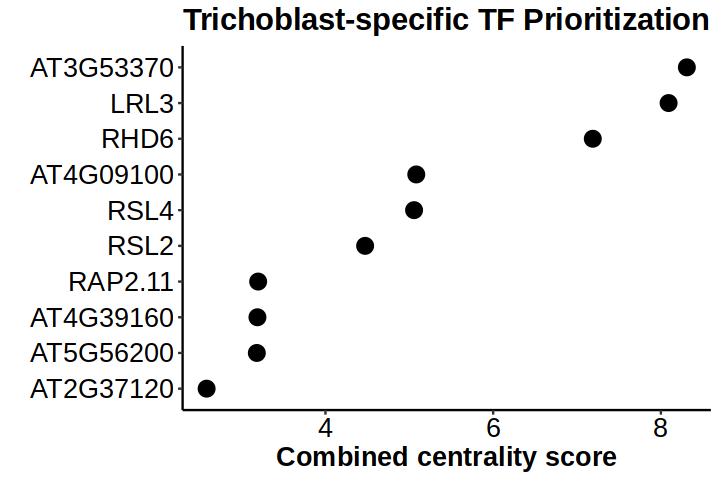

In [157]:
options(repr.plot.width=6, repr.plot.height=4)
ggplot(tri_rank[1:10,], aes(x=reorder(GeneName, tri, decreasing = FALSE),  y=tri)) + geom_point(size=4)+ 
  labs(title="Trichoblast-specific TF Prioritization",x="", y = "Combined centrality score")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

In [158]:
write.csv(tri_rank,"Trichoblast_TF_centrality_all_transition_zscore3.csv", quote=FALSE, row.names=TRUE)

In [159]:
## Top20 only
tf_rank <- tri_rank %>% rownames(.)
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_bc(tf_rank[15])
p4 <- plot_bc(tf_rank[16]) + plot_bc(tf_rank[17]) + plot_bc(tf_rank[18]) + plot_bc(tf_rank[19]) + plot_bc(tf_rank[20])

p5 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p6 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
p7 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_oc(tf_rank[15])
p8 <- plot_oc(tf_rank[16]) + plot_oc(tf_rank[17]) + plot_oc(tf_rank[18]) + plot_oc(tf_rank[19]) + plot_oc(tf_rank[20])

p9 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p10 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
p11 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_ic(tf_rank[15])
p12 <- plot_ic(tf_rank[16]) + plot_ic(tf_rank[17]) + plot_ic(tf_rank[18]) + plot_ic(tf_rank[19]) + plot_ic(tf_rank[20])

In [160]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
p3 <- grid.grabExpr(draw(p3))
p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
p7 <- grid.grabExpr(draw(p7))
p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
p10 <- grid.grabExpr(draw(p10))
p11 <- grid.grabExpr(draw(p11))
p12 <- grid.grabExpr(draw(p12))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

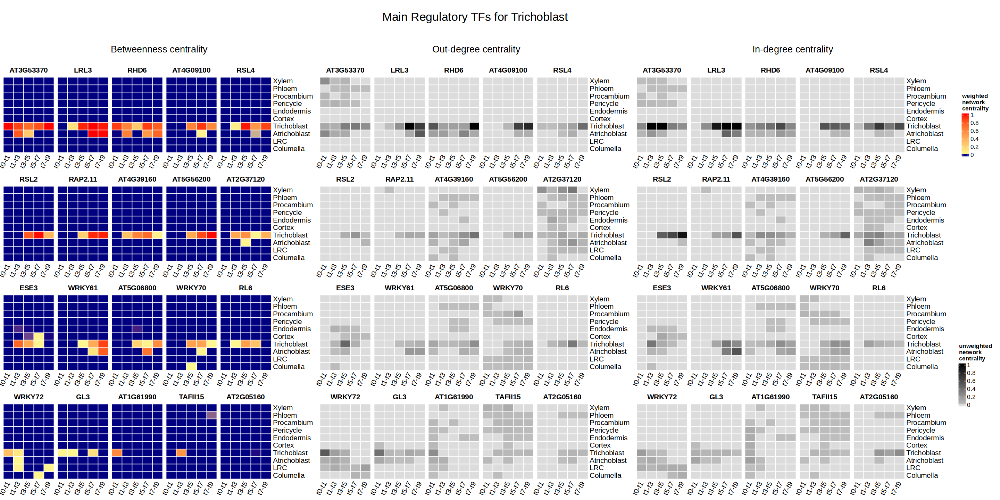

In [161]:
options(repr.plot.width=24, repr.plot.height=12)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Trichoblast ", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,p3,p4,nrow=4),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p5,p6,p7,p8,nrow=4),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p9,p10,p11,p12,nrow=4),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))

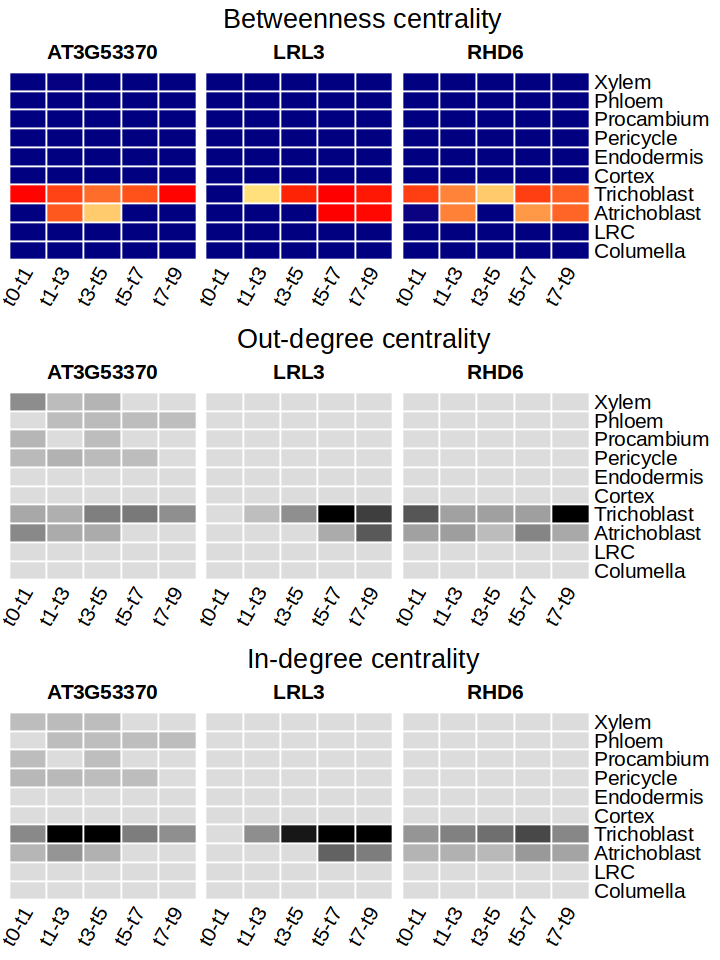

In [162]:
q1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3])
q2 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3])
q3 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3])

q1 <- grid.grabExpr(draw(q1))
q2 <- grid.grabExpr(draw(q2))
q3 <- grid.grabExpr(draw(q3))

options(repr.plot.width=6, repr.plot.height=8)
plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),q1,nrow=2,rel_heights = c(1, 8))
          ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),q2,nrow=2,rel_heights = c(1, 8))
          ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),q3,nrow=2,rel_heights = c(1, 8)),nrow=3)

## Cortex

In [163]:
cor_rank <- bc_rank[which(bc_rank$cor*2 > bc_rank$all),]%>% arrange(desc(cor))
cor_rank$GeneName <- rownames(cor_rank)

In [164]:
cor_rank

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID,GeneName
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
AT1G05710,7.83989003,0.07228446,0.000000000,5.77386624,1.973841857,0.01444529,0.005452182,0.0000000,0.000000000,0.000000000,0.000000000,AT1G05710,AT1G05710
AT1G62975,6.72777431,1.13322162,0.146830936,3.40415652,1.322609983,0.27190233,0.136499115,0.1189206,0.193633211,0.000000000,0.000000000,AT1G62975,AT1G62975
AT1G72210,4.37996569,0.00000000,0.000000000,3.26158461,0.916443668,0.00000000,0.000000000,0.0000000,0.000000000,0.000000000,0.201937410,AT1G72210,AT1G72210
AT2G38300,3.02146138,0.00000000,0.000000000,2.35652364,0.308759503,0.00000000,0.000000000,0.0000000,0.000000000,0.000000000,0.356178233,AT2G38300,AT2G38300
LAF1,2.65672644,0.07291432,0.000000000,2.16594894,0.417863168,0.00000000,0.000000000,0.0000000,0.000000000,0.000000000,0.000000000,AT4G25560,LAF1
MYB86,3.66808131,1.58670619,0.035736296,1.89230824,0.006692161,0.00000000,0.000000000,0.1034472,0.004497468,0.028711865,0.009981880,AT5G26660,MYB86
JAZ6,2.58639791,0.32191094,0.079950398,1.76647996,0.194759488,0.10574310,0.065125186,0.0000000,0.019982403,0.008591619,0.023854811,AT1G72450,JAZ6
AT2G42660,1.45982831,0.05077908,0.000000000,1.29597136,0.000000000,0.00000000,0.000000000,0.0000000,0.000000000,0.000000000,0.113077867,AT2G42660,AT2G42660
IDD4,1.73576688,0.00000000,0.000000000,1.28051964,0.455247239,0.00000000,0.000000000,0.0000000,0.000000000,0.000000000,0.000000000,AT2G02080,IDD4


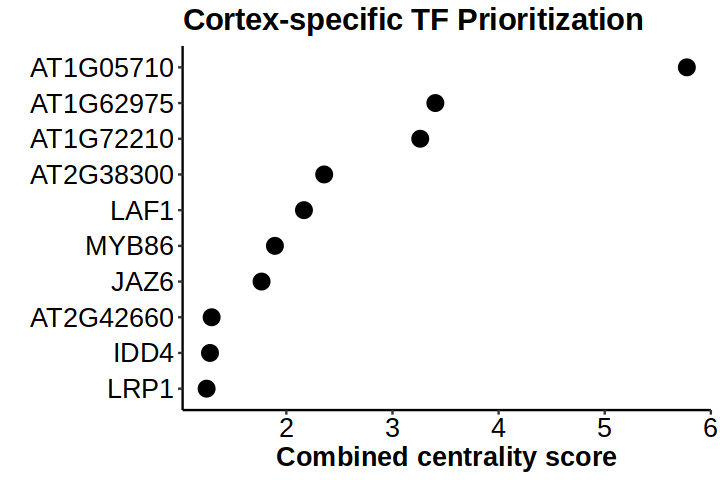

In [165]:
options(repr.plot.width=6, repr.plot.height=4)
ggplot(cor_rank[1:10,], aes(x=reorder(GeneName, cor, decreasing = FALSE),  y=cor)) + geom_point(size=4)+ 
  labs(title="Cortex-specific TF Prioritization",x="", y = "Combined centrality score")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

In [166]:
write.csv(cor_rank,"Cortex_TF_centrality_all_transition_zscore3.csv", quote=FALSE, row.names=TRUE)

In [167]:
tf_rank <- cor_rank %>% rownames(.)
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_bc(tf_rank[15])
#p4 <- plot_bc(tf_rank[16]) + plot_blank("Empty")+ plot_blank("Empty") + plot_blank("Empty")+ plot_blank("Empty")

p5 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p6 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
p7 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_oc(tf_rank[15])
#p8 <- plot_oc(tf_rank[16]) + plot_blank("Empty")+ plot_blank("Empty") + plot_blank("Empty")+ plot_blank("Empty")

p9 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p10 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
p11 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_ic(tf_rank[15])
#p12 <- plot_ic(tf_rank[16]) + plot_blank("Empty")+ plot_blank("Empty") + plot_blank("Empty")+ plot_blank("Empty")

In [168]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
p3 <- grid.grabExpr(draw(p3))
#p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
p7 <- grid.grabExpr(draw(p7))
#p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
p10 <- grid.grabExpr(draw(p10))
p11 <- grid.grabExpr(draw(p11))
#p12 <- grid.grabExpr(draw(p12))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

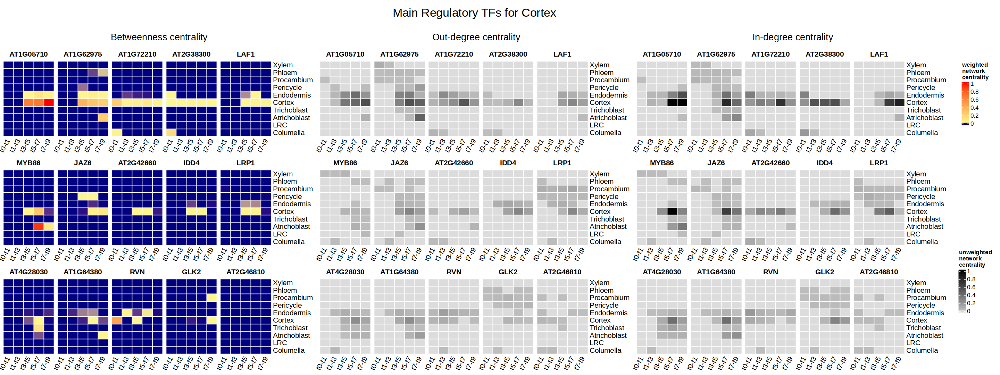

In [169]:
options(repr.plot.width=24, repr.plot.height=9)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Cortex ", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,p3,nrow=3),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p5,p6,p7,nrow=3),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p9,p10,p11,nrow=3),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))

In [170]:
## Top 10 only
tf_rank <- cor_rank %>% rownames(.)
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
#p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_bc(tf_rank[15])
#p4 <- plot_bc(tf_rank[16]) + plot_blank("Empty")+ plot_blank("Empty") + plot_blank("Empty")+ plot_blank("Empty")

p5 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p6 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
#p7 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_oc(tf_rank[15])
#p8 <- plot_oc(tf_rank[16]) + plot_blank("Empty")+ plot_blank("Empty") + plot_blank("Empty")+ plot_blank("Empty")

p9 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p10 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
#p11 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_ic(tf_rank[15])
#p12 <- plot_ic(tf_rank[16]) + plot_blank("Empty")+ plot_blank("Empty") + plot_blank("Empty")+ plot_blank("Empty")

In [171]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
#p3 <- grid.grabExpr(draw(p3))
#p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
#p7 <- grid.grabExpr(draw(p7))
#p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
p10 <- grid.grabExpr(draw(p10))
#p11 <- grid.grabExpr(draw(p11))
#p12 <- grid.grabExpr(draw(p12))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

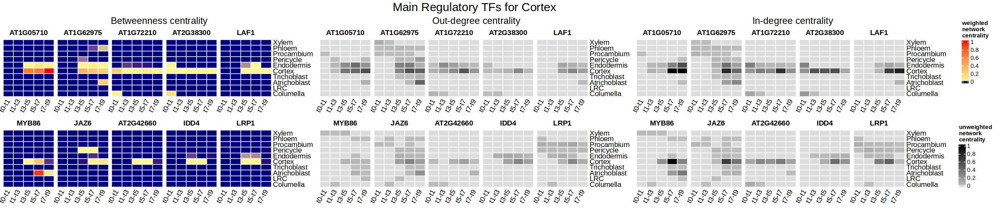

In [172]:
options(repr.plot.width=24, repr.plot.height=5)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Cortex ", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,nrow=2),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p5,p6,nrow=2),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p9,p10,nrow=2),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))

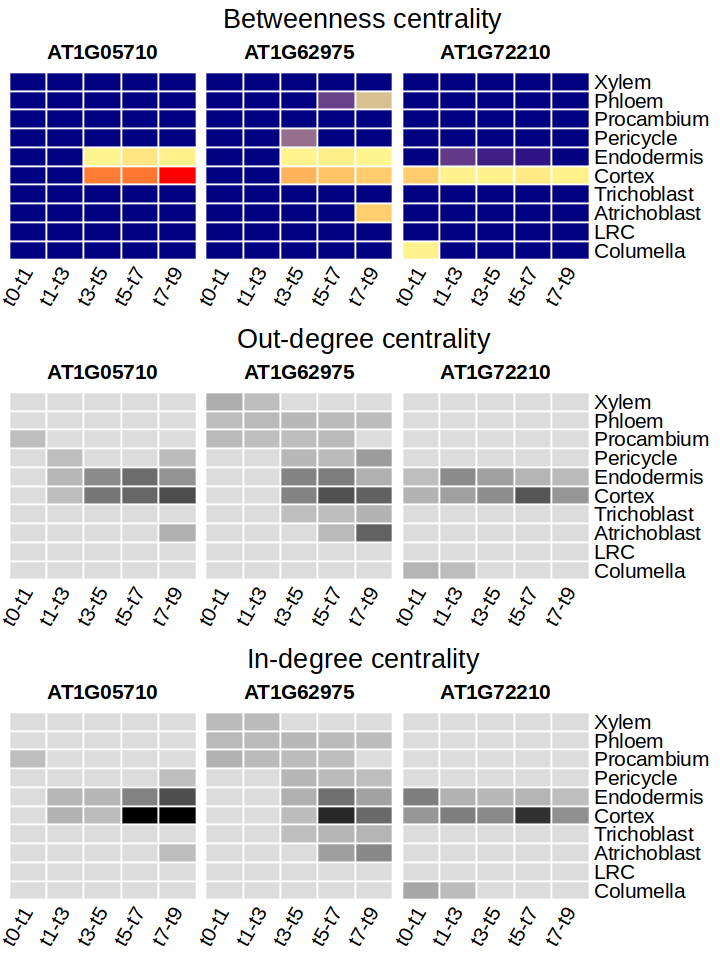

In [173]:
q1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3])
q2 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3])
q3 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3])

q1 <- grid.grabExpr(draw(q1))
q2 <- grid.grabExpr(draw(q2))
q3 <- grid.grabExpr(draw(q3))

options(repr.plot.width=6, repr.plot.height=8)
plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),q1,nrow=2,rel_heights = c(1, 8))
          ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),q2,nrow=2,rel_heights = c(1, 8))
          ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),q3,nrow=2,rel_heights = c(1, 8)),nrow=3)

## Endodermis

In [174]:
end_rank <- bc_rank[which(bc_rank$end*2 > bc_rank$all),]%>% arrange(desc(end))
end_rank$GeneName <- rownames(end_rank)

In [175]:
end_rank

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID,GeneName
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
MYB36,20.574179871,0.000000000,0.000000000,6.290936886,10.748544272,3.534698713,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,AT5G57620,MYB36
MYB74,12.716442815,0.000000000,0.000000000,4.532213333,7.685381936,0.236172960,0.012475395,0.182513773,0.000000000,0.014864734,0.052820684,AT4G05100,MYB74
MYB68,9.699006069,0.000000000,0.000000000,2.501400511,6.179638016,1.017967543,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,AT5G65790,MYB68
SOM,7.741216041,0.050269055,0.000000000,2.027707378,4.021560442,1.244198607,0.345040865,0.000000000,0.052439694,0.000000000,0.000000000,AT1G03790,SOM
BLJ,4.557129505,0.000000000,0.000000000,0.643910731,3.719412679,0.193806095,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,AT1G14580,BLJ
RAX2,5.318435677,0.147471024,0.049460104,1.185754593,3.465686223,0.450624550,0.019439183,0.000000000,0.000000000,0.000000000,0.000000000,AT2G36890,RAX2
SCR,4.753144752,0.000000000,0.000000000,1.662358141,3.003742831,0.087043779,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,AT3G54220,SCR
TLP11,4.155878032,0.006012685,0.370838723,0.278142330,2.179886146,0.627860320,0.505965671,0.000000000,0.187172158,0.000000000,0.000000000,AT5G18680,TLP11
SCL3,3.322564901,0.000000000,0.000000000,0.687705471,1.761112367,0.234680845,0.112334395,0.000000000,0.000000000,0.128682075,0.398049747,AT1G50420,SCL3


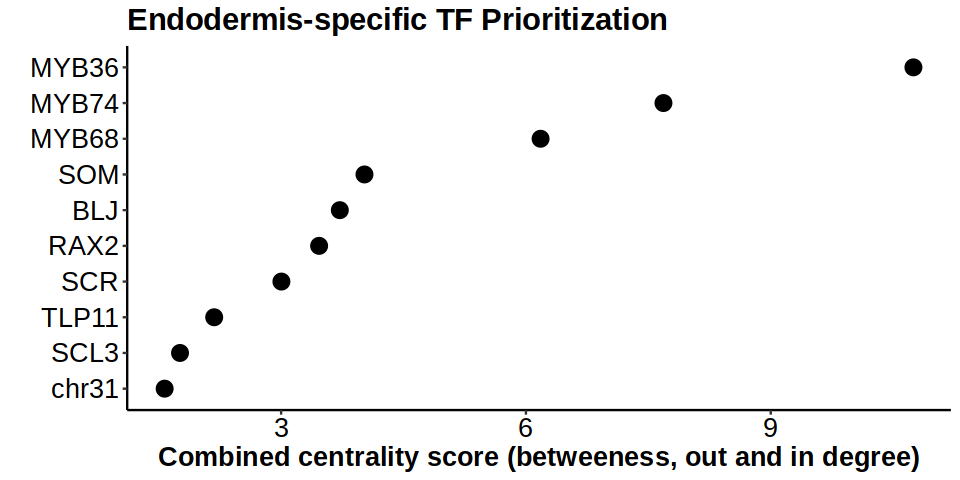

In [176]:
options(repr.plot.width=8, repr.plot.height=4)
ggplot(end_rank[1:10,], aes(x=reorder(GeneName, end, decreasing = FALSE),  y=end)) + geom_point(size=4)+ 
  labs(title="Endodermis-specific TF Prioritization",x="", y = "Combined centrality score (betweeness, out and in degree)")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

In [177]:
write.csv(end_rank,"Endodermis_TF_centrality_all_transition_zscore3.csv", quote=FALSE, row.names=TRUE)

In [178]:
tf_rank <- end_rank %>% rownames(.)
# Max 20
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_bc(tf_rank[15])
p4 <- plot_bc(tf_rank[16]) + plot_bc(tf_rank[17]) + plot_bc(tf_rank[18]) + plot_bc(tf_rank[19]) + plot_bc(tf_rank[20])

p5 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p6 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
p7 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_oc(tf_rank[15])
p8 <- plot_oc(tf_rank[16]) + plot_oc(tf_rank[17]) + plot_oc(tf_rank[18]) + plot_oc(tf_rank[19]) + plot_oc(tf_rank[20])

p9 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p10 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
p11 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_ic(tf_rank[15])
p12 <- plot_ic(tf_rank[16]) + plot_ic(tf_rank[17]) + plot_ic(tf_rank[18]) + plot_ic(tf_rank[19]) + plot_ic(tf_rank[20])

In [179]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
p3 <- grid.grabExpr(draw(p3))
p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
p7 <- grid.grabExpr(draw(p7))
p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
p10 <- grid.grabExpr(draw(p10))
p11 <- grid.grabExpr(draw(p11))
p12 <- grid.grabExpr(draw(p12))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

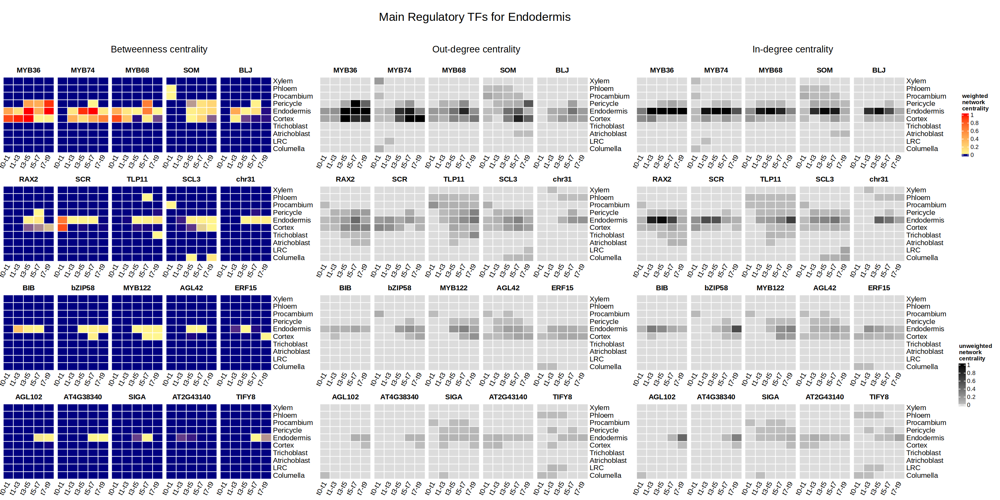

In [180]:
options(repr.plot.width=24, repr.plot.height=12)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Endodermis ", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,p3,p4,nrow=4),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p5,p6,p7,p8,nrow=4),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p9,p10,p11,p12,nrow=4),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))

In [181]:
tf_rank <- end_rank %>% rownames(.)
# Max 10
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
#p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_bc(tf_rank[15])
#p4 <- plot_bc(tf_rank[16]) + plot_bc(tf_rank[17]) + plot_bc(tf_rank[18]) + plot_bc(tf_rank[19]) + plot_bc(tf_rank[20])

p5 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p6 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
#p7 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_oc(tf_rank[15])
#p8 <- plot_oc(tf_rank[16]) + plot_oc(tf_rank[17]) + plot_oc(tf_rank[18]) + plot_oc(tf_rank[19]) + plot_oc(tf_rank[20])

p9 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p10 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
#p11 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_ic(tf_rank[15])
#p12 <- plot_ic(tf_rank[16]) + plot_ic(tf_rank[17]) + plot_ic(tf_rank[18]) + plot_ic(tf_rank[19]) + plot_ic(tf_rank[20])

In [182]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
#p3 <- grid.grabExpr(draw(p3))
#p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
#p7 <- grid.grabExpr(draw(p7))
#p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
p10 <- grid.grabExpr(draw(p10))
#p11 <- grid.grabExpr(draw(p11))
#p12 <- grid.grabExpr(draw(p12))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

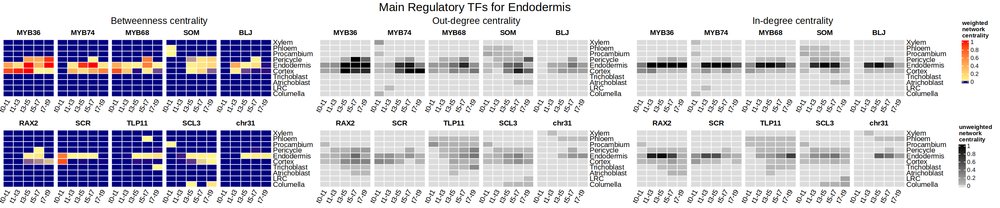

In [183]:
options(repr.plot.width=24, repr.plot.height=5)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Endodermis ", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,nrow=2),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p5,p6,nrow=2),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p9,p10,nrow=2),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))

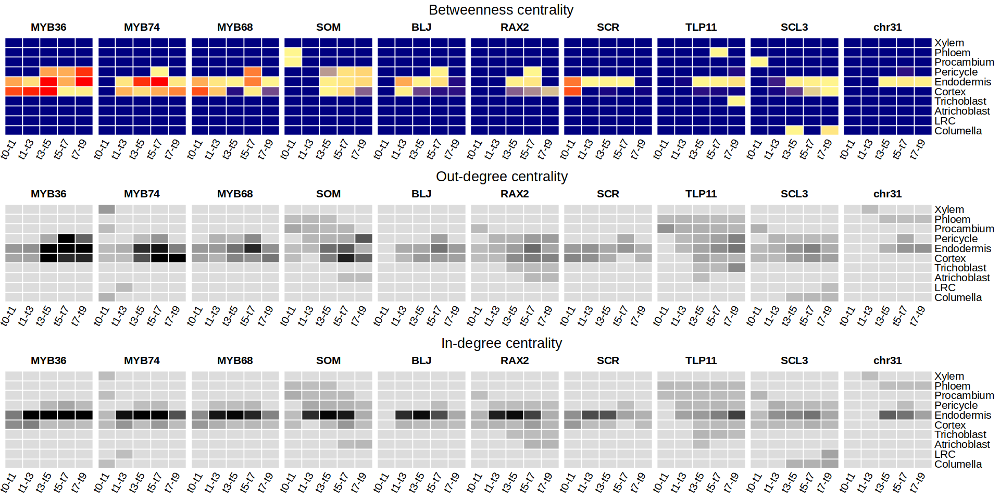

In [184]:
q1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5]) + plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10]) 
q2 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5]) + plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10]) 
q3 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5]) + plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10]) 

q1 <- grid.grabExpr(draw(q1))
q2 <- grid.grabExpr(draw(q2))
q3 <- grid.grabExpr(draw(q3))

options(repr.plot.width=16, repr.plot.height=8)
plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),q1,nrow=2,rel_heights = c(1, 8))
          ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),q2,nrow=2,rel_heights = c(1, 8))
          ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),q3,nrow=2,rel_heights = c(1, 8)),nrow=3)

## Pericycle

In [185]:
per_rank <- bc_rank[which(bc_rank$per*2 > bc_rank$all),]%>% arrange(desc(per))
per_rank$GeneName <- rownames(per_rank)

In [186]:
per_rank

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID,GeneName
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
MYBC1,14.91041315,0.00000000,0.00000000,0.65860261,2.435376723,8.72219752,2.90627762,0.000000000,0.187958672,0.00000000,0,AT2G40970,MYBC1
AT4G29100,15.42626741,0.00000000,0.00000000,0.04247104,0.180997736,7.75003971,5.13998592,0.000000000,2.312773002,0.00000000,0,AT4G29100,AT4G29100
NUC,6.13113863,0.00000000,0.00000000,0.41835765,0.098575284,4.34553862,1.04180510,0.000000000,0.226861976,0.00000000,0,AT5G44160,NUC
MGP,4.89894588,0.25223575,0.00000000,0.20479261,0.109763013,3.69040420,0.63394150,0.000000000,0.007808814,0.00000000,0,AT1G03840,MGP
AT3G21330,4.37929863,0.16406137,0.00000000,0.09196824,0.153719057,3.39359729,0.57595268,0.000000000,0.000000000,0.00000000,0,AT3G21330,AT3G21330
LBD14,4.27221824,0.00000000,0.00000000,0.01623535,0.051884948,3.37129302,0.83280492,0.000000000,0.000000000,0.00000000,0,AT2G31310,LBD14
IDD11,4.79842980,0.00000000,0.00000000,0.00000000,0.000000000,3.20404576,1.59438404,0.000000000,0.000000000,0.00000000,0,AT3G13810,IDD11
AT2G20100,4.29588276,0.00000000,0.00000000,0.00000000,0.032630438,2.82049079,1.26913958,0.173621948,0.000000000,0.00000000,0,AT2G20100,AT2G20100
GATA23,3.85660749,0.00000000,0.00000000,0.00000000,0.007874926,2.67696633,1.17176623,0.000000000,0.000000000,0.00000000,0,AT5G26930,GATA23


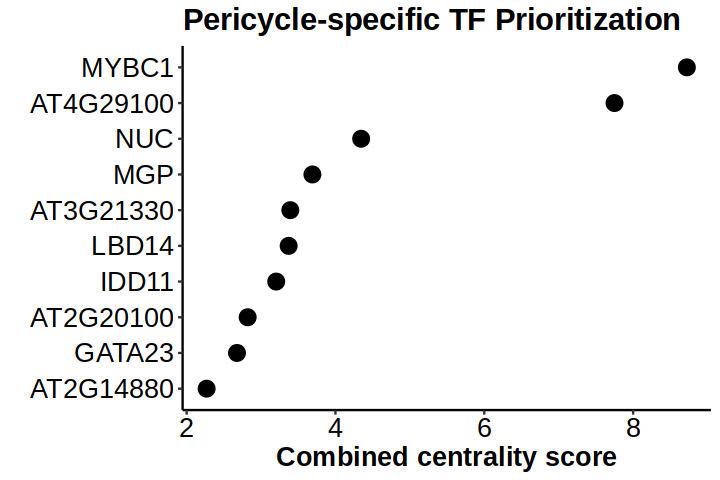

In [187]:
options(repr.plot.width=6, repr.plot.height=4)
ggplot(per_rank[1:10,], aes(x=reorder(GeneName, per, decreasing = FALSE),  y=per)) + geom_point(size=4)+ 
  labs(title="Pericycle-specific TF Prioritization",x="", y = "Combined centrality score")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

In [188]:
write.csv(per_rank,"Pericycle_TF_centrality_all_transition_zscore3.csv", quote=FALSE, row.names=TRUE)

In [189]:
tf_rank <- per_rank %>% rownames(.)
# Max 20
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_bc(tf_rank[15])
p4 <- plot_bc(tf_rank[16]) + plot_bc(tf_rank[17]) + plot_bc(tf_rank[18]) + plot_bc(tf_rank[19]) + plot_bc(tf_rank[20])

p5 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p6 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
p7 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_oc(tf_rank[15])
p8 <- plot_oc(tf_rank[16]) + plot_oc(tf_rank[17]) + plot_oc(tf_rank[18]) + plot_oc(tf_rank[19]) + plot_oc(tf_rank[20])

p9 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p10 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
p11 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_ic(tf_rank[15])
p12 <- plot_ic(tf_rank[16]) + plot_ic(tf_rank[17]) + plot_ic(tf_rank[18]) + plot_ic(tf_rank[19]) + plot_ic(tf_rank[20])

In [190]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
p3 <- grid.grabExpr(draw(p3))
p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
p7 <- grid.grabExpr(draw(p7))
p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
p10 <- grid.grabExpr(draw(p10))
p11 <- grid.grabExpr(draw(p11))
p12 <- grid.grabExpr(draw(p12))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

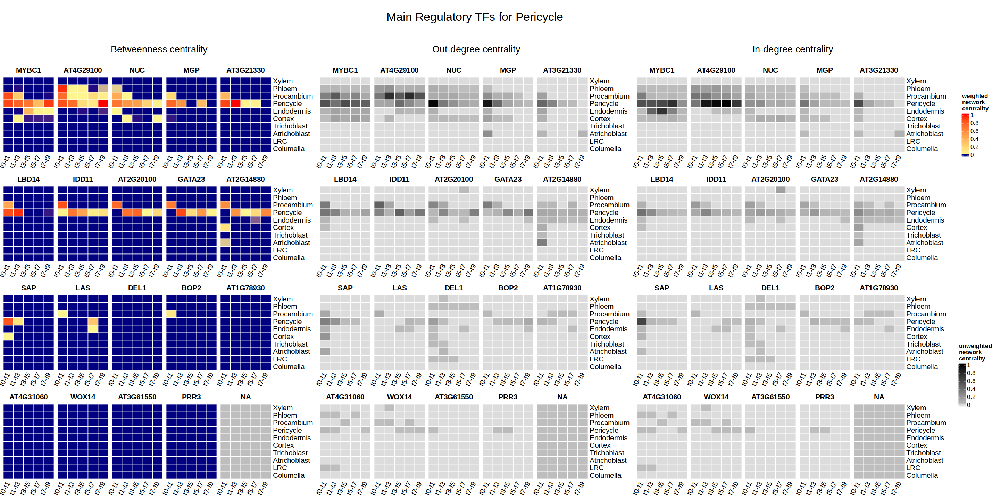

In [191]:
options(repr.plot.width=24, repr.plot.height=12)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Pericycle ", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,p3,p4,nrow=4),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p5,p6,p7,p8,nrow=4),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p9,p10,p11,p12,nrow=4),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))

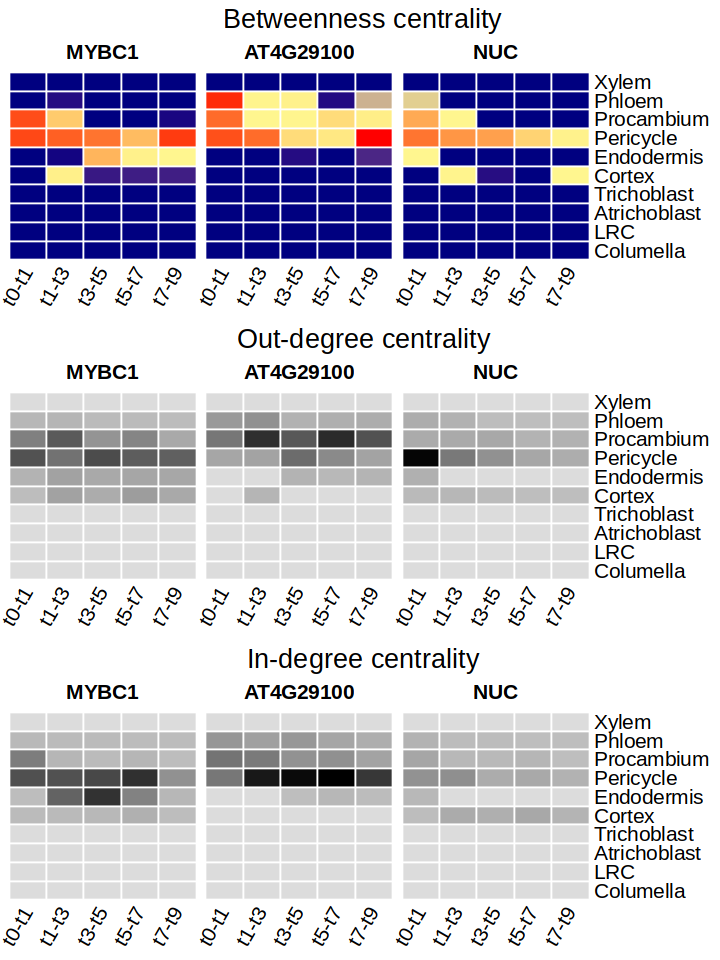

In [192]:
q1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3])
q2 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3])
q3 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3])

q1 <- grid.grabExpr(draw(q1))
q2 <- grid.grabExpr(draw(q2))
q3 <- grid.grabExpr(draw(q3))

options(repr.plot.width=6, repr.plot.height=8)
plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),q1,nrow=2,rel_heights = c(1, 8))
          ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),q2,nrow=2,rel_heights = c(1, 8))
          ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),q3,nrow=2,rel_heights = c(1, 8)),nrow=3)

## Procambium

In [193]:
pro_rank <- bc_rank[which(bc_rank$pro*2 > bc_rank$all),]%>% arrange(desc(pro))
pro_rank$GeneName <- rownames(pro_rank)

In [194]:
pro_rank

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID,GeneName
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
MYB43,16.063077043,0.00000000,0.000000000,0.00000000,0.018462790,4.879714006,8.047714481,0.240494235,2.876691531,0.000000000,0.000000000,AT5G16600,MYB43
ABO3,12.418181467,0.38711177,0.072070692,0.00000000,0.067673475,4.010305263,7.290287611,0.174468836,0.416263819,0.000000000,0.000000000,AT1G66600,ABO3
TCP15,9.177076070,0.00000000,0.000000000,0.00000000,0.000000000,0.649598318,4.681848534,2.137878696,1.707750521,0.000000000,0.000000000,AT1G69690,TCP15
HAT9,5.492151241,0.06870023,0.000000000,0.01447595,0.013073992,1.585263738,3.699553013,0.000000000,0.111084324,0.000000000,0.000000000,AT2G22800,HAT9
NAC001,5.586097156,0.00000000,0.004202144,0.48247334,0.179606108,1.415983701,2.859578995,0.006254167,0.637998702,0.000000000,0.000000000,AT1G01010,NAC001
ERF12,4.871129058,0.00000000,0.000000000,0.00000000,0.012143626,1.683704940,2.816567231,0.000000000,0.358713261,0.000000000,0.000000000,AT1G28360,ERF12
IDD14,5.343304900,0.00000000,0.000000000,0.01079147,0.003872669,1.393400783,2.734130023,0.391099760,0.810010191,0.000000000,0.000000000,AT1G68130,IDD14
AT1G75490,2.958317094,0.00000000,0.000000000,0.00000000,0.000000000,0.170210951,2.465071484,0.000000000,0.310691582,0.000000000,0.012343077,AT1G75490,AT1G75490
AT4G20970,2.161550767,0.00000000,0.000000000,0.00000000,0.002868069,0.427155755,1.678458718,0.000000000,0.053068226,0.000000000,0.000000000,AT4G20970,AT4G20970


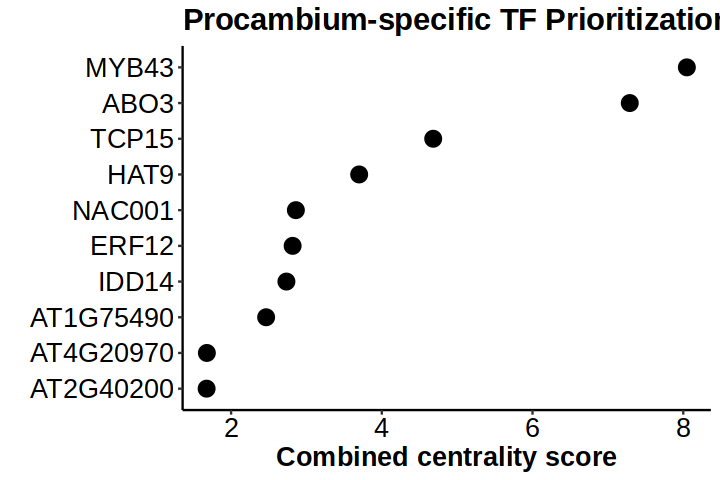

In [195]:
options(repr.plot.width=6, repr.plot.height=4)
ggplot(pro_rank[1:10,], aes(x=reorder(GeneName, pro, decreasing = FALSE),  y=pro)) + geom_point(size=4)+ 
  labs(title="Procambium-specific TF Prioritization",x="", y = "Combined centrality score")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

In [196]:
write.csv(pro_rank,"Procambium_TF_centrality_all_transition_zscore3.csv", quote=FALSE, row.names=TRUE)

In [197]:
tf_rank <- pro_rank %>% rownames(.)
# Max 30
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_blank(tf_rank[15])

p4 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p5 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
p6 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_blank(tf_rank[15])

p7 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p8 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
p9 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_blank(tf_rank[15])

In [198]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
p3 <- grid.grabExpr(draw(p3))
p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
p7 <- grid.grabExpr(draw(p7))
p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

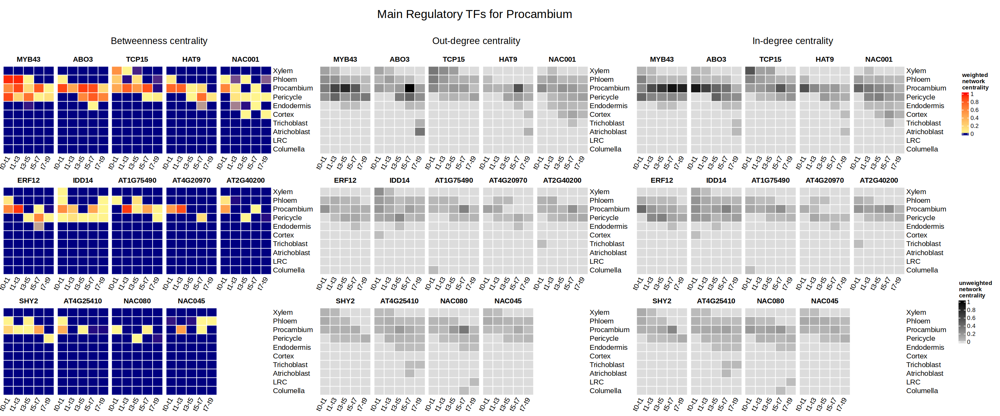

In [199]:
options(repr.plot.width=24, repr.plot.height=10)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Procambium ", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,p3,nrow=3),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p4,p5,p6,nrow=3),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p7,p8,p9,nrow=3),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))

## Phloem

In [200]:
phl_rank <- bc_rank[which(bc_rank$phl*2 > bc_rank$all),]%>% arrange(desc(phl))
phl_rank$GeneName <- rownames(phl_rank)

In [201]:
phl_rank

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID,GeneName
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
APL,17.844322073,0.00000000,0.000000000,0.000000000,0.000000000,1.895694774,1.714937260,2.164953147,12.068736892,0.000000000,0.000000000,AT1G79430,APL
OBP2,19.626516178,0.00000000,0.000000000,0.000000000,0.000000000,2.886506004,5.836194997,0.015082655,10.888732521,0.000000000,0.000000000,AT1G07640,OBP2
AT3G12730,9.807026857,0.00000000,0.000000000,0.000000000,0.000000000,1.085095947,0.202927880,0.000000000,8.519003030,0.000000000,0.000000000,AT3G12730,AT3G12730
DOF6,10.369908100,0.00000000,0.000000000,0.000000000,0.000000000,1.293766765,0.462508272,1.782009903,6.831623160,0.000000000,0.000000000,AT3G45610,DOF6
AT2G03500,8.337749613,0.00000000,0.000000000,0.000000000,0.000000000,1.110191244,1.136420947,0.020165247,6.070972175,0.000000000,0.000000000,AT2G03500,AT2G03500
DAR2,8.618352004,0.00000000,0.000000000,0.000000000,0.000000000,1.143452224,1.108834134,0.468422625,5.897643021,0.000000000,0.000000000,AT2G39830,DAR2
AT2G28810,9.426614047,0.00000000,0.000000000,0.000000000,0.000000000,1.580162327,2.663112048,0.026254293,5.157085378,0.000000000,0.000000000,AT2G28810,AT2G28810
HCA2,5.517875746,0.00000000,0.000000000,0.000000000,0.000000000,0.348325274,0.231431791,0.015214752,4.922903929,0.000000000,0.000000000,AT5G62940,HCA2
NAC057,5.520438511,0.00000000,0.000000000,0.000000000,0.000000000,0.345280579,0.512603280,0.015214752,4.647339899,0.000000000,0.000000000,AT3G17730,NAC057


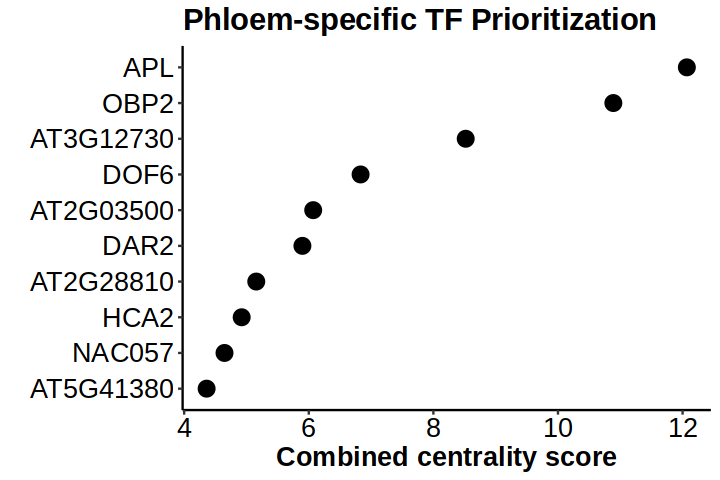

In [202]:
options(repr.plot.width=6, repr.plot.height=4)
ggplot(phl_rank[1:10,], aes(x=reorder(GeneName, phl, decreasing = FALSE),  y=phl)) + geom_point(size=4)+ 
  labs(title="Phloem-specific TF Prioritization",x="", y = "Combined centrality score")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

In [203]:
write.csv(phl_rank,"Phloem_TF_centrality_all_transition_zscore3.csv", quote=FALSE, row.names=TRUE)

In [204]:
tf_rank <- phl_rank %>% rownames(.)
# Max 20
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_bc(tf_rank[15])
p4 <- plot_bc(tf_rank[16]) + plot_bc(tf_rank[17]) + plot_bc(tf_rank[18]) + plot_bc(tf_rank[19]) + plot_bc(tf_rank[20])

p5 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p6 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
p7 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_oc(tf_rank[15])
p8 <- plot_oc(tf_rank[16]) + plot_oc(tf_rank[17]) + plot_oc(tf_rank[18]) + plot_oc(tf_rank[19]) + plot_oc(tf_rank[20])

p9 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p10 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
p11 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_ic(tf_rank[15])
p12 <- plot_ic(tf_rank[16]) + plot_ic(tf_rank[17]) + plot_ic(tf_rank[18]) + plot_ic(tf_rank[19]) + plot_ic(tf_rank[20])

In [205]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
p3 <- grid.grabExpr(draw(p3))
p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
p7 <- grid.grabExpr(draw(p7))
p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
p10 <- grid.grabExpr(draw(p10))
p11 <- grid.grabExpr(draw(p11))
p12 <- grid.grabExpr(draw(p12))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

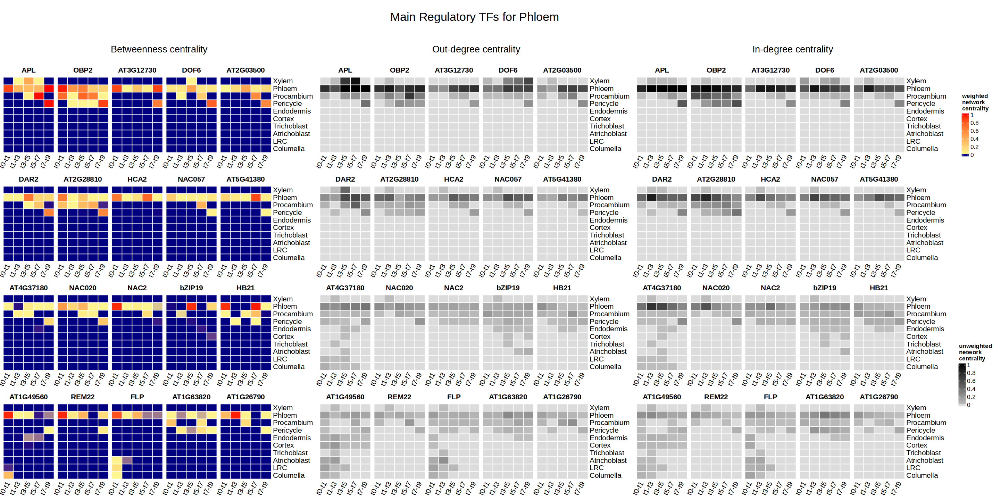

In [206]:
options(repr.plot.width=24, repr.plot.height=12)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Phloem ", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,p3,p4,nrow=4),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p5,p6,p7,p8,nrow=4),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p9,p10,p11,p12,nrow=4),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))

## Xylem

In [207]:
xyl_rank <- bc_rank[which(bc_rank$xyl*2 > bc_rank$all),]%>% arrange(desc(xyl))
xyl_rank$GeneName <- rownames(xyl_rank)

In [208]:
xyl_rank

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID,GeneName
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
AT1G68810,11.536622,0.00000000,0.000000000,0.000000000,0.000000000,0.00000000,0.32495975,11.041633,0.17002908,0.000000000,0.00000000,AT1G68810,AT1G68810
VND2,9.638343,0.00000000,0.000000000,0.000000000,0.000000000,0.00000000,0.02646882,9.611874,0.00000000,0.000000000,0.00000000,AT4G36160,VND2
MYB46,8.777686,0.00000000,0.000000000,0.000000000,0.000000000,0.00000000,0.00000000,8.777686,0.00000000,0.000000000,0.00000000,AT5G12870,MYB46
ATHB-15,13.243226,0.00000000,0.000000000,0.000000000,0.000000000,0.59770967,3.71766157,8.558721,0.36913403,0.000000000,0.00000000,AT1G52150,ATHB-15
DOF2,10.249995,0.00000000,0.000000000,0.351580305,1.282458163,0.00000000,0.00000000,8.527854,0.00000000,0.050294993,0.03780762,AT3G21270,DOF2
MYB83,8.033038,0.00000000,0.000000000,0.000000000,0.000000000,0.00000000,0.00000000,8.033038,0.00000000,0.000000000,0.00000000,AT3G08500,MYB83
VND3,7.788913,0.00000000,0.000000000,0.000000000,0.000000000,0.00000000,0.03811280,7.750800,0.00000000,0.000000000,0.00000000,AT5G66300,VND3
AT1G66810,7.561682,0.01586414,0.026086404,0.000000000,0.000000000,0.00000000,0.00000000,7.400563,0.00000000,0.119168117,0.00000000,AT1G66810,AT1G66810
VND7,7.301973,0.00000000,0.000000000,0.000000000,0.000000000,0.00000000,0.00000000,7.301973,0.00000000,0.000000000,0.00000000,AT1G71930,VND7


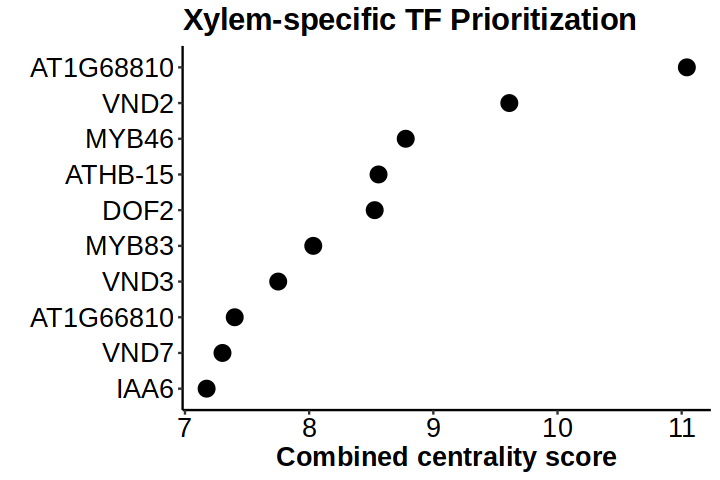

In [209]:
options(repr.plot.width=6, repr.plot.height=4)
ggplot(xyl_rank[1:10,], aes(x=reorder(GeneName, xyl, decreasing = FALSE),  y=xyl)) + geom_point(size=4)+ 
  labs(title="Xylem-specific TF Prioritization",x="", y = "Combined centrality score")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

In [210]:
write.csv(xyl_rank,"Xylem_TF_centrality_all_transition_zscore3.csv", quote=FALSE, row.names=TRUE)

In [211]:
tf_rank <- xyl_rank %>% rownames(.)
# Max 20
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_bc(tf_rank[15])
p4 <- plot_bc(tf_rank[16]) + plot_bc(tf_rank[17]) + plot_bc(tf_rank[18]) + plot_bc(tf_rank[19]) + plot_bc(tf_rank[20])

p5 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p6 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
p7 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_oc(tf_rank[15])
p8 <- plot_oc(tf_rank[16]) + plot_oc(tf_rank[17]) + plot_oc(tf_rank[18]) + plot_oc(tf_rank[19]) + plot_oc(tf_rank[20])

p9 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p10 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
p11 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_ic(tf_rank[15])
p12 <- plot_ic(tf_rank[16]) + plot_ic(tf_rank[17]) + plot_ic(tf_rank[18]) + plot_ic(tf_rank[19]) + plot_ic(tf_rank[20])

In [212]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
p3 <- grid.grabExpr(draw(p3))
p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
p7 <- grid.grabExpr(draw(p7))
p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
p10 <- grid.grabExpr(draw(p10))
p11 <- grid.grabExpr(draw(p11))
p12 <- grid.grabExpr(draw(p12))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

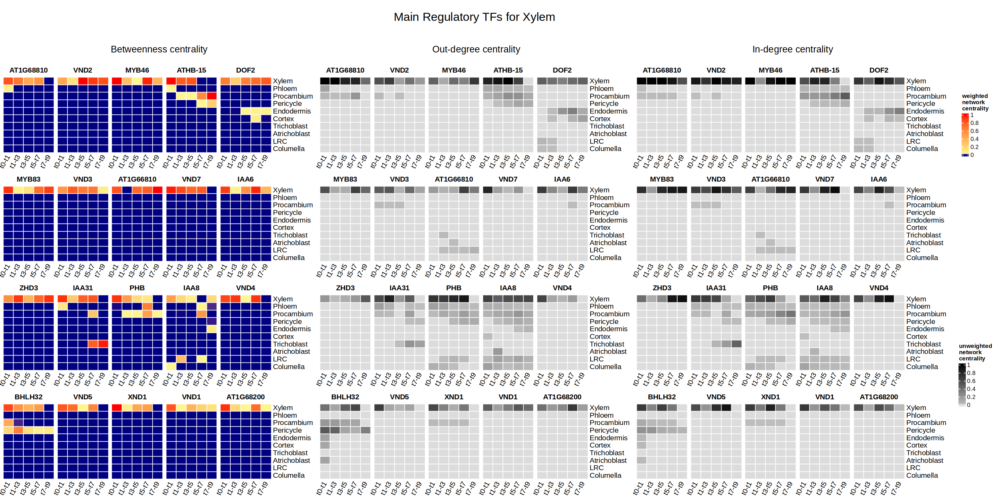

In [213]:
options(repr.plot.width=24, repr.plot.height=12)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Xylem ", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,p3,p4,nrow=4),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p5,p6,p7,p8,nrow=4),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p9,p10,p11,p12,nrow=4),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))

## LRC

In [214]:
lrc_rank <- bc_rank[which(bc_rank$lrc*2 > bc_rank$all),]%>% arrange(desc(lrc))
lrc_rank$GeneName <- rownames(lrc_rank)

In [215]:
lrc_rank

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID,GeneName
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
AT1G68920,12.028456518,0.80269789,0.066031541,0.35244162,0.129029370,0.000000000,0.000000000,0.00000000,0.050039116,6.069123864,4.55909312,AT1G68920,AT1G68920
ANL2,9.794258630,2.66677616,0.479300264,0.57303214,0.151216222,0.000000000,0.000000000,0.00000000,0.000000000,4.977955879,0.94597797,AT4G00730,ANL2
OFP6,4.865209570,0.81111328,0.000000000,0.00000000,0.000000000,0.000000000,0.000000000,0.00000000,0.000000000,4.031024308,0.02307198,AT3G52525,OFP6
ASL1,7.139711374,0.92904994,0.160306017,0.21414076,0.080168941,0.000000000,0.000000000,0.00000000,0.000000000,3.587946721,2.16809900,AT5G66870,ASL1
AT1G05805,6.422509285,0.53216520,0.286505224,0.08255675,0.000000000,0.000000000,0.000000000,0.00000000,0.000000000,3.228166038,2.29311608,AT1G05805,AT1G05805
AT1G69030,5.649837921,0.41092076,0.120856558,0.16213030,0.301310724,0.032585593,0.007205912,0.79317340,0.143402744,3.134753625,0.54349831,AT1G69030,AT1G69030
AT5G48560,5.877041418,0.56988054,0.028008727,0.16405786,0.095136546,0.038354731,0.138869733,0.00000000,0.174961065,3.118548124,1.54922409,AT5G48560,AT5G48560
AIL5,5.291341118,0.47478752,0.016601883,0.10745552,0.040084471,0.000000000,0.022200745,0.00000000,0.000000000,3.104543481,1.52566750,AT5G57390,AIL5
WRKY11,5.311201179,0.75893219,0.333131627,0.17338140,0.166824582,0.111499756,0.260780670,0.20035394,0.055042565,2.793604747,0.45764970,AT4G31550,WRKY11


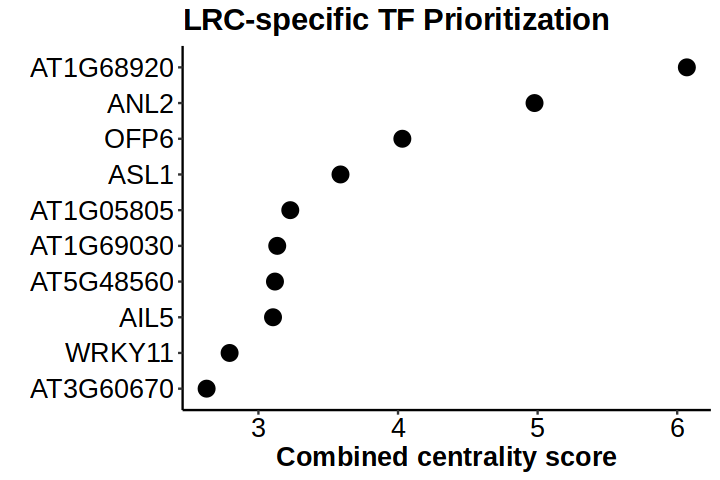

In [216]:
options(repr.plot.width=6, repr.plot.height=4)
ggplot(lrc_rank[1:10,], aes(x=reorder(GeneName, lrc, decreasing = FALSE),  y=lrc)) + geom_point(size=4)+ 
  labs(title="LRC-specific TF Prioritization",x="", y = "Combined centrality score")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

In [217]:
write.csv(lrc_rank,"LRC_TF_centrality_all_transition_zscore3.csv", quote=FALSE, row.names=TRUE)

In [218]:
tf_rank <- lrc_rank %>% rownames(.)
# Max 20
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_bc(tf_rank[15])
p4 <- plot_bc(tf_rank[16]) + plot_bc(tf_rank[17]) + plot_bc(tf_rank[18]) + plot_bc(tf_rank[19]) + plot_bc(tf_rank[20])

p5 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p6 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
p7 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_oc(tf_rank[15])
p8 <- plot_oc(tf_rank[16]) + plot_oc(tf_rank[17]) + plot_oc(tf_rank[18]) + plot_oc(tf_rank[19]) + plot_oc(tf_rank[20])

p9 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p10 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
p11 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_ic(tf_rank[15])
p12 <- plot_ic(tf_rank[16]) + plot_ic(tf_rank[17]) + plot_ic(tf_rank[18]) + plot_ic(tf_rank[19]) + plot_ic(tf_rank[20])

In [219]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
p3 <- grid.grabExpr(draw(p3))
p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
p7 <- grid.grabExpr(draw(p7))
p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
p10 <- grid.grabExpr(draw(p10))
p11 <- grid.grabExpr(draw(p11))
p12 <- grid.grabExpr(draw(p12))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

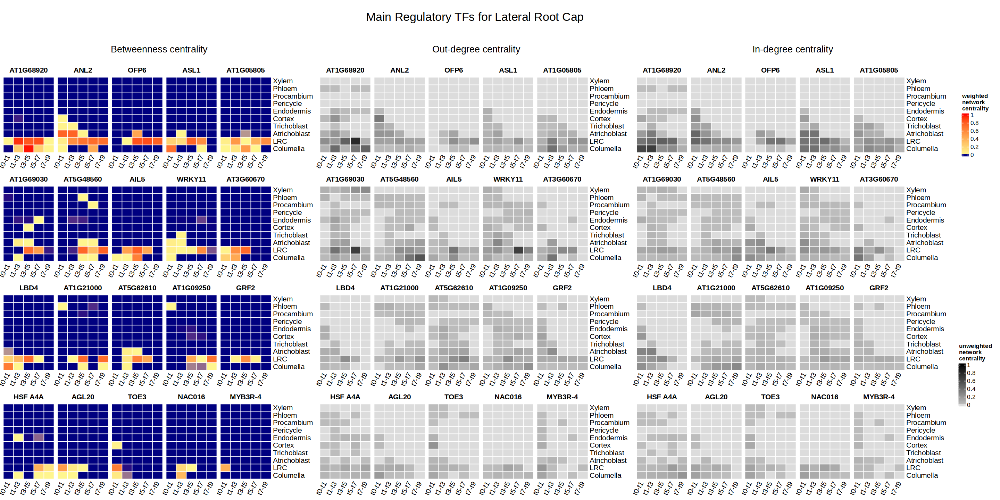

In [220]:
options(repr.plot.width=24, repr.plot.height=12)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Lateral Root Cap ", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,p3,p4,nrow=4),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p5,p6,p7,p8,nrow=4),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p9,p10,p11,p12,nrow=4),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))

## Columella

In [221]:
col_rank <- bc_rank[which(bc_rank$col*2 > bc_rank$all),]%>% arrange(desc(col))
col_rank$GeneName <- rownames(col_rank)

In [222]:
col_rank

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID,GeneName
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
NAC042,15.848132176,0.013811893,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,6.854929780,8.979390503,AT2G43000,NAC042
RAP2.4,10.006093142,0.186297480,0.008448429,0.282168255,0.182106509,0.116762648,0.290389873,0.178080743,0.096254210,2.979364487,5.686220508,AT1G78080,RAP2.4
LBD41,9.456000605,0.307008709,0.191520974,0.000000000,0.070337772,0.069542655,0.139797662,0.003778920,0.000000000,3.469790935,5.204222979,AT3G02550,LBD41
AT3G52440,9.429183334,0.985446142,0.000000000,0.172878368,0.012611943,0.000000000,0.000000000,0.000000000,0.000000000,3.236305265,5.021941616,AT3G52440,AT3G52440
WRKY33,8.874355007,0.452522181,0.137972930,0.898694396,0.359952109,0.061746041,0.019995697,0.000000000,0.000000000,2.119999332,4.823472321,AT2G38470,WRKY33
FBH4,8.394265863,0.095062463,0.016515136,0.377258006,0.020283339,0.000000000,0.000000000,0.000000000,0.000000000,3.482554761,4.402592158,AT2G42280,FBH4
NAM,5.032279576,0.049435808,0.000000000,0.087143552,0.012428298,0.011567265,0.035736305,0.000000000,0.000000000,1.742243550,3.093724799,AT1G52880,NAM
MYB55,5.168010880,0.000000000,0.000000000,0.204637710,0.037920439,0.190036368,0.542549136,0.000000000,0.670759127,0.556416987,2.965691113,AT4G01680,MYB55
ARF10,5.331093835,0.311459849,0.005195039,0.063037907,0.091195214,0.000000000,0.000000000,0.052948378,0.059813008,1.805865438,2.941579001,AT2G28350,ARF10


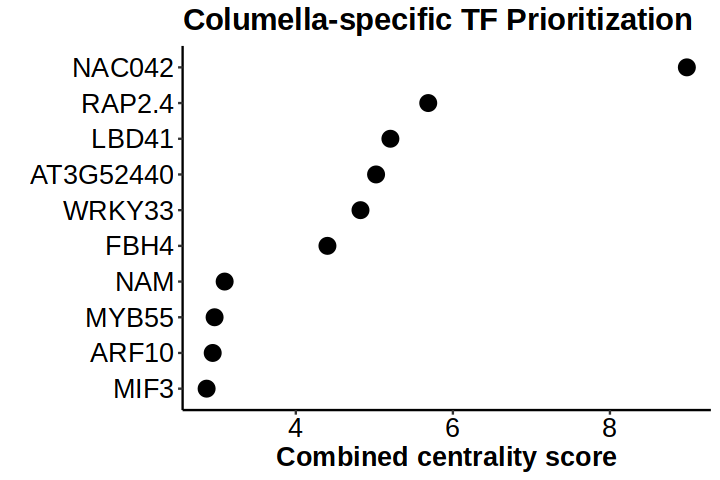

In [223]:
options(repr.plot.width=6, repr.plot.height=4)
ggplot(col_rank[1:10,], aes(x=reorder(GeneName, col, decreasing = FALSE),  y=col)) + geom_point(size=4)+ 
  labs(title="Columella-specific TF Prioritization",x="", y = "Combined centrality score")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

In [224]:
write.csv(col_rank,"Columella_TF_centrality_all_transition_zscore3.csv", quote=FALSE, row.names=TRUE)

In [225]:
tf_rank <- col_rank %>% rownames(.)
# Max 20
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_bc(tf_rank[15])
p4 <- plot_bc(tf_rank[16]) + plot_bc(tf_rank[17]) + plot_bc(tf_rank[18]) + plot_bc(tf_rank[19]) + plot_bc(tf_rank[20])

p5 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p6 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
p7 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_oc(tf_rank[15])
p8 <- plot_oc(tf_rank[16]) + plot_oc(tf_rank[17]) + plot_oc(tf_rank[18]) + plot_oc(tf_rank[19]) + plot_oc(tf_rank[20])

p9 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p10 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
p11 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_ic(tf_rank[15])
p12 <- plot_ic(tf_rank[16]) + plot_ic(tf_rank[17]) + plot_ic(tf_rank[18]) + plot_ic(tf_rank[19]) + plot_ic(tf_rank[20])

In [226]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
p3 <- grid.grabExpr(draw(p3))
p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
p7 <- grid.grabExpr(draw(p7))
p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
p10 <- grid.grabExpr(draw(p10))
p11 <- grid.grabExpr(draw(p11))
p12 <- grid.grabExpr(draw(p12))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

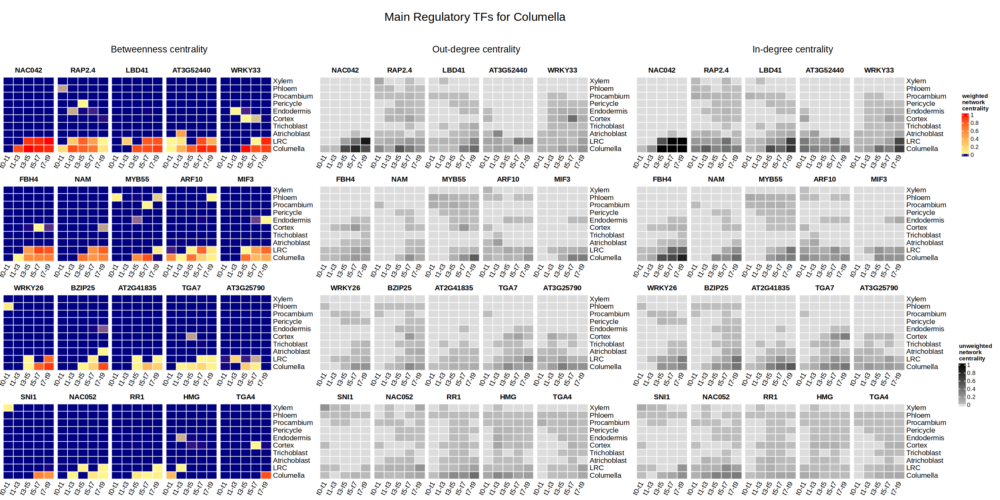

In [227]:
options(repr.plot.width=24, repr.plot.height=12)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Columella ", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,p3,p4,nrow=4),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p5,p6,p7,p8,nrow=4),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p9,p10,p11,p12,nrow=4),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))

## Add tissue level

In [228]:
bc_rank <- bc_rank %>% mutate(ground=cor+end, epi=atri+tri, stele=per+pro+xyl+phl, epilrc=atri+tri+lrc, rc=lrc+col)

In [229]:
head(bc_rank)

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID,ground,epi,stele,epilrc,rc
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
BZIP9,31.42213,0.000000,0.000000,0.00000000,0.005736138,8.55316613,11.88088107,0.02003315,10.9623184,0.000000,0.000000,AT5G24800,0.005736138,0.000000,31.41639871,0.00000,0.000000
AT3G43430,29.05965,0.000000,0.000000,0.00544388,0.029360833,9.20656526,11.24626128,1.83863137,6.7333880,0.000000,0.000000,AT3G43430,0.034804713,0.000000,29.02484588,0.00000,0.000000
PLT1,23.97514,3.940608,0.000000,2.00953127,1.492057686,0.05699842,0.00000000,0.00000000,0.0000000,9.148008,7.327940,AT3G20840,3.501588961,3.940608,0.05699842,13.08862,16.475948
HAT7,33.13977,6.200914,5.547329,8.04274907,5.877125010,1.24427942,0.00000000,0.00000000,0.0122843,4.284922,1.930171,AT5G15150,13.919874084,11.748243,1.25656372,16.03317,6.215093
MYB36,20.57418,0.000000,0.000000,6.29093689,10.748544272,3.53469871,0.00000000,0.00000000,0.0000000,0.000000,0.000000,AT5G57620,17.039481158,0.000000,3.53469871,0.00000,0.000000
GATA2,33.12273,6.623792,6.596557,2.46621779,2.051664424,0.80375905,0.03881894,0.09406244,0.1559529,12.103509,2.188393,AT2G45050,4.517882216,13.220349,1.09259336,25.32386,14.291902


## Ground Tissue

In [230]:
ground_rank <- bc_rank[which(bc_rank$ground*2 > bc_rank$all),]%>% arrange(desc(ground))
ground_rank <- ground_rank[-c(match(rownames(cor_rank), rownames(ground_rank)),match(rownames(end_rank), rownames(ground_rank))),]
ground_rank$GeneName <- rownames(ground_rank)

In [231]:
ground_rank

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID,ground,epi,stele,epilrc,rc,GeneName
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
MYB12,23.6925714,0.086429636,0.116639239,7.788192391,5.78330037,1.929749529,0.516205906,3.371248525,1.210403057,0.110529735,2.779872975,AT2G47460,13.57149276,0.203068875,7.027607017,0.31359861,2.890402710,MYB12
MYB3,11.8841880,0.516196596,0.089796448,2.733348149,5.59048060,2.347020632,0.023860054,0.392757518,0.051272502,0.135677055,0.003778406,AT1G22640,8.32382874,0.605993044,2.814910706,0.74167010,0.139455462,MYB3
JKD,8.4732071,0.000000000,0.000000000,3.707652355,2.97524102,0.046405172,0.000000000,0.000000000,0.000000000,0.000000000,1.743908530,AT5G03150,6.68289338,0.000000000,0.046405172,0.00000000,1.743908530,JKD
AN3,9.1822731,1.164651915,0.192213903,2.337373113,3.15346845,2.100233534,0.058317549,0.000000000,0.058683307,0.112312266,0.005019101,AT5G28640,5.49084156,1.356865818,2.217234390,1.46917808,0.117331367,AN3
ARR3,8.5913166,0.277809106,0.042398606,2.342944255,3.13353902,1.024916677,0.292536040,0.000000000,0.761437377,0.227870782,0.487864717,AT1G59940,5.47648327,0.320207712,2.078890094,0.54807849,0.715735499,ARR3
AtHB23,8.8753093,0.501488974,0.374681517,3.154663839,1.83622525,1.774905009,0.759227164,0.123371046,0.238366599,0.047751144,0.064628773,AT1G26960,4.99088909,0.876170491,2.895869819,0.92392163,0.112379917,AtHB23
GATA16,9.1755332,0.000000000,0.000000000,2.717450549,1.93427924,1.963803057,0.385471434,0.600895613,0.024737577,0.274582712,1.274312995,AT5G49300,4.65172978,0.000000000,2.974907680,0.27458271,1.548895708,GATA16
ULT1,7.0016708,0.112700338,0.004686656,2.229074863,2.07787649,1.582433859,0.147766912,0.195664304,0.032078314,0.394481296,0.224907778,AT4G28190,4.30695135,0.117386994,1.957943389,0.51186829,0.619389073,ULT1
HSFB4,5.2735423,0.120861144,0.000000000,1.634055563,2.58265054,0.381517308,0.423129431,0.099979596,0.031348729,0.000000000,0.000000000,AT1G46264,4.21670610,0.120861144,0.935975064,0.12086114,0.000000000,HSFB4


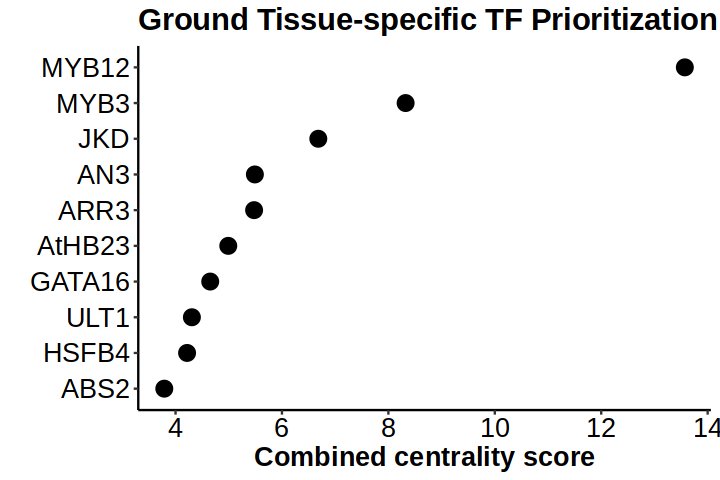

In [232]:
options(repr.plot.width=6, repr.plot.height=4)
ggplot(ground_rank[1:10,], aes(x=reorder(GeneName, ground, decreasing = FALSE),  y=ground)) + geom_point(size=4)+ 
  labs(title="Ground Tissue-specific TF Prioritization",x="", y = "Combined centrality score")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

In [233]:
write.csv(ground_rank,"Ground_Tissue_TF_centrality_all_transition_zscore3.csv", quote=FALSE, row.names=TRUE)

In [234]:
tf_rank <- ground_rank %>% rownames(.)
# Max 20
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_bc(tf_rank[15])
p4 <- plot_bc(tf_rank[16]) + plot_bc(tf_rank[17]) + plot_bc(tf_rank[18]) + plot_bc(tf_rank[19]) + plot_bc(tf_rank[20])

p5 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p6 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
p7 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_oc(tf_rank[15])
p8 <- plot_oc(tf_rank[16]) + plot_oc(tf_rank[17]) + plot_oc(tf_rank[18]) + plot_oc(tf_rank[19]) + plot_oc(tf_rank[20])

p9 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p10 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
p11 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_ic(tf_rank[15])
p12 <- plot_ic(tf_rank[16]) + plot_ic(tf_rank[17]) + plot_ic(tf_rank[18]) + plot_ic(tf_rank[19]) + plot_ic(tf_rank[20])

In [235]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
p3 <- grid.grabExpr(draw(p3))
p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
p7 <- grid.grabExpr(draw(p7))
p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
p10 <- grid.grabExpr(draw(p10))
p11 <- grid.grabExpr(draw(p11))
p12 <- grid.grabExpr(draw(p12))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

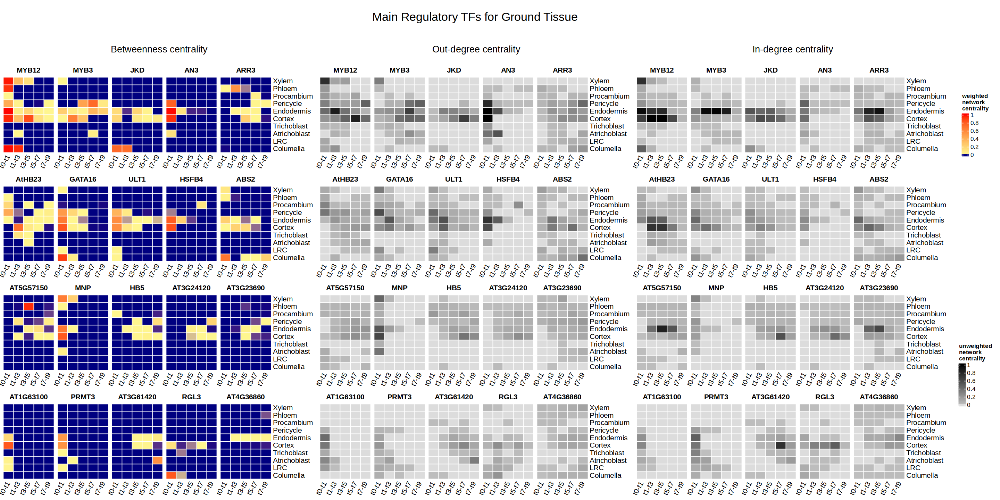

In [236]:
options(repr.plot.width=24, repr.plot.height=12)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Ground Tissue ", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,p3,p4,nrow=4),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p5,p6,p7,p8,nrow=4),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p9,p10,p11,p12,nrow=4),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))

## Epidermis

In [237]:
epi_rank <- bc_rank[which(bc_rank$epi*2 > bc_rank$all),]%>% arrange(desc(epi))
epi_rank <- epi_rank[-c(match(rownames(atri_rank), rownames(epi_rank)),match(rownames(tri_rank), rownames(epi_rank))),]
epi_rank$GeneName <- rownames(epi_rank)

In [238]:
epi_rank

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID,ground,epi,stele,epilrc,rc,GeneName
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
WRKY75,14.27247625,4.50121971,6.35682293,0.105330391,0.020802243,0.000000000,0.000000000,0.000000000,0.00000000,0.562987445,2.725313541,AT5G13080,0.126132634,10.85804263,0.000000000,11.42103008,3.288300987,WRKY75
KDR,11.62635997,5.16954066,4.61693369,0.687132713,0.421165730,0.122605397,0.000000000,0.000000000,0.00000000,0.467248858,0.141732932,AT1G26945,1.108298444,9.78647434,0.122605397,10.25372320,0.608981789,KDR
TGA10,11.88448968,4.95436167,4.44299660,1.568650672,0.855081570,0.000000000,0.000000000,0.000000000,0.00000000,0.063399162,0.000000000,AT5G06839,2.423732242,9.39735827,0.000000000,9.46075743,0.063399162,TGA10
ATS,16.50726004,5.44112099,3.30585225,0.968613101,0.707613234,0.051316603,0.000000000,0.000000000,0.00000000,5.946192427,0.086551437,AT5G42630,1.676226335,8.74697324,0.051316603,14.69316566,6.032743865,ATS
ATMYC1,9.78145051,3.77655716,4.62113827,0.678339208,0.609503007,0.095912867,0.000000000,0.000000000,0.00000000,0.000000000,0.000000000,AT4G00480,1.287842216,8.39769543,0.095912867,8.39769543,0.000000000,ATMYC1
ATHB13,12.94066661,3.43823012,4.68668673,1.275819260,1.039918586,1.305370636,0.284257457,0.000000000,0.11530623,0.742912093,0.052165503,AT1G69780,2.315737846,8.12491684,1.704934322,8.86782894,0.795077596,ATHB13
ARR5,8.89376453,3.90153218,3.60543610,0.323971285,0.220153526,0.004604770,0.036677828,0.028683106,0.04366444,0.315386196,0.413655090,AT3G48100,0.544124811,7.50696828,0.113630146,7.82235448,0.729041287,ARR5
EGL3,9.21190572,3.31146732,2.93164385,1.616857995,1.213590291,0.138346265,0.000000000,0.000000000,0.00000000,0.000000000,0.000000000,AT1G63650,2.830448286,6.24311117,0.138346265,6.24311117,0.000000000,EGL3
RSL1,7.02070379,2.79503956,3.39167865,0.391179276,0.442806304,0.000000000,0.000000000,0.000000000,0.00000000,0.000000000,0.000000000,AT5G37800,0.833985580,6.18671821,0.000000000,6.18671821,0.000000000,RSL1


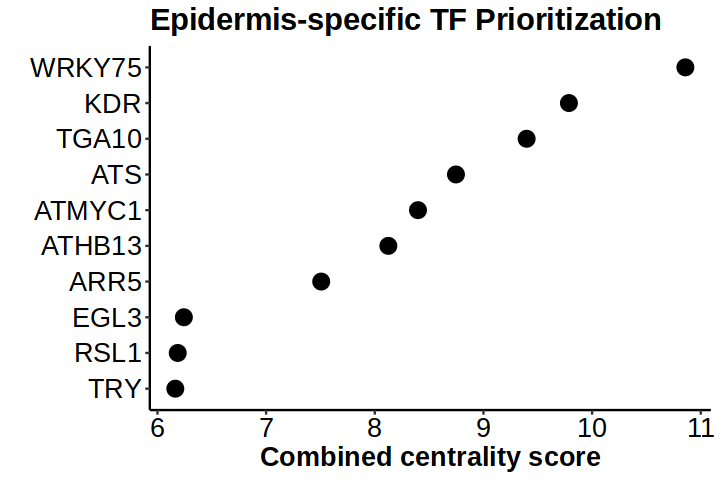

In [239]:
options(repr.plot.width=6, repr.plot.height=4)
ggplot(epi_rank[1:10,], aes(x=reorder(GeneName, epi, decreasing = FALSE),  y=epi)) + geom_point(size=4)+ 
  labs(title="Epidermis-specific TF Prioritization",x="", y = "Combined centrality score")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

In [240]:
write.csv(epi_rank,"Epidermis_TF_centrality_all_transition_zscore3.csv", quote=FALSE, row.names=TRUE)

In [241]:
tf_rank <- epi_rank %>% rownames(.)
# Max 20
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_bc(tf_rank[15])
p4 <- plot_bc(tf_rank[16]) + plot_bc(tf_rank[17]) + plot_bc(tf_rank[18]) + plot_bc(tf_rank[19]) + plot_bc(tf_rank[20])

p5 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p6 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
p7 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_oc(tf_rank[15])
p8 <- plot_oc(tf_rank[16]) + plot_oc(tf_rank[17]) + plot_oc(tf_rank[18]) + plot_oc(tf_rank[19]) + plot_oc(tf_rank[20])

p9 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p10 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
p11 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_ic(tf_rank[15])
p12 <- plot_ic(tf_rank[16]) + plot_ic(tf_rank[17]) + plot_ic(tf_rank[18]) + plot_ic(tf_rank[19]) + plot_ic(tf_rank[20])

In [242]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
p3 <- grid.grabExpr(draw(p3))
p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
p7 <- grid.grabExpr(draw(p7))
p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
p10 <- grid.grabExpr(draw(p10))
p11 <- grid.grabExpr(draw(p11))
p12 <- grid.grabExpr(draw(p12))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

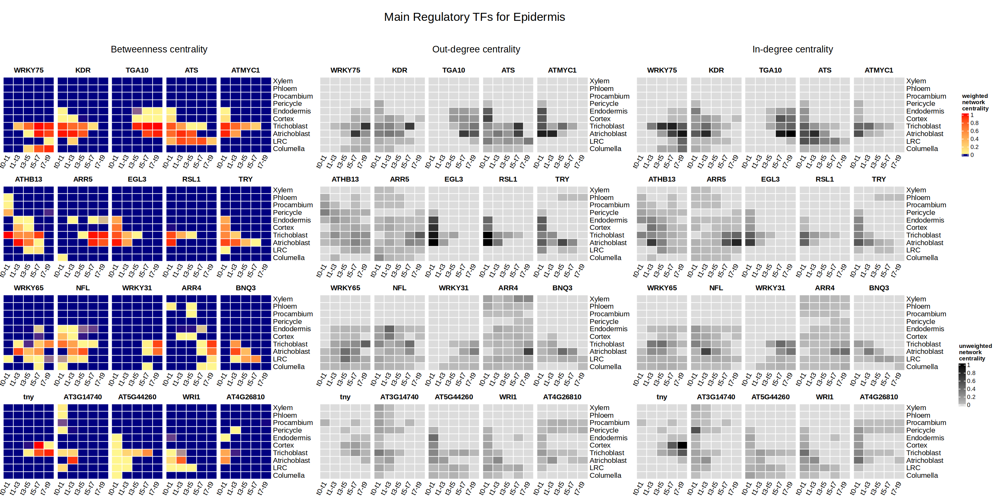

In [243]:
options(repr.plot.width=24, repr.plot.height=12)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Epidermis ", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,p3,p4,nrow=4),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p5,p6,p7,p8,nrow=4),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p9,p10,p11,p12,nrow=4),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))

## Epidermis + LRC

In [244]:
epilrc_rank <- bc_rank[which(bc_rank$epilrc*2 > bc_rank$all),]%>% arrange(desc(epilrc))
epilrc_rank <- epilrc_rank[-c(match(rownames(atri_rank), rownames(epilrc_rank)),match(rownames(tri_rank), rownames(epilrc_rank)),match(rownames(lrc_rank), rownames(epilrc_rank))),]
epilrc_rank$GeneName <- rownames(epilrc_rank)

In [245]:
epilrc_rank

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID,ground,epi,stele,epilrc,rc,GeneName
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
GATA2,33.122726,6.623792,6.596556930,2.4662178,2.051664424,0.80375905,0.038818942,0.094062436,0.155952926,12.10350859,2.18839297,AT2G45050,4.5178822,13.220349,1.092593358,25.323857,14.29190157,GATA2
NAI1,26.293062,4.531465,2.427442200,0.4453633,0.205157772,0.00000000,0.000000000,0.000000000,0.000000000,10.31475737,8.36887560,AT2G22770,0.6505211,6.958907,0.000000000,17.273665,18.68363298,NAI1
CRF3,23.156426,3.728132,2.509432523,1.5634632,1.455509716,0.22797244,0.046967234,0.000000000,0.007808814,9.41462626,4.20251415,AT5G53290,3.0189729,6.237564,0.282748493,15.652190,13.61714041,CRF3
ATS,16.507260,5.441121,3.305852246,0.9686131,0.707613234,0.05131660,0.000000000,0.000000000,0.000000000,5.94619243,0.08655144,AT5G42630,1.6762263,8.746973,0.051316603,14.693166,6.03274386,ATS
WRKY9,16.059040,3.419059,3.623664192,0.0000000,0.000000000,0.00000000,0.000000000,0.000000000,0.000000000,7.33266559,1.68365192,AT1G68150,0.0000000,7.042723,0.000000000,14.375388,9.01631751,WRKY9
WER,21.502304,4.805167,3.023849655,2.2988231,1.929804951,1.60818052,0.000000000,0.000000000,0.000000000,6.47458657,1.36189276,AT5G14750,4.2286280,7.829016,1.608180520,14.303603,7.83647933,WER
BRON,21.210029,4.113443,1.541404242,1.7786247,0.797459038,0.02949052,0.000000000,0.000000000,0.000000000,8.37774914,4.57185874,AT1G75710,2.5760837,5.654847,0.029490525,14.032596,12.94960788,BRON
CRF2,26.776206,4.253729,2.624377101,2.0929756,1.946945888,2.86595170,0.227652705,0.076617017,1.680974990,7.01682963,3.99015150,AT4G23750,4.0399215,6.878107,4.851196406,13.894936,11.00698114,CRF2
BT2,21.465456,3.193818,1.318831580,0.1865704,0.008604207,0.00000000,0.000000000,0.000000000,0.000000000,8.80460777,7.95302395,AT3G48360,0.1951746,4.512650,0.000000000,13.317258,16.75763172,BT2


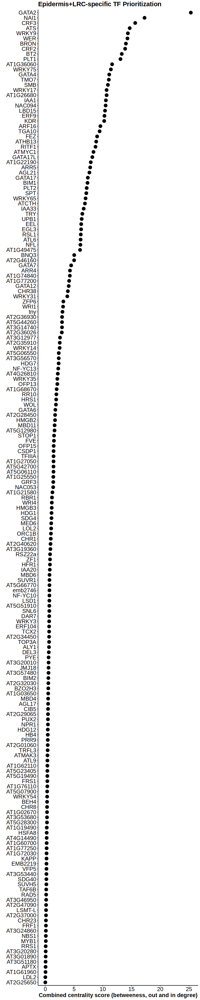

In [246]:
options(repr.plot.width=8, repr.plot.height=40)
ggplot(epilrc_rank, aes(x=reorder(GeneName, epilrc, decreasing = FALSE),  y=epilrc)) + geom_point(size=4)+ 
  labs(title="Epidermis+LRC-specific TF Prioritization",x="", y = "Combined centrality score (betweeness, out and in degree)")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

In [247]:
write.csv(epilrc_rank,"Epidermis_LRC_TF_centrality_all_transition_zscore3.csv", quote=FALSE, row.names=TRUE)

In [248]:
tf_rank <- epilrc_rank %>% rownames(.)
# Max 20
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_bc(tf_rank[15])
p4 <- plot_bc(tf_rank[16]) + plot_bc(tf_rank[17]) + plot_bc(tf_rank[18]) + plot_bc(tf_rank[19]) + plot_bc(tf_rank[20])

p5 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p6 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
p7 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_oc(tf_rank[15])
p8 <- plot_oc(tf_rank[16]) + plot_oc(tf_rank[17]) + plot_oc(tf_rank[18]) + plot_oc(tf_rank[19]) + plot_oc(tf_rank[20])

p9 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p10 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
p11 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_ic(tf_rank[15])
p12 <- plot_ic(tf_rank[16]) + plot_ic(tf_rank[17]) + plot_ic(tf_rank[18]) + plot_ic(tf_rank[19]) + plot_ic(tf_rank[20])

In [249]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
p3 <- grid.grabExpr(draw(p3))
p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
p7 <- grid.grabExpr(draw(p7))
p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
p10 <- grid.grabExpr(draw(p10))
p11 <- grid.grabExpr(draw(p11))
p12 <- grid.grabExpr(draw(p12))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

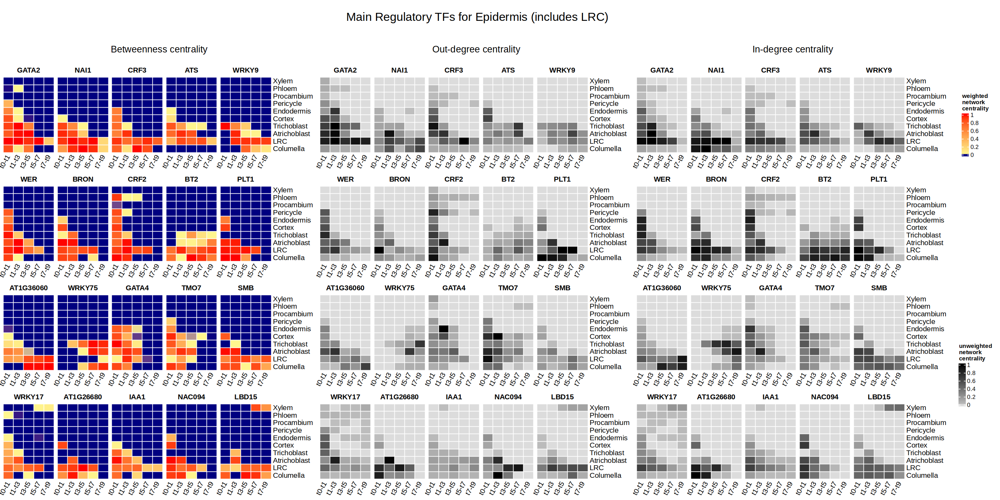

In [250]:
options(repr.plot.width=24, repr.plot.height=12)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Epidermis (includes LRC)", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,p3,p4,nrow=4),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p5,p6,p7,p8,nrow=4),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p9,p10,p11,p12,nrow=4),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))

## Stele

In [251]:
stele_rank <- bc_rank[which(bc_rank$stele*2 > bc_rank$all),]%>% arrange(desc(stele))
stele_rank <- stele_rank[-c(match(rownames(per_rank), rownames(stele_rank)),match(rownames(pro_rank), rownames(stele_rank)),match(rownames(xyl_rank), rownames(stele_rank)),match(rownames(phl_rank), rownames(stele_rank))),]
stele_rank$GeneName <- rownames(stele_rank)

In [252]:
stele_rank

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID,ground,epi,stele,epilrc,rc,GeneName
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
BZIP9,31.42213,0.0000000,0.000000000,0.000000000,0.005736138,8.553166,11.880881,0.02003315,10.9623184,0.00000000,0.00000000,AT5G24800,0.005736138,0.000000000,31.41640,0.000000000,0.00000000,BZIP9
AT3G43430,29.05965,0.0000000,0.000000000,0.005443880,0.029360833,9.206565,11.246261,1.83863137,6.7333880,0.00000000,0.00000000,AT3G43430,0.034804713,0.000000000,29.02485,0.000000000,0.00000000,AT3G43430
AT1G29160,20.93074,0.0000000,0.007980554,0.000000000,0.000000000,5.300742,8.291064,0.01739278,6.9113765,0.29583475,0.10635337,AT1G29160,0.000000000,0.007980554,20.52058,0.303815309,0.40218812,AT1G29160
HAT2,28.63636,0.0000000,0.000000000,3.383183277,5.196087392,8.800066,5.980222,2.15045514,2.8538731,0.00000000,0.27247690,AT5G47370,8.579270669,0.000000000,19.78462,0.000000000,0.27247690,HAT2
LEP,33.01792,3.4900788,4.098860845,1.342756899,4.318706696,12.181573,5.664612,0.18424811,1.6862749,0.05081244,0.00000000,AT5G13910,5.661463595,7.588939598,19.71671,7.639752038,0.05081244,LEP
AT1G61660,19.23311,0.0000000,0.000000000,0.000000000,0.003824092,4.814712,9.091004,1.19149612,4.1320698,0.00000000,0.00000000,AT1G61660,0.003824092,0.000000000,19.22928,0.000000000,0.00000000,AT1G61660
MYB20,19.00219,0.0000000,0.000000000,0.000000000,0.000000000,6.531919,8.922408,1.41822212,2.1296419,0.00000000,0.00000000,AT1G66230,0.000000000,0.000000000,19.00219,0.000000000,0.00000000,MYB20
HB-8,16.99321,0.0000000,0.000000000,0.000000000,0.000000000,1.315505,6.403682,7.77220968,1.4829019,0.00000000,0.01891338,AT4G32880,0.000000000,0.000000000,16.97430,0.000000000,0.01891338,HB-8
AT5G05790,17.18280,0.0000000,0.000000000,0.003861004,0.224853405,6.253012,3.438334,0.34310536,6.9196381,0.00000000,0.00000000,AT5G05790,0.228714409,0.000000000,16.95409,0.000000000,0.00000000,AT5G05790


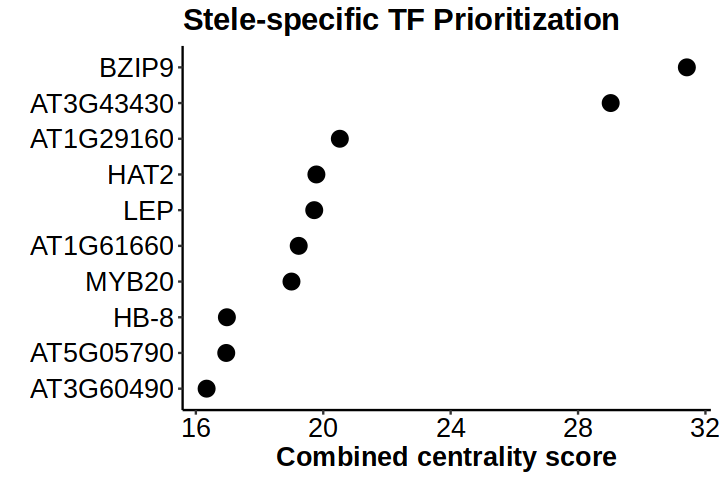

In [253]:
options(repr.plot.width=6, repr.plot.height=4)
ggplot(stele_rank[1:10,], aes(x=reorder(GeneName, stele, decreasing = FALSE),  y=stele)) + geom_point(size=4)+ 
  labs(title="Stele-specific TF Prioritization",x="", y = "Combined centrality score")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

In [254]:
write.csv(stele_rank,"Stele_TF_centrality_all_transition_zscore3.csv", quote=FALSE, row.names=TRUE)

In [255]:
tf_rank <- stele_rank %>% rownames(.)
# Max 20
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_bc(tf_rank[15])
p4 <- plot_bc(tf_rank[16]) + plot_bc(tf_rank[17]) + plot_bc(tf_rank[18]) + plot_bc(tf_rank[19]) + plot_bc(tf_rank[20])

p5 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p6 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
p7 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_oc(tf_rank[15])
p8 <- plot_oc(tf_rank[16]) + plot_oc(tf_rank[17]) + plot_oc(tf_rank[18]) + plot_oc(tf_rank[19]) + plot_oc(tf_rank[20])

p9 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p10 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
p11 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_ic(tf_rank[15])
p12 <- plot_ic(tf_rank[16]) + plot_ic(tf_rank[17]) + plot_ic(tf_rank[18]) + plot_ic(tf_rank[19]) + plot_ic(tf_rank[20])

In [256]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
p3 <- grid.grabExpr(draw(p3))
p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
p7 <- grid.grabExpr(draw(p7))
p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
p10 <- grid.grabExpr(draw(p10))
p11 <- grid.grabExpr(draw(p11))
p12 <- grid.grabExpr(draw(p12))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

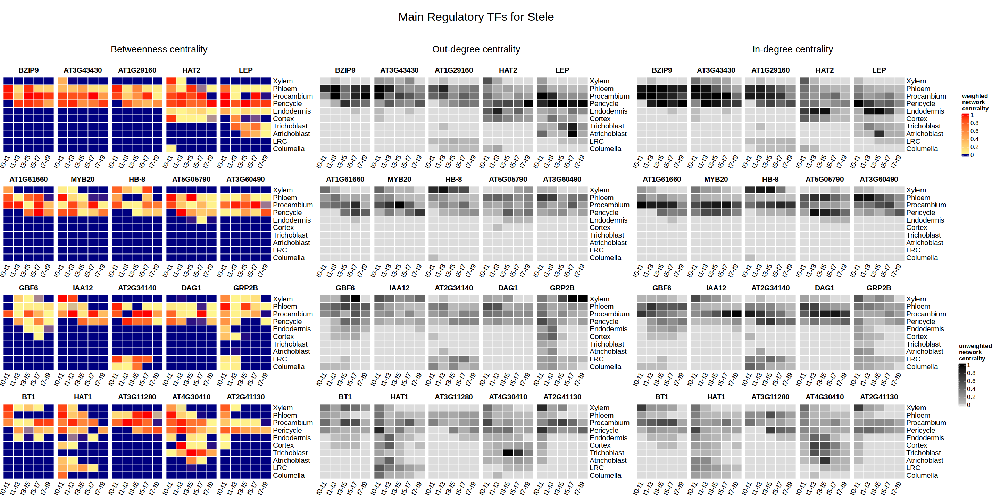

In [257]:
options(repr.plot.width=24, repr.plot.height=12)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Stele", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,p3,p4,nrow=4),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p5,p6,p7,p8,nrow=4),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p9,p10,p11,p12,nrow=4),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))

## Root Cap

In [258]:
rc_rank <- bc_rank[which(bc_rank$rc*2 > bc_rank$all),]%>% arrange(desc(rc))
rc_rank <- rc_rank[-c(match(rownames(lrc_rank), rownames(rc_rank)),match(rownames(col_rank), rownames(rc_rank))),]
rc_rank$GeneName <- rownames(rc_rank)

In [259]:
rc_rank

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID,ground,epi,stele,epilrc,rc,GeneName
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
NAI1,26.293062,4.5314653,2.427442200,0.44536331,0.205157772,0.000000000,0.000000000,0.000000000,0.000000000,10.314757,8.368876,AT2G22770,0.650521086,6.9589075,0.000000000,17.273665,18.683633,NAI1
BT2,21.465456,3.1938182,1.318831580,0.18657044,0.008604207,0.000000000,0.000000000,0.000000000,0.000000000,8.804608,7.953024,AT3G48360,0.195174642,4.5126498,0.000000000,13.317258,16.757632,BT2
PLT1,23.975143,3.9406082,0.000000000,2.00953127,1.492057686,0.056998421,0.000000000,0.000000000,0.000000000,9.148008,7.327940,AT3G20840,3.501588961,3.9406082,0.056998421,13.088616,16.475948,PLT1
AT1G32700,20.287087,0.1296096,0.000000000,0.04078096,0.127253345,0.687116252,1.191763395,0.276300728,2.201376646,6.967438,8.665448,AT1G32700,0.168034301,0.1296096,4.356557021,7.097048,15.632886,AT1G32700
AT1G36060,19.317669,3.2888697,0.911066727,0.41545573,0.417050853,0.014384784,0.000000000,0.000000000,0.000000000,7.431263,6.839578,AT1G36060,0.832506586,4.1999364,0.014384784,11.631200,14.270841,AT1G36060
AT1G26680,17.564236,2.1107861,0.000000000,1.49577760,0.073110164,0.000000000,0.000000000,0.000000000,0.000000000,8.564404,5.320157,AT1G26680,1.568887761,2.1107861,0.000000000,10.675190,13.884562,AT1G26680
LBD15,19.199671,1.9941258,0.583368907,0.18501785,0.012611943,0.000000000,0.000000000,2.574826946,0.000000000,7.823366,6.026353,AT2G40470,0.197629793,2.5774947,2.574826946,10.400861,13.849719,LBD15
CRF3,23.156426,3.7281317,2.509432523,1.56346321,1.455509716,0.227972445,0.046967234,0.000000000,0.007808814,9.414626,4.202514,AT5G53290,3.018972922,6.2375642,0.282748493,15.652190,13.617140,CRF3
SMB,18.647620,3.7951559,0.154934264,1.38856149,0.208595675,0.000000000,0.000000000,0.000000000,0.000000000,6.953647,6.146726,AT1G79580,1.597157170,3.9500901,0.000000000,10.903737,13.100372,SMB


In [260]:
rc_rank[1:50,]

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID,ground,epi,stele,epilrc,rc,GeneName
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
NAI1,26.293062,4.53146528,2.427442200,0.44536331,0.205157772,0.000000000,0.000000000,0.000000000,0.000000000,10.3147574,8.368876,AT2G22770,0.650521086,6.95890748,0.000000000,17.273665,18.683633,NAI1
BT2,21.465456,3.19381823,1.318831580,0.18657044,0.008604207,0.000000000,0.000000000,0.000000000,0.000000000,8.8046078,7.953024,AT3G48360,0.195174642,4.51264981,0.000000000,13.317258,16.757632,BT2
PLT1,23.975143,3.94060825,0.000000000,2.00953127,1.492057686,0.056998421,0.000000000,0.000000000,0.000000000,9.1480076,7.327940,AT3G20840,3.501588961,3.94060825,0.056998421,13.088616,16.475948,PLT1
AT1G32700,20.287087,0.12960958,0.000000000,0.04078096,0.127253345,0.687116252,1.191763395,0.276300728,2.201376646,6.9674380,8.665448,AT1G32700,0.168034301,0.12960958,4.356557021,7.097048,15.632886,AT1G32700
AT1G36060,19.317669,3.28886970,0.911066727,0.41545573,0.417050853,0.014384784,0.000000000,0.000000000,0.000000000,7.4312633,6.839578,AT1G36060,0.832506586,4.19993643,0.014384784,11.631200,14.270841,AT1G36060
AT1G26680,17.564236,2.11078613,0.000000000,1.49577760,0.073110164,0.000000000,0.000000000,0.000000000,0.000000000,8.5644043,5.320157,AT1G26680,1.568887761,2.11078613,0.000000000,10.675190,13.884562,AT1G26680
LBD15,19.199671,1.99412577,0.583368907,0.18501785,0.012611943,0.000000000,0.000000000,2.574826946,0.000000000,7.8233664,6.026353,AT2G40470,0.197629793,2.57749468,2.574826946,10.400861,13.849719,LBD15
CRF3,23.156426,3.72813165,2.509432523,1.56346321,1.455509716,0.227972445,0.046967234,0.000000000,0.007808814,9.4146263,4.202514,AT5G53290,3.018972922,6.23756418,0.282748493,15.652190,13.617140,CRF3
SMB,18.647620,3.79515586,0.154934264,1.38856149,0.208595675,0.000000000,0.000000000,0.000000000,0.000000000,6.9536467,6.146726,AT1G79580,1.597157170,3.95009013,0.000000000,10.903737,13.100372,SMB


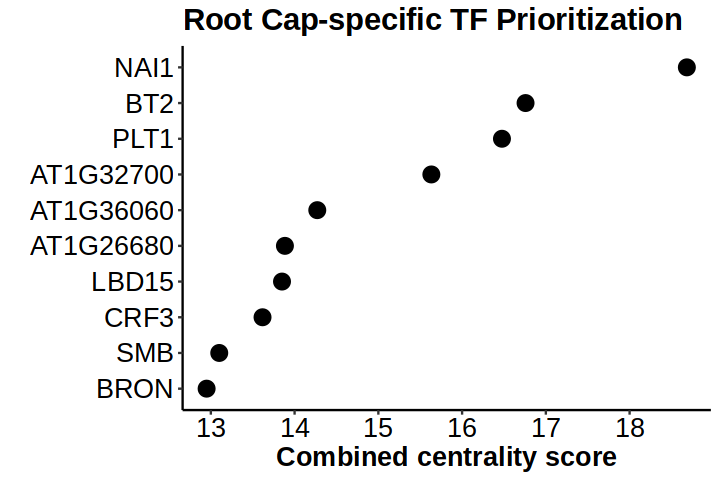

In [261]:
options(repr.plot.width=6, repr.plot.height=4)
ggplot(rc_rank[1:10,], aes(x=reorder(GeneName, rc, decreasing = FALSE),  y=rc)) + geom_point(size=4)+ 
  labs(title="Root Cap-specific TF Prioritization",x="", y = "Combined centrality score")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

In [262]:
write.csv(rc_rank,"Root_Cap_TF_centrality_all_transition_zscore3.csv", quote=FALSE, row.names=TRUE)

In [263]:
tf_rank <- rc_rank %>% rownames(.)
# Max 20
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_bc(tf_rank[15])
p4 <- plot_bc(tf_rank[16]) + plot_bc(tf_rank[17]) + plot_bc(tf_rank[18]) + plot_bc(tf_rank[19]) + plot_bc(tf_rank[20])

p5 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p6 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
p7 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_oc(tf_rank[15])
p8 <- plot_oc(tf_rank[16]) + plot_oc(tf_rank[17]) + plot_oc(tf_rank[18]) + plot_oc(tf_rank[19]) + plot_oc(tf_rank[20])

p9 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p10 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
p11 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_ic(tf_rank[15])
p12 <- plot_ic(tf_rank[16]) + plot_ic(tf_rank[17]) + plot_ic(tf_rank[18]) + plot_ic(tf_rank[19]) + plot_ic(tf_rank[20])

In [264]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
p3 <- grid.grabExpr(draw(p3))
p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
p7 <- grid.grabExpr(draw(p7))
p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
p10 <- grid.grabExpr(draw(p10))
p11 <- grid.grabExpr(draw(p11))
p12 <- grid.grabExpr(draw(p12))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

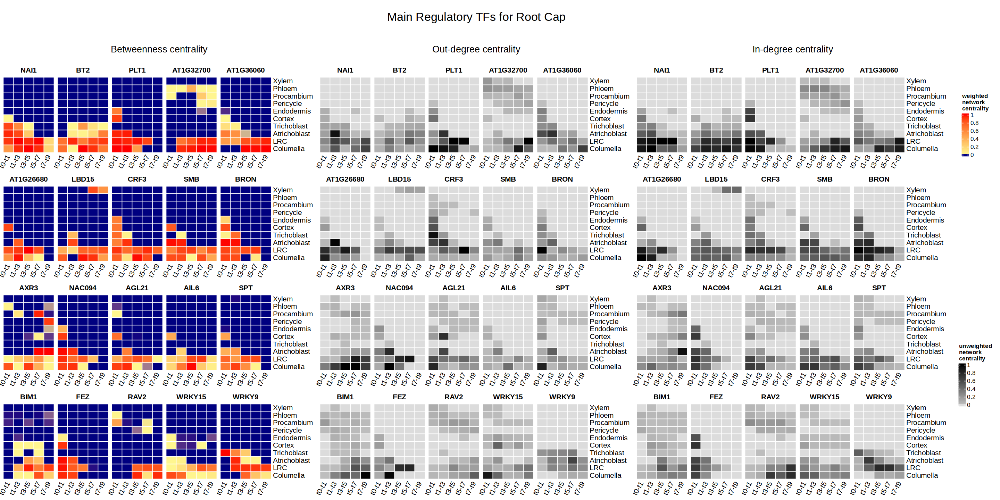

In [265]:
options(repr.plot.width=24, repr.plot.height=12)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Root Cap", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,p3,p4,nrow=4),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p5,p6,p7,p8,nrow=4),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p9,p10,p11,p12,nrow=4),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))